# Intelligent Microscopy for Materials

## Notebook 01 — SEM Dataset Audit

### Objective

This notebook performs the initial audit of a scanning electron microscopy
(SEM) image dataset before any machine-learning or deep-learning modelling.

The goals are to:

1. verify the dataset structure and class labels;
2. determine the number of images in each morphology class;
3. inspect image dimensions, channels, and file integrity;
4. visualize representative SEM images;
5. quantify class imbalance;
6. identify potential preprocessing issues and sources of data leakage;
7. define a reproducible training, validation, and test strategy.

### Dataset

**NFFA-EUROPE 100% SEM Dataset, Version 2.0**

The dataset contains 21,169 scanning electron microscopy images classified
into ten morphology categories.

Raw microscopy images are not redistributed in this repository.

In [1]:
from pathlib import Path
import os
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image

SEED = 42

random.seed(SEED)
np.random.seed(SEED)

print("Environment initialized.")
print(f"Random seed: {SEED}")

Environment initialized.
Random seed: 42


In [2]:
# Create temporary directories for the SEM dataset

DATA_ROOT = Path("/content/sem_data")
ARCHIVE_ROOT = Path("/content/sem_archives")

DATA_ROOT.mkdir(parents=True, exist_ok=True)
ARCHIVE_ROOT.mkdir(parents=True, exist_ok=True)

print(f"Dataset folder: {DATA_ROOT}")
print(f"Archive folder: {ARCHIVE_ROOT}")

Dataset folder: /content/sem_data
Archive folder: /content/sem_archives


In [3]:
# Download the Fibres subset from the official NFFA-EUROPE record

FIBRES_URL = (
    "https://b2share.eudat.eu/records/"
    "zja8y-53j14/files/Fibres.tar?download=1"
)

fibres_archive = ARCHIVE_ROOT / "Fibres.tar"

!wget -O "$fibres_archive" "$FIBRES_URL"

print(f"\nDownloaded to: {fibres_archive}")

--2026-09-08 10:09:37--  https://b2share.eudat.eu/records/zja8y-53j14/files/Fibres.tar?download=1
Resolving b2share.eudat.eu (b2share.eudat.eu)... 86.50.166.117, 2001:708:10:6802::12
Connecting to b2share.eudat.eu (b2share.eudat.eu)|86.50.166.117|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 80977920 (77M) [application/octet-stream]
Saving to: ‘/content/sem_archives/Fibres.tar’

/content/sem_archiv 100%[===================>]  77.23M  12.5MB/s    in 6.9s    

2026-09-08 10:09:45 (11.2 MB/s) - ‘/content/sem_archives/Fibres.tar’ saved [80977920/80977920]


Downloaded to: /content/sem_archives/Fibres.tar


In [4]:
# Check that the archive exists and inspect its size

if fibres_archive.exists():
    size_mb = fibres_archive.stat().st_size / (1024 ** 2)

    print("Archive found.")
    print(f"Size: {size_mb:.2f} MB")
else:
    print("Archive was not downloaded.")

Archive found.
Size: 77.23 MB


In [5]:
import tarfile

with tarfile.open(fibres_archive, "r") as tar:
    tar.extractall(DATA_ROOT)

print("Extraction complete.")
print("Contents of data directory:")

for item in DATA_ROOT.iterdir():
    print("-", item.name)

Extraction complete.
Contents of data directory:
- Fibres


/tmp/ipykernel_993/2444498830.py:4: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(DATA_ROOT)


In [6]:
fibres_dir = DATA_ROOT / "Fibres"

image_files = [
    p for p in fibres_dir.iterdir()
    if p.is_file()
]

print(f"Fibres directory: {fibres_dir}")
print(f"Number of files: {len(image_files)}")

print("\nFirst 10 files:")
for p in image_files[:10]:
    print("-", p.name)

Fibres directory: /content/sem_data/Fibres
Number of files: 150

First 10 files:
- L9_101598f903952ce5824bb684d6b49b04.jpg
- L9_b3eb41aa88f18cde89c43b63566b6781.jpg
- L9_43f3cd91d2fa7eb39be50038a3ffc3f0.jpg
- L9_868551a78f03d7f5f119596a961d842d.jpg
- L9_e3899d1ae2a773ee9da752bac01ec6d9.jpg
- L9_f5c7146c809e6ceee19a47bf20870b49.jpg
- L9_00fc0a86bd4f02995acdd5b3f63401b9.jpg
- L9_f1415c2cb89edfe5890a997261c43a93.jpg
- L9_f8a3b60ce378b5295ccde3d9f81f6911.jpg
- L9_af43a236f7eada10370dcbe98513a342.jpg


In [7]:
from collections import Counter

extensions = Counter(p.suffix.lower() for p in image_files)

print("File extensions:")
for ext, count in extensions.items():
    print(f"{ext}: {count}")

File extensions:
.jpg: 150


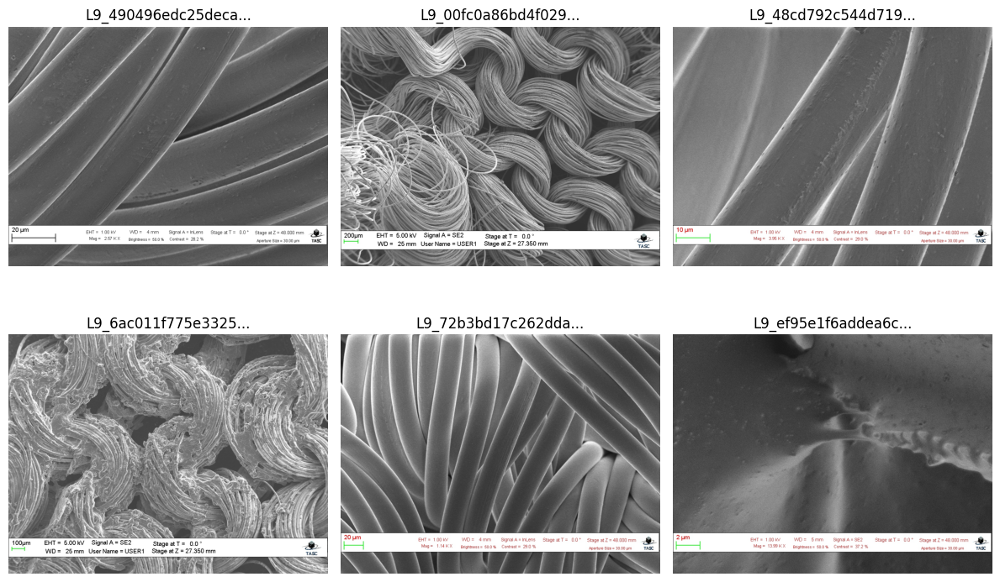

In [8]:
# Display a few SEM fibre images

sample_files = random.sample(image_files, 6)

fig, axes = plt.subplots(2, 3, figsize=(12, 8))

for ax, img_path in zip(axes.flat, sample_files):
    img = Image.open(img_path)

    ax.imshow(img, cmap="gray")
    ax.set_title(img_path.name[:18] + "...")
    ax.axis("off")

plt.tight_layout()
plt.show()

In [9]:
# Inspect image dimensions and modes

for img_path in sample_files:
    with Image.open(img_path) as img:
        print(
            f"{img_path.name[:18]}...  "
            f"size={img.size}, mode={img.mode}"
        )

L9_490496edc25deca...  size=(1024, 768), mode=RGB
L9_00fc0a86bd4f029...  size=(1024, 768), mode=RGB
L9_48cd792c544d719...  size=(1024, 768), mode=RGB
L9_6ac011f775e3325...  size=(1024, 768), mode=RGB
L9_72b3bd17c262dda...  size=(1024, 768), mode=RGB
L9_ef95e1f6addea6c...  size=(1024, 768), mode=RGB


In [10]:
# Audit dimensions and image modes for every Fibres image

records = []

for img_path in image_files:
    try:
        with Image.open(img_path) as img:
            records.append({
                "filename": img_path.name,
                "width": img.width,
                "height": img.height,
                "mode": img.mode,
                "valid": True
            })
    except Exception as e:
        records.append({
            "filename": img_path.name,
            "width": None,
            "height": None,
            "mode": None,
            "valid": False
        })

fibres_audit = pd.DataFrame(records)

print("Images audited:", len(fibres_audit))
print("Valid images:", fibres_audit["valid"].sum())
print("Invalid images:", (~fibres_audit["valid"]).sum())

Images audited: 150
Valid images: 150
Invalid images: 0


In [11]:
print("Image dimensions:")
display(
    fibres_audit.groupby(["width", "height"])
    .size()
    .reset_index(name="count")
)

print("\nImage modes:")
display(
    fibres_audit["mode"]
    .value_counts()
    .rename_axis("mode")
    .reset_index(name="count")
)

Image dimensions:


,width,height,count
0,1024,768,150



Image modes:


,mode,count
0,RGB,150


## 2. Initial Image-Integrity Assessment

All 150 images in the Fibres subset were successfully opened, with no
corrupted or unreadable files detected.

The subset is highly consistent in its basic image format:

- **Image count:** 150
- **Resolution:** 1024 × 768 pixels
- **Image mode:** RGB
- **Invalid images:** 0

Although the SEM micrographs are visually grayscale, the files are encoded
using three RGB channels.

Visual inspection also revealed acquisition-information strips along the
bottom of the images. These contain elements such as scale bars, magnification
information, instrument settings, and text.

This is important for machine learning because a model could potentially
learn correlations from acquisition metadata rather than from the material
morphology itself. Therefore, metadata removal will be investigated as part
of the preprocessing strategy.

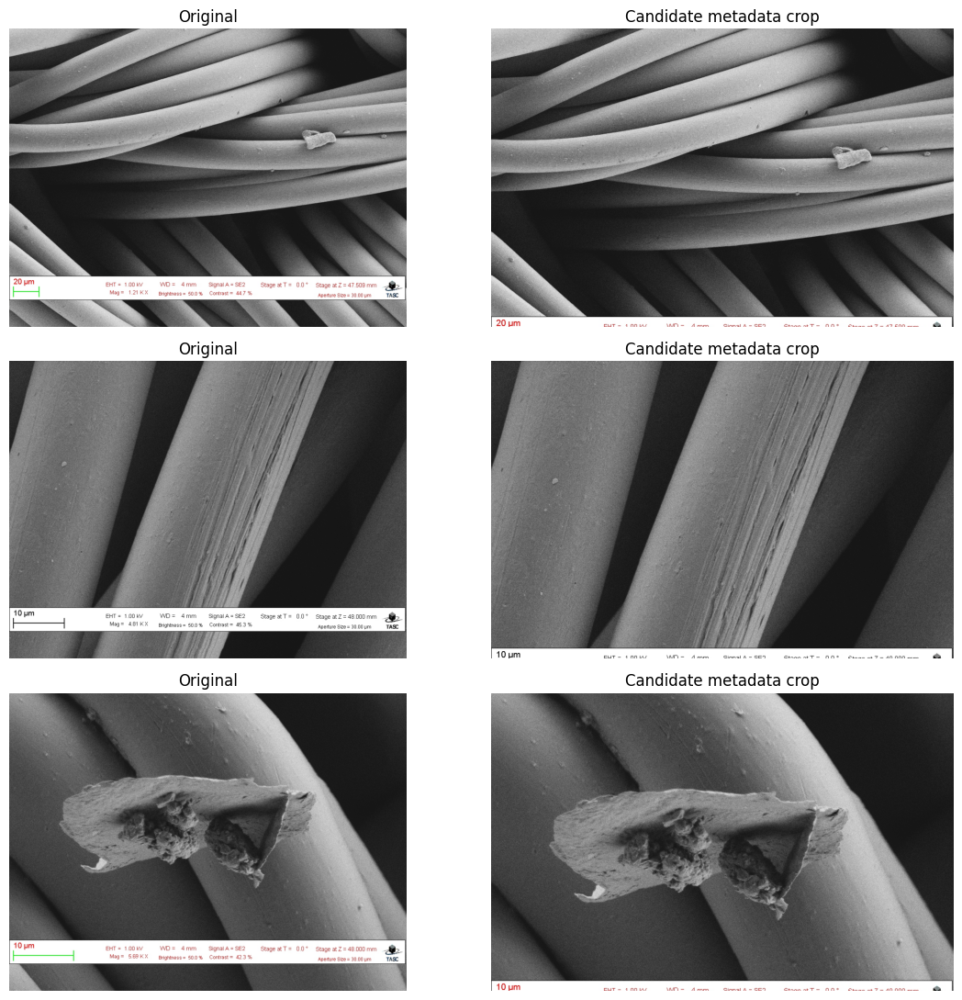

In [13]:
# Preview removal of the lower SEM metadata strip

BOTTOM_CROP_FRACTION = 0.14

preview_files = random.sample(image_files, 3)

fig, axes = plt.subplots(3, 2, figsize=(12, 11))

for row, img_path in enumerate(preview_files):
    with Image.open(img_path) as img:
        img = img.copy()

    crop_height = int(img.height * (1 - BOTTOM_CROP_FRACTION))
    cropped = img.crop((0, 0, img.width, crop_height))

    axes[row, 0].imshow(img)
    axes[row, 0].set_title("Original")
    axes[row, 0].axis("off")

    axes[row, 1].imshow(cropped)
    axes[row, 1].set_title("Candidate metadata crop")
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

## 3. Metadata-Strip Removal

Initial visual inspection showed that cropping the lower 14% of each image
did not completely remove the SEM acquisition-information strip.

Because all images examined in the Fibres subset have the same resolution
(1024 × 768 pixels), a fixed vertical crop can be evaluated instead of a
fractional crop.

Removing acquisition metadata is important because scale bars, microscope
settings, magnification labels, and instrument-specific text may provide
spurious class information. A deep-learning model should learn material
morphology rather than acquisition metadata.

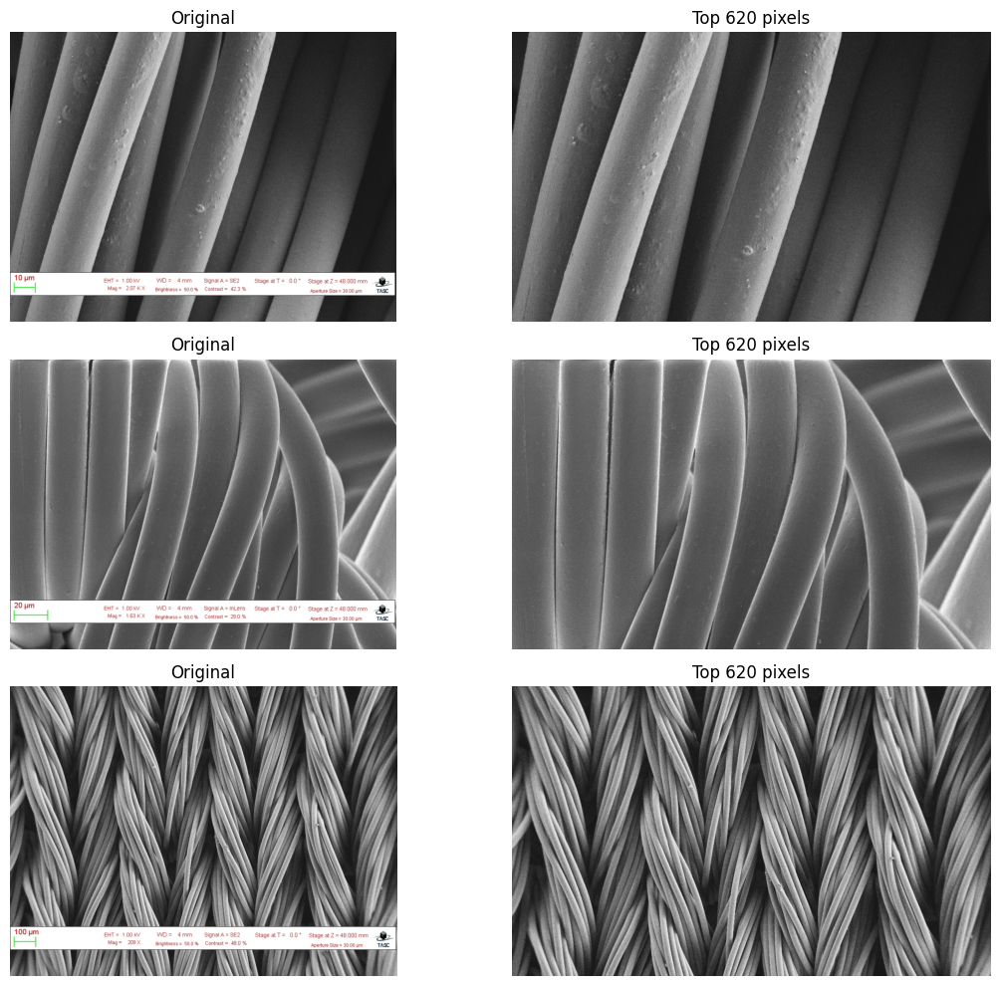

In [14]:
# Evaluate a fixed crop that removes the SEM metadata strip

CROP_HEIGHT = 620

preview_files = random.sample(image_files, 3)

fig, axes = plt.subplots(3, 2, figsize=(12, 10))

for row, img_path in enumerate(preview_files):
    with Image.open(img_path) as img:
        img = img.copy()

    cropped = img.crop((0, 0, img.width, CROP_HEIGHT))

    axes[row, 0].imshow(img)
    axes[row, 0].set_title("Original")
    axes[row, 0].axis("off")

    axes[row, 1].imshow(cropped)
    axes[row, 1].set_title(f"Top {CROP_HEIGHT} pixels")
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

### Candidate Crop Result

A fixed crop retaining the top 620 pixels successfully removed the visible
SEM acquisition-information strip from the sampled Fibres images while
preserving the relevant morphology.

This crop is therefore retained as a **candidate preprocessing rule**.

However, it is not yet considered final because metadata-strip dimensions
may differ between morphology classes. The same crop must be evaluated on
representative images from additional classes before being adopted for the
full dataset.

## 4. Cross-Class Preprocessing Validation

A preprocessing rule should not be selected using only one morphology class.

The candidate 620-pixel crop will therefore be evaluated on additional SEM
morphology categories. This helps determine whether acquisition metadata is
positioned consistently across the dataset and whether the crop preserves
scientifically relevant image regions.

The next class examined is **Porous/Sponge**, which provides a substantially
different morphology from Fibres.

In [15]:
# Download the Porous/Sponge subset

POROUS_URL = (
    "https://b2share.eudat.eu/records/"
    "zja8y-53j14/files/Porous_Sponge.tar?download=1"
)

porous_archive = ARCHIVE_ROOT / "Porous_Sponge.tar"

!wget -O "$porous_archive" "$POROUS_URL"

size_mb = porous_archive.stat().st_size / (1024 ** 2)

print(f"\nDownloaded to: {porous_archive}")
print(f"Archive size: {size_mb:.2f} MiB")

--2026-09-08 10:27:09--  https://b2share.eudat.eu/records/zja8y-53j14/files/Porous_Sponge.tar?download=1
Resolving b2share.eudat.eu (b2share.eudat.eu)... 86.50.166.117, 2001:708:10:6802::12
Connecting to b2share.eudat.eu (b2share.eudat.eu)|86.50.166.117|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 119562240 (114M) [application/octet-stream]
Saving to: ‘/content/sem_archives/Porous_Sponge.tar’

/content/sem_archiv 100%[===================>] 114.02M  12.7MB/s    in 9.1s    

2026-09-08 10:27:19 (12.6 MB/s) - ‘/content/sem_archives/Porous_Sponge.tar’ saved [119562240/119562240]


Downloaded to: /content/sem_archives/Porous_Sponge.tar
Archive size: 114.02 MiB


In [16]:
with tarfile.open(porous_archive, "r") as tar:
    tar.extractall(DATA_ROOT)

print("Extraction complete.")

for item in DATA_ROOT.iterdir():
    print("-", item.name)

Extraction complete.
- Porous_Sponge
- Fibres


/tmp/ipykernel_993/3615903969.py:2: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(DATA_ROOT)


### Porous/Sponge Subset Inspection

The Porous/Sponge class was downloaded and extracted successfully.

Before evaluating the candidate metadata crop, this subset will be audited for:

- image count;
- file format;
- image dimensions;
- image mode;
- corrupted or unreadable files.

This checks whether the preprocessing assumptions identified for the Fibres
class also hold for a visually distinct morphology class.

In [17]:
# Inspect the Porous/Sponge subset

porous_dir = DATA_ROOT / "Porous_Sponge"

porous_files = [
    p for p in porous_dir.iterdir()
    if p.is_file()
]

print(f"Porous/Sponge directory: {porous_dir}")
print(f"Number of files: {len(porous_files)}")

extensions = Counter(p.suffix.lower() for p in porous_files)

print("\nFile extensions:")
for ext, count in extensions.items():
    print(f"{ext}: {count}")

Porous/Sponge directory: /content/sem_data/Porous_Sponge
Number of files: 174

File extensions:
.jpg: 174


In [18]:
# Audit dimensions, image modes, and file integrity

porous_records = []

for img_path in porous_files:
    try:
        with Image.open(img_path) as img:
            porous_records.append({
                "filename": img_path.name,
                "width": img.width,
                "height": img.height,
                "mode": img.mode,
                "valid": True
            })

    except Exception:
        porous_records.append({
            "filename": img_path.name,
            "width": None,
            "height": None,
            "mode": None,
            "valid": False
        })

porous_audit = pd.DataFrame(porous_records)

print("Images audited:", len(porous_audit))
print("Valid images:", porous_audit["valid"].sum())
print("Invalid images:", (~porous_audit["valid"]).sum())

print("\nImage dimensions:")
display(
    porous_audit.groupby(["width", "height"])
    .size()
    .reset_index(name="count")
)

print("\nImage modes:")
display(
    porous_audit["mode"]
    .value_counts()
    .rename_axis("mode")
    .reset_index(name="count")
)

Images audited: 174
Valid images: 174
Invalid images: 0

Image dimensions:


,width,height,count
0,1024,768,174



Image modes:


,mode,count
0,RGB,174


### Porous/Sponge Audit Result

The Porous/Sponge subset contains 174 valid JPEG images with no corrupted
files detected.

All images have the same resolution and encoding observed in the Fibres
subset:

- **Image count:** 174
- **Resolution:** 1024 × 768 pixels
- **Image mode:** RGB
- **Invalid images:** 0

The agreement between the first two morphology classes suggests that the
dataset follows a relatively consistent image format. However, preprocessing
decisions must still be validated visually because acquisition-information
strips may vary between images or classes.

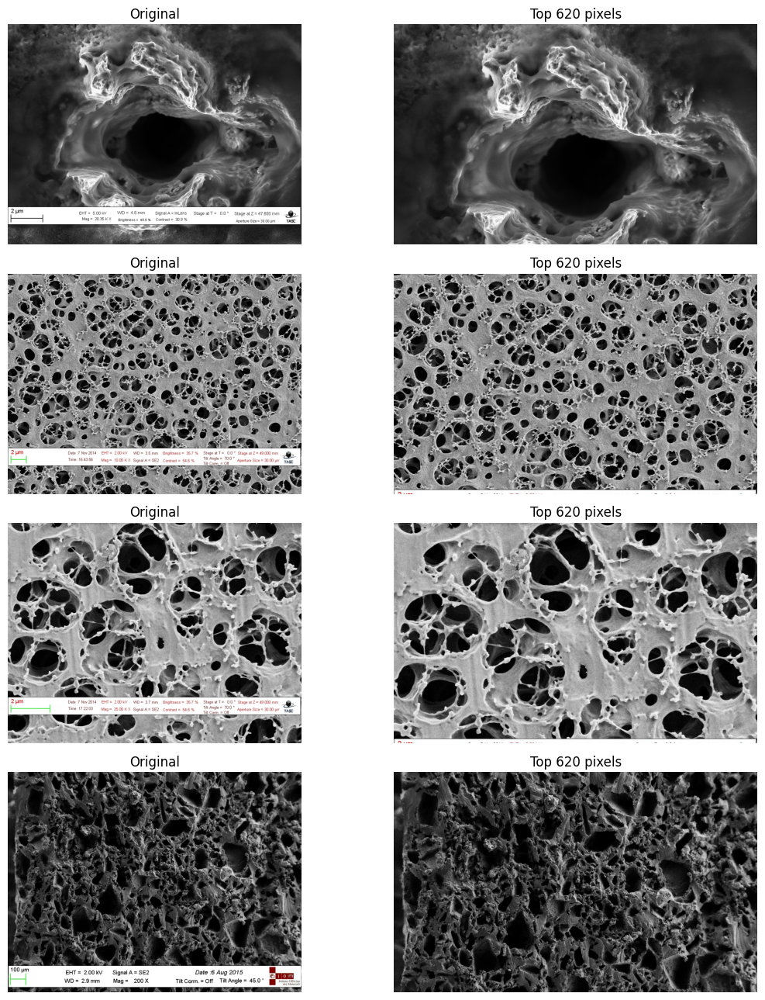

In [19]:
# Compare original and candidate-cropped Porous/Sponge images

porous_preview = random.sample(porous_files, 4)

fig, axes = plt.subplots(4, 2, figsize=(12, 13))

for row, img_path in enumerate(porous_preview):
    with Image.open(img_path) as img:
        img = img.copy()

    cropped = img.crop((0, 0, img.width, CROP_HEIGHT))

    axes[row, 0].imshow(img)
    axes[row, 0].set_title("Original")
    axes[row, 0].axis("off")

    axes[row, 1].imshow(cropped)
    axes[row, 1].set_title(f"Top {CROP_HEIGHT} pixels")
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

### Cross-Class Crop Evaluation

The 620-pixel crop removed most of the acquisition-information strip from
the Porous/Sponge images. However, small remnants of colored metadata remained
visible along the lower edge of several cropped images.

This indicates that the metadata boundary is not identical across all images,
even though the image dimensions are consistent.

Therefore, the 620-pixel boundary is not adopted as the final preprocessing
rule. A slightly more conservative crop will be evaluated using the same
images so that the effect of the crop boundary can be compared directly.

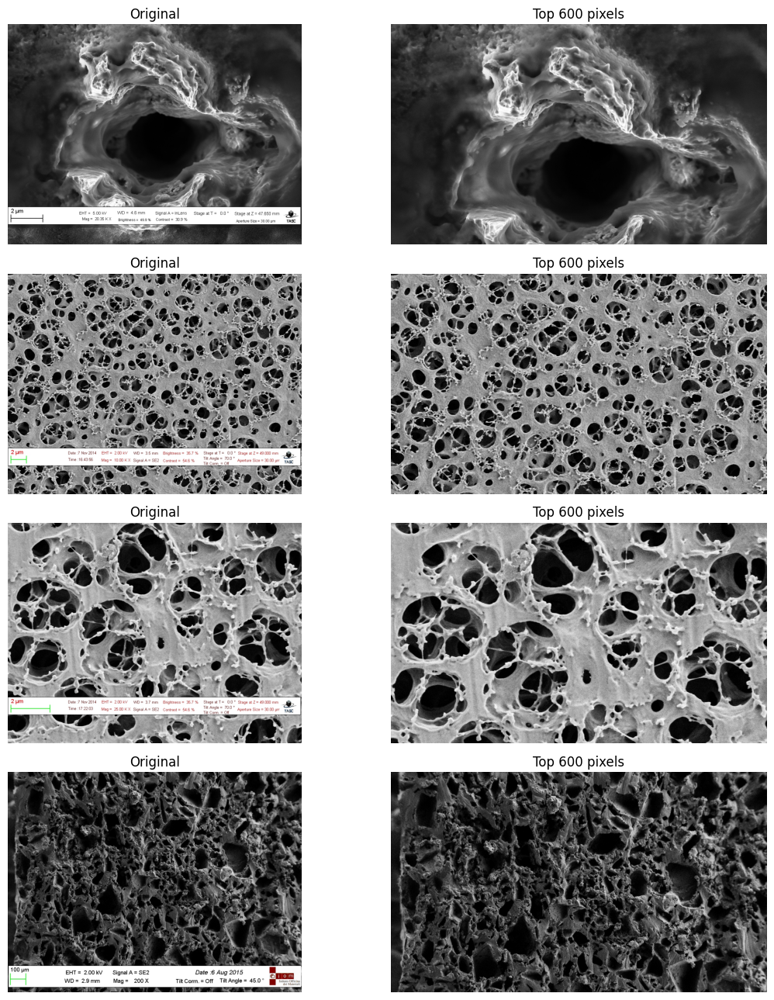

In [20]:
# Test a more conservative metadata crop

TEST_CROP_HEIGHT = 600

fig, axes = plt.subplots(4, 2, figsize=(12, 13))

for row, img_path in enumerate(porous_preview):
    with Image.open(img_path) as img:
        img = img.copy()

    cropped = img.crop((0, 0, img.width, TEST_CROP_HEIGHT))

    axes[row, 0].imshow(img)
    axes[row, 0].set_title("Original")
    axes[row, 0].axis("off")

    axes[row, 1].imshow(cropped)
    axes[row, 1].set_title(f"Top {TEST_CROP_HEIGHT} pixels")
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

### Revised Crop Evaluation

Retaining the top 600 pixels successfully removed the visible SEM
acquisition-information strip from the sampled Porous/Sponge images.

Compared with the earlier 620-pixel crop, no residual scale bars, colored
annotations, instrument text, or acquisition metadata were visible in the
inspected samples.

The crop retains approximately 78% of the original image height and preserves
the major morphological features of the porous structures.

A crop height of 600 pixels is therefore retained as the current candidate
preprocessing rule. It will be validated on additional morphology classes
before being fixed for model development.

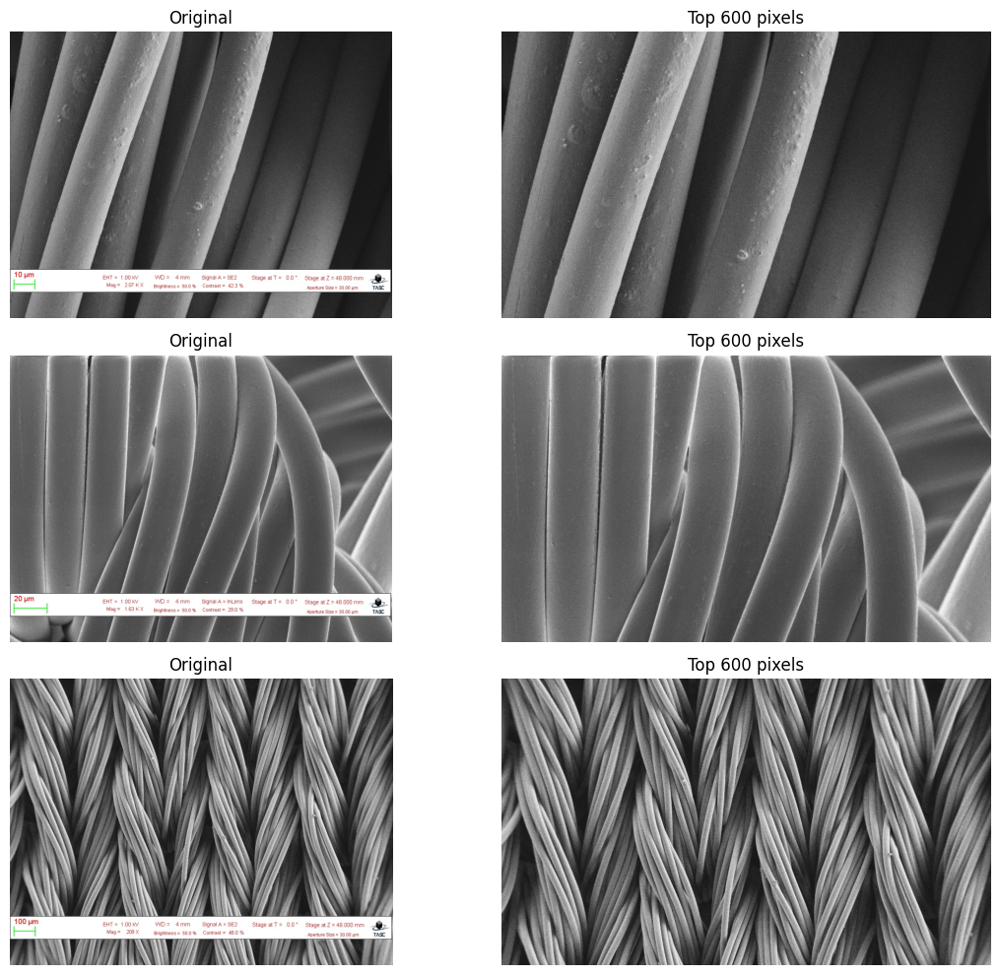

In [21]:
# Cross-check the 600-pixel crop on Fibres

fig, axes = plt.subplots(3, 2, figsize=(12, 10))

for row, img_path in enumerate(preview_files):
    with Image.open(img_path) as img:
        img = img.copy()

    cropped = img.crop((0, 0, img.width, 600))

    axes[row, 0].imshow(img)
    axes[row, 0].set_title("Original")
    axes[row, 0].axis("off")

    axes[row, 1].imshow(cropped)
    axes[row, 1].set_title("Top 600 pixels")
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

### Working Crop Selection

The 600-pixel crop was also evaluated on representative Fibres images.

No visible scale bars, acquisition text, microscope settings, or colored
metadata remained after cropping, while the relevant fibre morphology was
preserved.

The same crop has therefore performed successfully on two morphologically
distinct classes: Fibres and Porous/Sponge.

A height of **600 pixels** is retained as the working metadata-removal
parameter. This remains provisional until additional morphology classes
have been inspected.

In [22]:
# Working preprocessing parameter

CROP_HEIGHT = 600

print(f"Working crop height: {CROP_HEIGHT} pixels")
print(f"Original image height: 768 pixels")
print(f"Pixels removed: {768 - CROP_HEIGHT}")
print(f"Fraction retained: {CROP_HEIGHT / 768:.3f}")

Working crop height: 600 pixels
Original image height: 768 pixels
Pixels removed: 168
Fraction retained: 0.781


## 5. Reusable Dataset Audit Pipeline

The initial class-specific inspections confirmed that the same basic checks
are required for every morphology category.

A reusable audit function is therefore defined to collect:

- class label;
- filename;
- file path;
- file extension;
- image width and height;
- image mode;
- file-validity status.

This avoids duplicating code as additional morphology classes are added and
provides a single metadata table that can later be used for dataset-wide
quality control and exploratory analysis.

In [23]:
def audit_image_class(class_dir, class_label):
    """Audit all image files within one morphology-class directory."""

    records = []

    image_paths = [
        p for p in class_dir.iterdir()
        if p.is_file()
    ]

    for img_path in image_paths:
        try:
            with Image.open(img_path) as img:
                records.append({
                    "class": class_label,
                    "filename": img_path.name,
                    "filepath": str(img_path),
                    "extension": img_path.suffix.lower(),
                    "width": img.width,
                    "height": img.height,
                    "mode": img.mode,
                    "valid": True
                })

        except Exception:
            records.append({
                "class": class_label,
                "filename": img_path.name,
                "filepath": str(img_path),
                "extension": img_path.suffix.lower(),
                "width": None,
                "height": None,
                "mode": None,
                "valid": False
            })

    return pd.DataFrame(records)

In [24]:
# Audit the two classes currently available

fibres_metadata = audit_image_class(
    DATA_ROOT / "Fibres",
    "Fibres"
)

porous_metadata = audit_image_class(
    DATA_ROOT / "Porous_Sponge",
    "Porous/Sponge"
)

sem_metadata = pd.concat(
    [fibres_metadata, porous_metadata],
    ignore_index=True
)

print(f"Total images currently indexed: {len(sem_metadata)}")

display(sem_metadata.head())

Total images currently indexed: 324


,class,filename,filepath,extension,width,height,mode,valid
0,Fibres,L9_101598f903952ce5824bb684d6b49b04.jpg,/content/sem_data/Fibres/L9_101598f903952ce582...,.jpg,1024,768,RGB,True
1,Fibres,L9_b3eb41aa88f18cde89c43b63566b6781.jpg,/content/sem_data/Fibres/L9_b3eb41aa88f18cde89...,.jpg,1024,768,RGB,True
2,Fibres,L9_43f3cd91d2fa7eb39be50038a3ffc3f0.jpg,/content/sem_data/Fibres/L9_43f3cd91d2fa7eb39b...,.jpg,1024,768,RGB,True
3,Fibres,L9_868551a78f03d7f5f119596a961d842d.jpg,/content/sem_data/Fibres/L9_868551a78f03d7f5f1...,.jpg,1024,768,RGB,True
4,Fibres,L9_e3899d1ae2a773ee9da752bac01ec6d9.jpg,/content/sem_data/Fibres/L9_e3899d1ae2a773ee9d...,.jpg,1024,768,RGB,True


## 6. Dataset-Level Summary

The metadata from all currently available morphology classes are combined
into a single table.

This enables dataset-level quality-control checks, including:

- class distribution;
- file validity;
- consistency of image dimensions;
- consistency of image encoding;
- potential class imbalance.

At this stage, the dataset contains only the Fibres and Porous/Sponge
subsets. The same analysis will automatically expand as additional classes
are added.

In [25]:
# Summarize the currently indexed dataset

class_summary = (
    sem_metadata
    .groupby("class")
    .agg(
        images=("filename", "count"),
        valid_images=("valid", "sum")
    )
    .reset_index()
)

class_summary["percentage"] = (
    class_summary["images"] / len(sem_metadata) * 100
)

display(class_summary)

print(f"Total indexed images: {len(sem_metadata)}")
print(f"Total valid images: {sem_metadata['valid'].sum()}")
print(f"Total invalid images: {(~sem_metadata['valid']).sum()}")

,class,images,valid_images,percentage
0,Fibres,150,150,46.296296
1,Porous/Sponge,174,174,53.703704


Total indexed images: 324
Total valid images: 324
Total invalid images: 0


### Class Distribution

Class frequency is important because strongly imbalanced training data can
cause a classifier to favor common morphology categories.

The current two-class subset is relatively balanced. However, this does not
represent the full ten-class dataset, and class imbalance will be reassessed
after all morphology categories have been indexed.

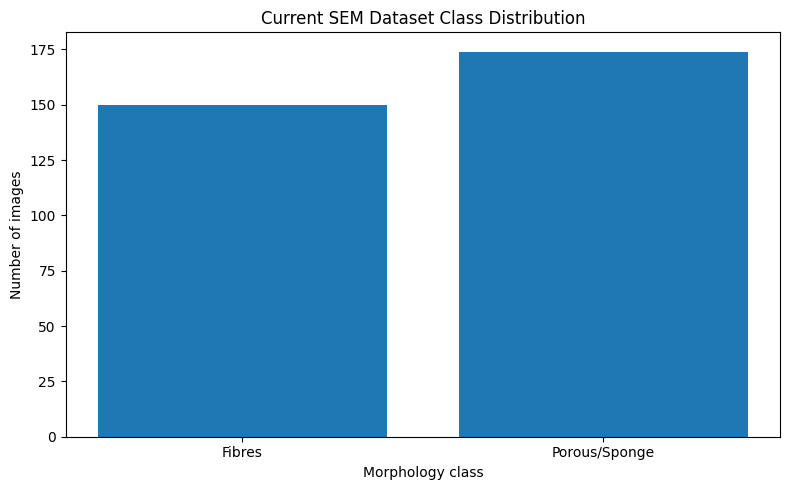

In [26]:
# Visualize the current class distribution

plt.figure(figsize=(8, 5))

plt.bar(
    class_summary["class"],
    class_summary["images"]
)

plt.xlabel("Morphology class")
plt.ylabel("Number of images")
plt.title("Current SEM Dataset Class Distribution")

plt.tight_layout()
plt.show()

## 7. Exact-Duplicate and Leakage Audit

Duplicate images can cause serious data leakage in image-classification
experiments.

If identical images occur in both the training and test sets, model
performance may be artificially inflated because the model has already seen
the same visual information during training.

Cryptographic hashes are therefore calculated for the currently available
images. Images with identical file-content hashes are treated as exact
duplicates.

Both within-class and cross-class duplicates are examined.

In [27]:
import hashlib


def calculate_md5(file_path, chunk_size=8192):
    """Calculate the MD5 hash of a file."""

    md5 = hashlib.md5()

    with open(file_path, "rb") as f:
        while True:
            chunk = f.read(chunk_size)

            if not chunk:
                break

            md5.update(chunk)

    return md5.hexdigest()


sem_metadata["md5"] = sem_metadata["filepath"].apply(calculate_md5)

print("Image hashes calculated.")
display(
    sem_metadata[
        ["class", "filename", "md5"]
    ].head()
)

Image hashes calculated.


,class,filename,md5
0,Fibres,L9_101598f903952ce5824bb684d6b49b04.jpg,c0d61425bb809df492f93895704fe6a3
1,Fibres,L9_b3eb41aa88f18cde89c43b63566b6781.jpg,6b33c3e17bf1f0d56a7ff7f640462cbc
2,Fibres,L9_43f3cd91d2fa7eb39be50038a3ffc3f0.jpg,39271a9fe42400905e49a4f3f92cfea1
3,Fibres,L9_868551a78f03d7f5f119596a961d842d.jpg,d50c336a51b4350f0e25d8b1ff21a40b
4,Fibres,L9_e3899d1ae2a773ee9da752bac01ec6d9.jpg,a2d6389782465ad4e3151611f1cacc77


In [28]:
# Identify exact duplicate image contents

duplicate_mask = sem_metadata.duplicated(
    subset="md5",
    keep=False
)

exact_duplicates = (
    sem_metadata[duplicate_mask]
    .sort_values("md5")
)

print(f"Images involved in exact duplicates: {len(exact_duplicates)}")
print(
    "Unique duplicated image contents:",
    exact_duplicates["md5"].nunique()
)

if len(exact_duplicates) > 0:
    display(
        exact_duplicates[
            ["class", "filename", "md5"]
        ]
    )
else:
    print("No exact duplicates detected.")

Images involved in exact duplicates: 4
Unique duplicated image contents: 2


,class,filename,md5
163,Porous/Sponge,L0_3ac8acf63c790f286602439f0039cc15.jpg,22b080d60bb813c5e89526235b10add1
225,Porous/Sponge,L0_9542b000ba65cf88d13afc649b5c3f71.jpg,22b080d60bb813c5e89526235b10add1
208,Porous/Sponge,L0_bbaf2aba3f987b75e124f6c06eb6e84a.jpg,605fe73ad465280f1607130ee9a3e6f4
259,Porous/Sponge,L0_0b19dd513f38a9213b227e6323a79170.jpg,605fe73ad465280f1607130ee9a3e6f4


### Exact-Duplicate Audit Result

Exact file-content hashing identified four Porous/Sponge images involved in
two duplicate groups.

Each group contains two files with identical MD5 hashes, indicating that the
files are exact byte-for-byte duplicates rather than merely visually similar
micrographs.

No exact duplicates were detected in the Fibres subset.

These duplicates must not be allowed to appear across training, validation,
and test partitions because this would introduce data leakage and could
artificially inflate model performance.

The raw source files are retained unchanged. Deduplication will instead be
performed in the analysis metadata used for subsequent modelling.

In [29]:
# Group exact duplicates by hash

duplicate_groups = {
    md5: group
    for md5, group in exact_duplicates.groupby("md5")
}

print(f"Number of duplicate groups: {len(duplicate_groups)}")

Number of duplicate groups: 2


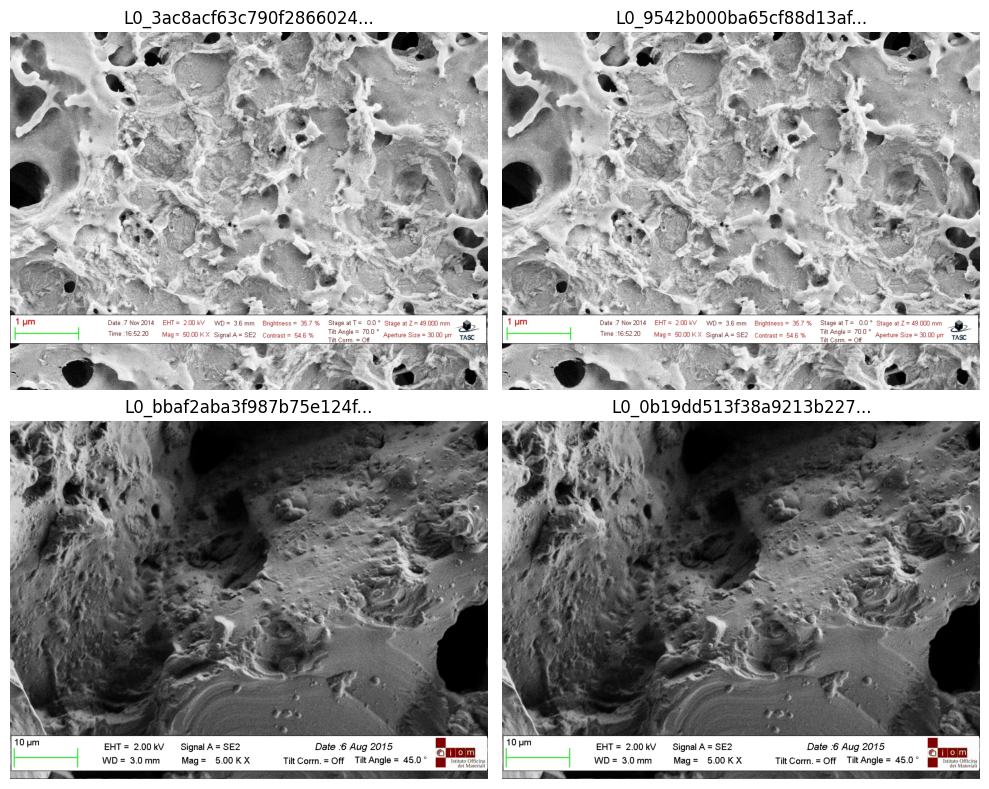

In [30]:
# Visualize the exact duplicate groups

fig, axes = plt.subplots(
    len(duplicate_groups),
    2,
    figsize=(10, 4 * len(duplicate_groups))
)

if len(duplicate_groups) == 1:
    axes = np.array([axes])

for row, (md5, group) in enumerate(duplicate_groups.items()):
    group = group.iloc[:2]

    for col, (_, record) in enumerate(group.iterrows()):
        with Image.open(record["filepath"]) as img:
            axes[row, col].imshow(img)

        axes[row, col].set_title(record["filename"][:24] + "...")
        axes[row, col].axis("off")

plt.tight_layout()
plt.show()

## 8. Leakage-Safe Dataset Index

The original downloaded dataset is preserved without modification.

For subsequent analysis and model development, a deduplicated metadata index
is created by retaining one representative from each exact-content duplicate
group.

This approach preserves data provenance while ensuring that exact duplicate
images cannot be assigned to different train, validation, or test partitions.

In [31]:
# Create a deduplicated dataset index

sem_metadata_clean = (
    sem_metadata
    .drop_duplicates(subset="md5", keep="first")
    .reset_index(drop=True)
)

removed_count = len(sem_metadata) - len(sem_metadata_clean)

print(f"Original images: {len(sem_metadata)}")
print(f"Images after exact deduplication: {len(sem_metadata_clean)}")
print(f"Duplicate files excluded: {removed_count}")

Original images: 324
Images after exact deduplication: 322
Duplicate files excluded: 2


In [32]:
clean_class_summary = (
    sem_metadata_clean
    .groupby("class")
    .size()
    .reset_index(name="images")
)

display(clean_class_summary)

,class,images
0,Fibres,150
1,Porous/Sponge,172


## 9. Perceptual Near-Duplicate Audit

Exact file hashing detects only byte-for-byte identical files.

Microscopy datasets may also contain images that represent the same or nearly
the same field of view but differ because of JPEG compression, resizing,
cropping, brightness changes, or other minor transformations. Such images can
still cause train–test leakage even though their file hashes are different.

A perceptual-hashing approach is therefore used to identify candidate
near-duplicate image pairs.

Perceptual hashes are calculated from the morphology region only, using the
working 600-pixel metadata crop. Candidate pairs are flagged for visual
inspection rather than removed automatically.

In [33]:
!pip -q install ImageHash

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 5.5 MB/s eta 0:00:00


In [34]:
import imagehash
from itertools import combinations

In [35]:
# Calculate perceptual hashes using only the morphology region

def calculate_phash(file_path, crop_height=600):
    """Calculate a perceptual hash after removing the SEM metadata region."""

    with Image.open(file_path) as img:
        morphology = img.crop(
            (0, 0, img.width, crop_height)
        ).convert("L")

        return imagehash.phash(morphology)


sem_metadata_clean["phash"] = (
    sem_metadata_clean["filepath"]
    .apply(calculate_phash)
)

print("Perceptual hashes calculated.")

display(
    sem_metadata_clean[
        ["class", "filename", "phash"]
    ].head()
)

Perceptual hashes calculated.


,class,filename,phash
0,Fibres,L9_101598f903952ce5824bb684d6b49b04.jpg,95e4f454560a7baa
1,Fibres,L9_b3eb41aa88f18cde89c43b63566b6781.jpg,baaeb20b2b3d071a
2,Fibres,L9_43f3cd91d2fa7eb39be50038a3ffc3f0.jpg,d7736d0b72141d1c
3,Fibres,L9_868551a78f03d7f5f119596a961d842d.jpg,9eaa5aa54aa54ab5
4,Fibres,L9_e3899d1ae2a773ee9da752bac01ec6d9.jpg,fe103ed07a8d7609


### Candidate Near-Duplicate Detection

The Hamming distance between two perceptual hashes measures their visual
difference in hash space.

A small distance indicates that two images may contain highly similar visual
content. A conservative threshold is used here only to identify candidates.

These candidates will not be removed solely on the basis of their hash
distance; they must first be inspected visually.

In [36]:
# Search for highly similar image pairs

PHASH_THRESHOLD = 6

candidate_pairs = []

for idx1, idx2 in combinations(
    sem_metadata_clean.index,
    2
):
    hash1 = sem_metadata_clean.loc[idx1, "phash"]
    hash2 = sem_metadata_clean.loc[idx2, "phash"]

    distance = hash1 - hash2

    if distance <= PHASH_THRESHOLD:
        candidate_pairs.append({
            "index_1": idx1,
            "index_2": idx2,
            "class_1": sem_metadata_clean.loc[idx1, "class"],
            "class_2": sem_metadata_clean.loc[idx2, "class"],
            "filename_1": sem_metadata_clean.loc[idx1, "filename"],
            "filename_2": sem_metadata_clean.loc[idx2, "filename"],
            "phash_distance": distance
        })


near_duplicate_candidates = pd.DataFrame(candidate_pairs)

print(
    "Candidate near-duplicate pairs:",
    len(near_duplicate_candidates)
)

if len(near_duplicate_candidates) > 0:
    display(
        near_duplicate_candidates
        .sort_values("phash_distance")
        .head(20)
    )
else:
    print(
        "No candidate near-duplicates detected "
        f"at threshold <= {PHASH_THRESHOLD}."
    )

Candidate near-duplicate pairs: 8


,index_1,index_2,class_1,class_2,filename_1,filename_2,phash_distance
0,161,245,Porous/Sponge,Porous/Sponge,L0_f950342cf9fdb2e0971c3850608db0bf.jpg,L0_76790e49cb19cde496a02ac9f4d69bc9.jpg,0
2,173,201,Porous/Sponge,Porous/Sponge,L0_f75d2966873ea0778bbf242ef2a56ef7.jpg,L0_8bab62b53d34fce6ae7d30d686a1f184.jpg,0
5,196,226,Porous/Sponge,Porous/Sponge,L0_cc59dc40bfb2954475b5f65aff32305a.jpg,L0_ca8beba58f6a7ef531d911940f351b32.jpg,0
1,167,296,Porous/Sponge,Porous/Sponge,L0_9daf8b25c600c83ab8050d278db44cf3.jpg,L0_d6d0ac1a5b895832f739adb5c1688b7f.jpg,2
3,190,282,Porous/Sponge,Porous/Sponge,L0_8cb9d31d4bc58bb514184cc6eddace33.jpg,L0_2e08300d0ac85d68d5ae519744e16a2d.jpg,2
4,195,274,Porous/Sponge,Porous/Sponge,L0_bee33ac22449533472917078ad495f4a.jpg,L0_a7c79a822fc5f72396daa9f523426b81.jpg,2
7,212,224,Porous/Sponge,Porous/Sponge,L0_cb76311080eae373b4efd07e317a7543.jpg,L0_f8166b8c791c0f5e8c8e55312dfec8ce.jpg,2
6,208,292,Porous/Sponge,Porous/Sponge,L0_bbaf2aba3f987b75e124f6c06eb6e84a.jpg,L0_d0957aef3e7a309ef0b639ba8205f537.jpg,4


### Near-Duplicate Screening Result

Perceptual hashing identified eight candidate near-duplicate pairs at a
Hamming-distance threshold of 6.

All candidates occur within the Porous/Sponge class. No cross-class
near-duplicate candidates were identified.

Three candidate pairs have a perceptual-hash distance of zero, indicating
extremely high visual similarity despite having different exact file hashes.

Because perceptual hashing is a screening method rather than definitive proof
of duplication, candidate pairs are subjected to direct visual comparison and
pixel-level similarity analysis before any additional images are excluded.

In [38]:
# Visualize perceptual near-duplicate candidates
# using the morphology-only region

pairs_to_show = (
    near_duplicate_candidates
    .sort_values("phash_distance")
    .reset_index(drop=True)
)

fig, axes = plt.subplots(
    len(pairs_to_show),
    2,
    figsize=(12, 4 * len(pairs_to_show))
)

for row, pair in pairs_to_show.iterrows():

    idx1 = pair["index_1"]
    idx2 = pair["index_2"]

    record1 = sem_metadata_clean.loc[idx1]
    record2 = sem_metadata_clean.loc[idx2]

    for col, record in enumerate([record1, record2]):

        with Image.open(record["filepath"]) as img:
            img = img.crop(
                (0, 0, img.width, CROP_HEIGHT)
            )

        axes[row, col].imshow(img, cmap="gray")
        axes[row, col].set_title(
            f"{record['filename'][:22]}...\n"
            f"pHash distance = {pair['phash_distance']}"
        )
        axes[row, col].axis("off")

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

### Structural Similarity Verification

Perceptual hashing provides a fast method for identifying visually similar
images but does not quantify detailed pixel-level similarity.

Structural Similarity Index (SSIM) is therefore calculated for each candidate
pair using the metadata-cropped grayscale images.

SSIM ranges approximately from 0 to 1, with values closer to 1 indicating
greater structural similarity.

SSIM is used here as supporting evidence together with visual inspection;
images are not removed automatically on the basis of a single threshold.

In [39]:
from skimage.metrics import structural_similarity as ssim

In [40]:
# Calculate SSIM for each candidate pair

similarity_results = []

for _, pair in near_duplicate_candidates.iterrows():

    idx1 = pair["index_1"]
    idx2 = pair["index_2"]

    path1 = sem_metadata_clean.loc[idx1, "filepath"]
    path2 = sem_metadata_clean.loc[idx2, "filepath"]

    with Image.open(path1) as img1:
        img1 = img1.crop(
            (0, 0, img1.width, CROP_HEIGHT)
        ).convert("L")
        arr1 = np.array(img1)

    with Image.open(path2) as img2:
        img2 = img2.crop(
            (0, 0, img2.width, CROP_HEIGHT)
        ).convert("L")
        arr2 = np.array(img2)

    score = ssim(
        arr1,
        arr2,
        data_range=255
    )

    exact_crop_match = np.array_equal(arr1, arr2)

    similarity_results.append({
        "filename_1": pair["filename_1"],
        "filename_2": pair["filename_2"],
        "phash_distance": pair["phash_distance"],
        "ssim": score,
        "cropped_pixels_identical": exact_crop_match
    })

similarity_df = pd.DataFrame(similarity_results)

display(
    similarity_df
    .sort_values(
        ["cropped_pixels_identical", "ssim"],
        ascending=[False, False]
    )
)

,filename_1,filename_2,phash_distance,ssim,cropped_pixels_identical
1,L0_9daf8b25c600c83ab8050d278db44cf3.jpg,L0_d6d0ac1a5b895832f739adb5c1688b7f.jpg,2,0.998889,False
2,L0_f75d2966873ea0778bbf242ef2a56ef7.jpg,L0_8bab62b53d34fce6ae7d30d686a1f184.jpg,0,0.997757,False
4,L0_bee33ac22449533472917078ad495f4a.jpg,L0_a7c79a822fc5f72396daa9f523426b81.jpg,2,0.899879,False
0,L0_f950342cf9fdb2e0971c3850608db0bf.jpg,L0_76790e49cb19cde496a02ac9f4d69bc9.jpg,0,0.663420,False
3,L0_8cb9d31d4bc58bb514184cc6eddace33.jpg,L0_2e08300d0ac85d68d5ae519744e16a2d.jpg,2,0.481454,False
5,L0_cc59dc40bfb2954475b5f65aff32305a.jpg,L0_ca8beba58f6a7ef531d911940f351b32.jpg,0,0.453177,False
7,L0_cb76311080eae373b4efd07e317a7543.jpg,L0_f8166b8c791c0f5e8c8e55312dfec8ce.jpg,2,0.244497,False
6,L0_bbaf2aba3f987b75e124f6c06eb6e84a.jpg,L0_d0957aef3e7a309ef0b639ba8205f537.jpg,4,0.198541,False


### Near-Duplicate Verification Result

Perceptual hashing identified eight candidate near-duplicate pairs within the
Porous/Sponge subset.

Visual inspection and Structural Similarity Index (SSIM) analysis revealed
two exceptionally similar image pairs.

The two strongest pairs had:

- pHash distance ≤ 2
- SSIM values of approximately 0.999 and 0.998

These pairs were visually consistent with effectively duplicated microscopy
fields of view despite having different exact file hashes.

The remaining candidate pairs had substantially lower SSIM values, with the
next-highest value approximately 0.90. These images were therefore retained
as distinct observations.

A conservative high-confidence near-duplicate criterion of
**pHash distance ≤ 2 and SSIM ≥ 0.98** is used for the current audit.

Raw source files remain unchanged. Only one representative from each
high-confidence near-duplicate pair is excluded from the modelling index.

In [44]:
near_duplicate_files_to_exclude = set(
    high_confidence_near_duplicates["filename_2"]
)

sem_metadata_model = sem_metadata_clean[
    ~sem_metadata_clean["filename"].isin(
        near_duplicate_files_to_exclude
    )
].reset_index(drop=True)

print(f"After exact deduplication: {len(sem_metadata_clean)}")
print(f"Near-duplicate files excluded: {len(near_duplicate_files_to_exclude)}")
print(f"Current modelling index: {len(sem_metadata_model)}")

After exact deduplication: 322
Near-duplicate files excluded: 2
Current modelling index: 320


## 10. Expansion to Additional Morphology Classes

The initial quality-control workflow has been established using the Fibres
and Porous/Sponge subsets.

The workflow includes:

- image-integrity assessment;
- image-format inspection;
- metadata-strip evaluation;
- exact-duplicate detection;
- perceptual near-duplicate screening;
- construction of a leakage-safe modelling index.

The same workflow will now be extended to additional morphology classes.

The next class examined is **Films/Coated Surface**, which provides a
different surface morphology while remaining relatively small enough for
efficient validation of the preprocessing pipeline.

In [45]:
# Download the Films/Coated Surface subset

FILMS_URL = (
    "https://b2share.eudat.eu/records/"
    "zja8y-53j14/files/Films_Coated_Surface.tar?download=1"
)

films_archive = ARCHIVE_ROOT / "Films_Coated_Surface.tar"

!wget -O "$films_archive" "$FILMS_URL"

size_mb = films_archive.stat().st_size / (1024 ** 2)

print(f"\nDownloaded to: {films_archive}")
print(f"Archive size: {size_mb:.2f} MiB")

--2026-09-08 11:59:41--  https://b2share.eudat.eu/records/zja8y-53j14/files/Films_Coated_Surface.tar?download=1
Resolving b2share.eudat.eu (b2share.eudat.eu)... 86.50.166.117, 2001:708:10:6802::12
Connecting to b2share.eudat.eu (b2share.eudat.eu)|86.50.166.117|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 197632000 (188M) [application/octet-stream]
Saving to: ‘/content/sem_archives/Films_Coated_Surface.tar’

/content/sem_archiv 100%[===================>] 188.48M  16.2MB/s    in 13s     

2026-09-08 11:59:54 (14.7 MB/s) - ‘/content/sem_archives/Films_Coated_Surface.tar’ saved [197632000/197632000]


Downloaded to: /content/sem_archives/Films_Coated_Surface.tar
Archive size: 188.48 MiB


In [46]:
with tarfile.open(films_archive, "r") as tar:
    tar.extractall(DATA_ROOT)

print("Extraction complete.")

for item in DATA_ROOT.iterdir():
    print("-", item.name)

/tmp/ipykernel_993/1250948385.py:2: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(DATA_ROOT)


Extraction complete.
- Porous_Sponge
- Fibres
- Films_Coated_Surface


### Films/Coated Surface Subset Inspection

The Films/Coated Surface subset was downloaded and extracted successfully.

This class will now be audited for:

- image count;
- file format;
- image dimensions;
- image mode;
- corrupted or unreadable files.

The same working metadata-removal crop will then be tested to determine
whether the preprocessing rule remains valid across another distinct
morphology category.

In [47]:
# Inspect the Films/Coated Surface subset

films_dir = DATA_ROOT / "Films_Coated_Surface"

films_files = [
    p for p in films_dir.iterdir()
    if p.is_file()
]

print(f"Films/Coated Surface directory: {films_dir}")
print(f"Number of files: {len(films_files)}")

extensions = Counter(p.suffix.lower() for p in films_files)

print("\nFile extensions:")
for ext, count in extensions.items():
    print(f"{ext}: {count}")

Films/Coated Surface directory: /content/sem_data/Films_Coated_Surface
Number of files: 309

File extensions:
.jpg: 309


In [48]:
# Audit dimensions, image modes, and file integrity

films_records = []

for img_path in films_files:
    try:
        with Image.open(img_path) as img:
            films_records.append({
                "filename": img_path.name,
                "width": img.width,
                "height": img.height,
                "mode": img.mode,
                "valid": True
            })

    except Exception:
        films_records.append({
            "filename": img_path.name,
            "width": None,
            "height": None,
            "mode": None,
            "valid": False
        })

films_audit = pd.DataFrame(films_records)

print("Images audited:", len(films_audit))
print("Valid images:", films_audit["valid"].sum())
print("Invalid images:", (~films_audit["valid"]).sum())

print("\nImage dimensions:")
display(
    films_audit.groupby(["width", "height"])
    .size()
    .reset_index(name="count")
)

print("\nImage modes:")
display(
    films_audit["mode"]
    .value_counts()
    .rename_axis("mode")
    .reset_index(name="count")
)

Images audited: 309
Valid images: 309
Invalid images: 0

Image dimensions:


,width,height,count
0,1023,767,1
1,1024,768,308



Image modes:


,mode,count
0,RGB,309


### Films/Coated Surface Audit Result

The Films/Coated Surface subset contains 309 valid JPEG images with no
corrupted files detected.

Most images follow the same format observed in the previous classes:

- **308 images:** 1024 × 768 pixels
- **1 image:** 1023 × 767 pixels
- **Image mode:** RGB
- **Invalid images:** 0

This is the first detected image-dimension inconsistency in the dataset.

Although the difference is only one pixel in each dimension, it demonstrates
that preprocessing should not rely on the assumption that every source image
has identical dimensions. Image resizing and cropping rules must therefore
be implemented robustly.

In [49]:
# Identify images whose dimensions differ from the dominant 1024 × 768 format

nonstandard_films = films_audit[
    (films_audit["width"] != 1024) |
    (films_audit["height"] != 768)
]

display(nonstandard_films)

,filename,width,height,mode,valid
273,L3_c3af66b5f88725599c3aa52fad7b6090.jpg,1023,767,RGB,True


Filename: L3_c3af66b5f88725599c3aa52fad7b6090.jpg
Dimensions: (1023, 767)
Mode: RGB


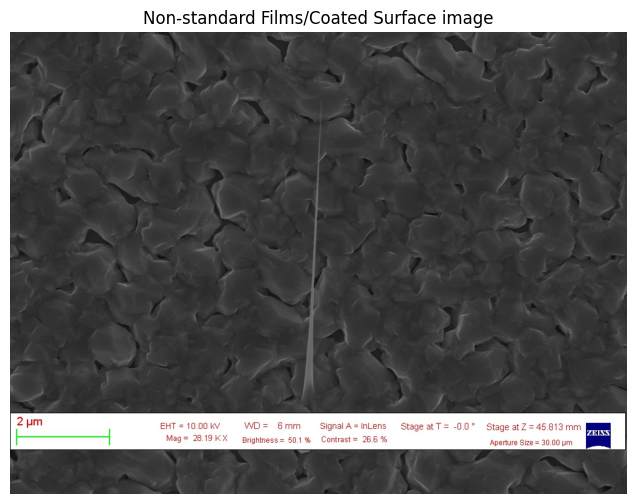

In [50]:
# Display the non-standard image

odd_filename = nonstandard_films.iloc[0]["filename"]
odd_path = films_dir / odd_filename

with Image.open(odd_path) as img:
    print(f"Filename: {odd_filename}")
    print(f"Dimensions: {img.size}")
    print(f"Mode: {img.mode}")

    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.title("Non-standard Films/Coated Surface image")
    plt.axis("off")
    plt.show()

### Assessment of the Non-Standard Image

The single 1023 × 767 image appears visually consistent with the remaining
Films/Coated Surface micrographs.

Its morphology and acquisition-information strip are both preserved, and no
obvious corruption or abnormal content is present.

The one-pixel difference in width and height is therefore treated as a minor
source-image variation rather than a data-quality failure.

The image will remain in the dataset. Subsequent preprocessing will be
implemented in a way that does not require all raw images to have identical
dimensions.

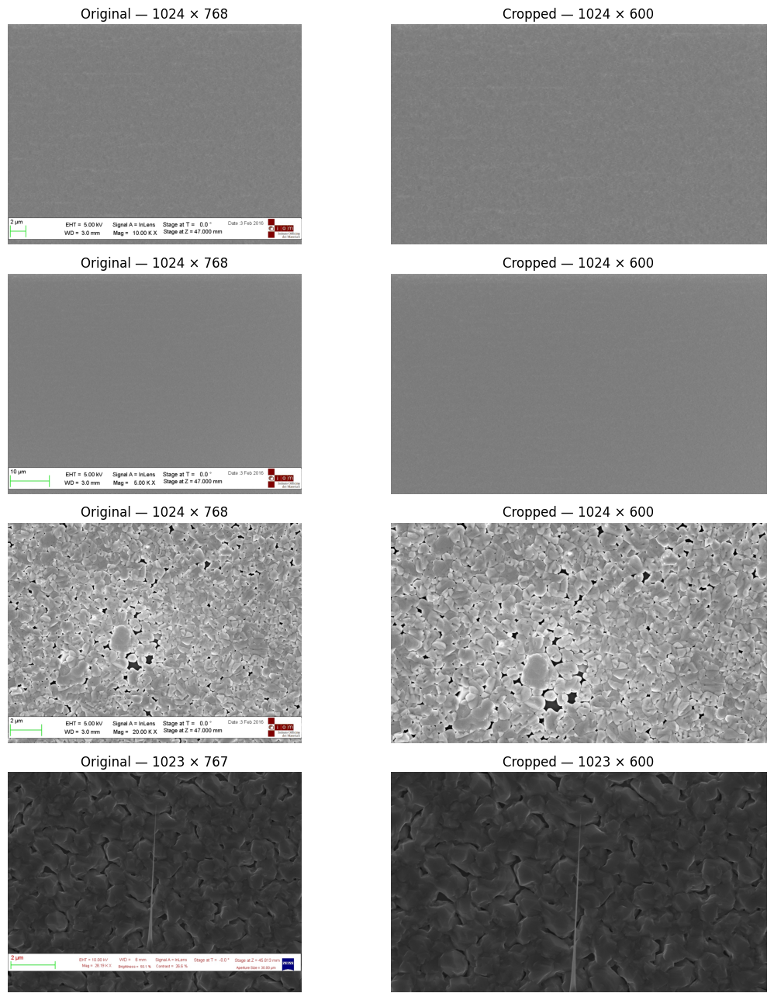

In [51]:
# Test the working crop on normal and non-standard Films/Coated Surface images

standard_films = [
    p for p in films_files
    if p.name != odd_filename
]

films_preview = random.sample(standard_films, 3)
films_preview.append(odd_path)

fig, axes = plt.subplots(
    len(films_preview),
    2,
    figsize=(12, 13)
)

for row, img_path in enumerate(films_preview):

    with Image.open(img_path) as img:
        img = img.copy()

    cropped = img.crop(
        (0, 0, img.width, CROP_HEIGHT)
    )

    axes[row, 0].imshow(img)
    axes[row, 0].set_title(
        f"Original — {img.width} × {img.height}"
    )
    axes[row, 0].axis("off")

    axes[row, 1].imshow(cropped)
    axes[row, 1].set_title(
        f"Cropped — {cropped.width} × {cropped.height}"
    )
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

### Cross-Class Validation of the Working Crop

The 600-pixel crop was evaluated on representative Films/Coated Surface
images, including the single non-standard 1023 × 767 image.

The crop successfully removed visible acquisition metadata, scale bars, and
instrument text while retaining the microscopy region.

The same preprocessing rule has now performed successfully on three
morphologically distinct classes:

- Fibres
- Porous/Sponge
- Films/Coated Surface

The 600-pixel crop therefore remains the working metadata-removal rule.

Some Films/Coated Surface images exhibit very weak texture or nearly uniform
contrast. These images are retained because they appear to represent valid
surface micrographs rather than corrupted files.

In [52]:
# Add Films/Coated Surface to the reusable metadata index

films_metadata = audit_image_class(
    DATA_ROOT / "Films_Coated_Surface",
    "Films/Coated Surface"
)

sem_metadata_three_classes = pd.concat(
    [
        fibres_metadata,
        porous_metadata,
        films_metadata
    ],
    ignore_index=True
)

print(
    f"Total images indexed across three classes: "
    f"{len(sem_metadata_three_classes)}"
)

display(
    sem_metadata_three_classes
    .groupby("class")
    .size()
    .reset_index(name="images")
)

Total images indexed across three classes: 633


,class,images
0,Fibres,150
1,Films/Coated Surface,309
2,Porous/Sponge,174


## 11. Biological Morphology Class

The next morphology category examined is **Biological**.

This class expands the dataset beyond inorganic and engineered surface
morphologies and provides a distinct structural appearance for evaluating
the robustness of the preprocessing workflow.

The subset will be assessed for:

- successful extraction;
- image count;
- file validity;
- image dimensions and encoding;
- compatibility with the working 600-pixel metadata crop.

Detailed duplicate analysis will be repeated later on the complete
ten-class dataset.

In [53]:
# Download the Biological subset

BIOLOGICAL_URL = (
    "https://b2share.eudat.eu/records/"
    "zja8y-53j14/files/Biological.tar?download=1"
)

biological_archive = ARCHIVE_ROOT / "Biological.tar"

!wget -O "$biological_archive" "$BIOLOGICAL_URL"

size_mb = biological_archive.stat().st_size / (1024 ** 2)

print(f"\nDownloaded to: {biological_archive}")
print(f"Archive size: {size_mb:.2f} MiB")

--2026-09-08 12:16:33--  https://b2share.eudat.eu/records/zja8y-53j14/files/Biological.tar?download=1
Resolving b2share.eudat.eu (b2share.eudat.eu)... 86.50.166.117, 2001:708:10:6802::12
Connecting to b2share.eudat.eu (b2share.eudat.eu)|86.50.166.117|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 703825920 (671M) [application/octet-stream]
Saving to: ‘/content/sem_archives/Biological.tar’

/content/sem_archiv 100%[===================>] 671.22M  19.9MB/s    in 49s     

2026-09-08 12:17:23 (13.8 MB/s) - ‘/content/sem_archives/Biological.tar’ saved [703825920/703825920]


Downloaded to: /content/sem_archives/Biological.tar
Archive size: 671.22 MiB


In [54]:
with tarfile.open(biological_archive, "r") as tar:
    tar.extractall(DATA_ROOT)

print("Extraction complete.")

for item in DATA_ROOT.iterdir():
    print("-", item.name)

/tmp/ipykernel_993/3512853570.py:2: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(DATA_ROOT)


Extraction complete.
- Porous_Sponge
- Fibres
- Biological
- Films_Coated_Surface


### Biological Subset Audit

The Biological morphology subset was downloaded and extracted successfully.

The previously defined reusable audit pipeline is used to assess:

- image count;
- image validity;
- image dimensions;
- image encoding;
- compatibility with the working metadata-removal strategy.

This maintains a consistent quality-control procedure across morphology
classes.

In [55]:
# Audit the Biological morphology class

biological_metadata = audit_image_class(
    DATA_ROOT / "Biological",
    "Biological"
)

print(f"Images audited: {len(biological_metadata)}")
print(f"Valid images: {biological_metadata['valid'].sum()}")
print(f"Invalid images: {(~biological_metadata['valid']).sum()}")

print("\nImage dimensions:")
display(
    biological_metadata
    .groupby(["width", "height"])
    .size()
    .reset_index(name="count")
)

print("\nImage modes:")
display(
    biological_metadata["mode"]
    .value_counts()
    .rename_axis("mode")
    .reset_index(name="count")
)

Images audited: 962
Valid images: 962
Invalid images: 0

Image dimensions:


,width,height,count
0,1024,768,956
1,2048,1536,6



Image modes:


,mode,count
0,RGB,962


In [56]:
# Check file extensions in the Biological subset

display(
    biological_metadata["extension"]
    .value_counts()
    .rename_axis("extension")
    .reset_index(name="count")
)

,extension,count
0,.jpg,962


### Resolution Variation and Revision of the Metadata Crop

The Biological subset introduced a second major source resolution.

Of the 962 valid images:

- 956 images have a resolution of 1024 × 768 pixels;
- 6 images have a resolution of 2048 × 1536 pixels.

The higher-resolution images have exactly twice the width and height of the
dominant image format.

This demonstrates that a fixed 600-pixel crop is not suitable for the complete
dataset. Although 600 pixels retain approximately 78% of a 768-pixel-high
image, the same crop would retain only approximately 39% of a 1536-pixel-high
image.

The metadata-removal strategy is therefore revised from a fixed pixel
boundary to a proportional crop.

The working rule retains the upper **78.125% of the image height**, equivalent
to the previously validated 600/768 crop for standard-resolution images.

This produces approximately:

- 1024 × 600 from a 1024 × 768 image;
- 2048 × 1200 from a 2048 × 1536 image.

The proportional rule will be visually validated before being adopted for
the complete dataset.

In [57]:
# Resolution-aware working crop parameter

CROP_RETAIN_FRACTION = 600 / 768

print(f"Fraction of image height retained: {CROP_RETAIN_FRACTION:.4f}")
print(f"Percentage retained: {CROP_RETAIN_FRACTION * 100:.2f}%")

Fraction of image height retained: 0.7812
Percentage retained: 78.12%


In [58]:
high_res_biological = biological_metadata[
    (biological_metadata["width"] == 2048) &
    (biological_metadata["height"] == 1536)
]

print(f"High-resolution Biological images: {len(high_res_biological)}")

display(
    high_res_biological[
        ["filename", "width", "height", "mode"]
    ]
)

High-resolution Biological images: 6


,filename,width,height,mode
302,L7_7dc760cc849638b2a2ef063130f048ac.jpg,2048,1536,RGB
428,L7_80449d8c2444d6c6b39bc16833375db4.jpg,2048,1536,RGB
654,L7_9a00b64e3296ab0457ae3da60f8b1d11.jpg,2048,1536,RGB
706,L7_1f55db86d12b5f79ab808b59ab226f3c.jpg,2048,1536,RGB
774,L7_01eef90f5606a68d3ec29940bb53ab23.jpg,2048,1536,RGB
879,L7_bff07b2ffa421592591b9dad5d6417bc.jpg,2048,1536,RGB


In [59]:
# Validate proportional metadata cropping across Biological image resolutions

standard_bio = biological_metadata[
    (biological_metadata["width"] == 1024) &
    (biological_metadata["height"] == 768)
].sample(3, random_state=SEED)

high_res_bio = high_res_biological.sample(
    min(3, len(high_res_biological)),
    random_state=SEED
)

bio_preview = pd.concat(
    [standard_bio, high_res_bio],
    ignore_index=True
)

fig, axes = plt.subplots(
    len(bio_preview),
    2,
    figsize=(12, 4 * len(bio_preview))
)

for row, record in bio_preview.iterrows():

    with Image.open(record["filepath"]) as img:
        img = img.copy()

    crop_height = round(
        img.height * CROP_RETAIN_FRACTION
    )

    cropped = img.crop(
        (0, 0, img.width, crop_height)
    )

    axes[row, 0].imshow(img)
    axes[row, 0].set_title(
        f"Original — {img.width} × {img.height}"
    )
    axes[row, 0].axis("off")

    axes[row, 1].imshow(cropped)
    axes[row, 1].set_title(
        f"Proportional crop — "
        f"{cropped.width} × {cropped.height}"
    )
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

### Validation of Resolution-Aware Cropping

The proportional metadata-removal strategy was evaluated on both standard-
and high-resolution Biological images.

For standard 1024 × 768 images, retaining the upper 78.125% produced a
1024 × 600 morphology region.

For 2048 × 1536 images, the same proportional rule produced a
2048 × 1200 morphology region.

Visual inspection showed that the acquisition-information strips were removed
from both resolutions while preserving the relevant biological morphology.

The proportional crop is therefore adopted as the working preprocessing rule
for subsequent dataset auditing.

This rule remains subject to validation across the remaining morphology
classes before final preprocessing is fixed.

In [60]:
def crop_morphology_region(image, retain_fraction=CROP_RETAIN_FRACTION):
    """
    Remove the lower SEM acquisition-information region
    using a resolution-aware proportional crop.
    """

    crop_height = round(
        image.height * retain_fraction
    )

    return image.crop(
        (0, 0, image.width, crop_height)
    )

### Expansion of the Master Dataset Index

The Biological subset is now incorporated into the master metadata index.

At this stage, four morphology classes have been audited:

- Fibres
- Porous/Sponge
- Films/Coated Surface
- Biological

The combined index will continue to expand as the remaining classes are
processed.

In [61]:
sem_metadata_four_classes = pd.concat(
    [
        fibres_metadata,
        porous_metadata,
        films_metadata,
        biological_metadata
    ],
    ignore_index=True
)

four_class_summary = (
    sem_metadata_four_classes
    .groupby("class")
    .size()
    .reset_index(name="images")
)

print(
    f"Total images indexed across four classes: "
    f"{len(sem_metadata_four_classes)}"
)

display(four_class_summary)

Total images indexed across four classes: 1595


,class,images
0,Biological,962
1,Fibres,150
2,Films/Coated Surface,309
3,Porous/Sponge,174


## 12. Tips Morphology Class

The fifth morphology category examined is **Tips**.

This class expands the dataset with sharply localized and elongated
structures that differ visually from the previously audited categories.

The subset will be evaluated for:

- image count;
- file validity;
- image dimensions and encoding;
- compatibility with the resolution-aware proportional metadata crop.

The complete exact- and near-duplicate analysis will be repeated only after
all ten morphology classes have been incorporated.

In [62]:
# Download the Tips subset

TIPS_URL = (
    "https://b2share.eudat.eu/records/"
    "zja8y-53j14/files/Tips.tar?download=1"
)

tips_archive = ARCHIVE_ROOT / "Tips.tar"

!wget -O "$tips_archive" "$TIPS_URL"

size_mb = tips_archive.stat().st_size / (1024 ** 2)

print(f"\nDownloaded to: {tips_archive}")
print(f"Archive size: {size_mb:.2f} MiB")

--2026-09-08 12:37:33--  https://b2share.eudat.eu/records/zja8y-53j14/files/Tips.tar?download=1
Resolving b2share.eudat.eu (b2share.eudat.eu)... 86.50.166.117, 2001:708:10:6802::12
Connecting to b2share.eudat.eu (b2share.eudat.eu)|86.50.166.117|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 707338240 (675M) [application/octet-stream]
Saving to: ‘/content/sem_archives/Tips.tar’

/content/sem_archiv 100%[===================>] 674.57M  14.4MB/s    in 48s     

2026-09-08 12:38:22 (14.1 MB/s) - ‘/content/sem_archives/Tips.tar’ saved [707338240/707338240]


Downloaded to: /content/sem_archives/Tips.tar
Archive size: 674.57 MiB


In [63]:
with tarfile.open(tips_archive, "r") as tar:
    tar.extractall(DATA_ROOT)

print("Extraction complete.")

for item in DATA_ROOT.iterdir():
    print("-", item.name)

/tmp/ipykernel_993/1540300283.py:2: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(DATA_ROOT)


Extraction complete.
- Porous_Sponge
- Fibres
- Biological
- Films_Coated_Surface
- Tips


### Tips Subset Audit

The Tips morphology subset was downloaded and extracted successfully.

The reusable image-audit workflow is applied to assess:

- image count;
- file validity;
- image dimensions;
- image encoding;
- compatibility with the resolution-aware metadata-removal crop.

Any newly encountered image resolutions or formatting inconsistencies will be
recorded before the class is added to the master dataset index.

In [64]:
# Audit the Tips morphology class

tips_metadata = audit_image_class(
    DATA_ROOT / "Tips",
    "Tips"
)

print(f"Images audited: {len(tips_metadata)}")
print(f"Valid images: {tips_metadata['valid'].sum()}")
print(f"Invalid images: {(~tips_metadata['valid']).sum()}")

print("\nImage dimensions:")
display(
    tips_metadata
    .groupby(["width", "height"])
    .size()
    .reset_index(name="count")
)

print("\nImage modes:")
display(
    tips_metadata["mode"]
    .value_counts()
    .rename_axis("mode")
    .reset_index(name="count")
)

print("\nFile extensions:")
display(
    tips_metadata["extension"]
    .value_counts()
    .rename_axis("extension")
    .reset_index(name="count")
)

Images audited: 1621
Valid images: 1621
Invalid images: 0

Image dimensions:


,width,height,count
0,1024,768,1621



Image modes:


,mode,count
0,RGB,1621



File extensions:


,extension,count
0,.jpg,1621


### Tips Audit Result

The Tips subset contains 1,621 valid JPEG images with no corrupted files
detected.

All images have a resolution of 1024 × 768 pixels and are encoded in RGB,
matching the dominant format observed in the dataset.

No new image-resolution or file-format inconsistency was introduced by this
class.

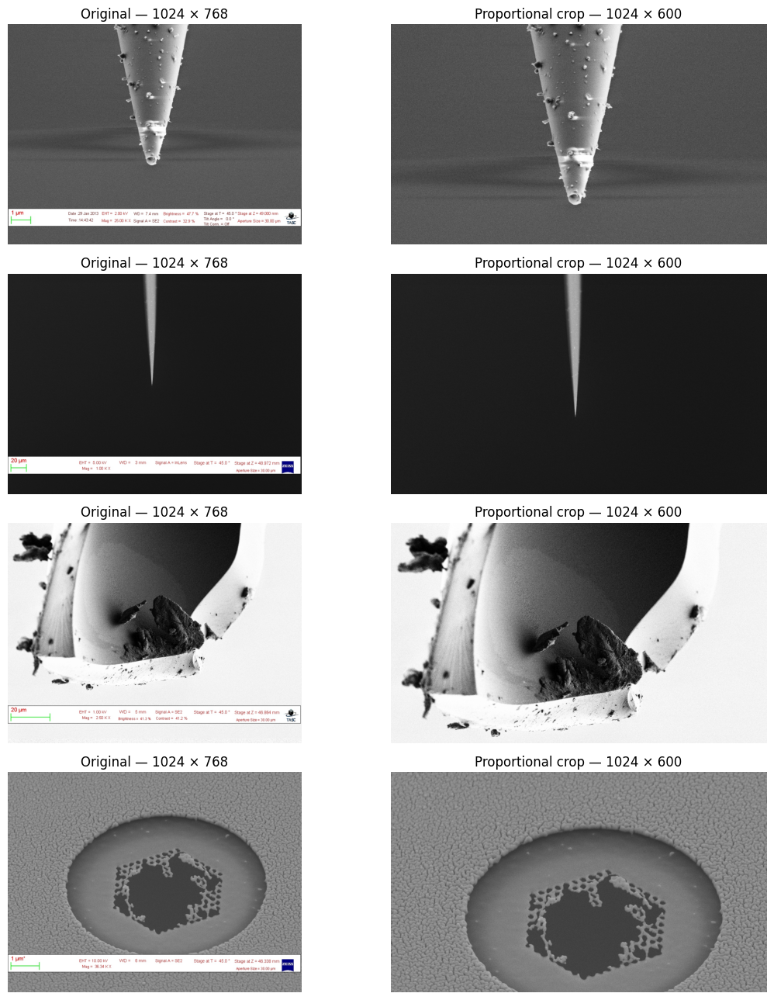

In [65]:
# Validate the proportional metadata crop on Tips

tips_preview = tips_metadata.sample(
    4,
    random_state=SEED
)

fig, axes = plt.subplots(
    len(tips_preview),
    2,
    figsize=(12, 13)
)

for row, record in tips_preview.reset_index(drop=True).iterrows():

    with Image.open(record["filepath"]) as img:
        img = img.copy()

    cropped = crop_morphology_region(img)

    axes[row, 0].imshow(img)
    axes[row, 0].set_title(
        f"Original — {img.width} × {img.height}"
    )
    axes[row, 0].axis("off")

    axes[row, 1].imshow(cropped)
    axes[row, 1].set_title(
        f"Proportional crop — "
        f"{cropped.width} × {cropped.height}"
    )
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

### Validation of Proportional Cropping on Tips

The resolution-aware proportional crop was visually evaluated on representative
Tips images.

The acquisition-information strips were removed successfully without removing
the relevant tip morphology.

The same proportional cropping strategy has now been validated on five
morphology classes:

- Fibres
- Porous/Sponge
- Films/Coated Surface
- Biological
- Tips

The upper 78.125% of each image therefore remains the working
metadata-removal rule.

In [66]:
sem_metadata_five_classes = pd.concat(
    [
        fibres_metadata,
        porous_metadata,
        films_metadata,
        biological_metadata,
        tips_metadata
    ],
    ignore_index=True
)

five_class_summary = (
    sem_metadata_five_classes
    .groupby("class")
    .size()
    .reset_index(name="images")
)

print(
    f"Total images indexed across five classes: "
    f"{len(sem_metadata_five_classes)}"
)

display(five_class_summary)

Total images indexed across five classes: 3216


,class,images
0,Biological,962
1,Fibres,150
2,Films/Coated Surface,309
3,Porous/Sponge,174
4,Tips,1621


## 13. Powder Morphology Class

The sixth morphology category examined is **Powder**.

Powder micrographs introduce particulate and granular structures that differ
substantially from the previously audited classes.

The subset will be assessed for:

- image count;
- file validity;
- image dimensions and encoding;
- compatibility with the resolution-aware proportional metadata crop.

Detailed duplicate and leakage analysis will be repeated after all ten
morphology classes have been incorporated.

In [67]:
# Download the Powder subset

POWDER_URL = (
    "https://b2share.eudat.eu/records/"
    "zja8y-53j14/files/Powder.tar?download=1"
)

powder_archive = ARCHIVE_ROOT / "Powder.tar"

!wget -O "$powder_archive" "$POWDER_URL"

size_mb = powder_archive.stat().st_size / (1024 ** 2)

print(f"\nDownloaded to: {powder_archive}")
print(f"Archive size: {size_mb:.2f} MiB")

--2026-09-08 12:46:35--  https://b2share.eudat.eu/records/zja8y-53j14/files/Powder.tar?download=1
Resolving b2share.eudat.eu (b2share.eudat.eu)... 86.50.166.117, 2001:708:10:6802::12
Connecting to b2share.eudat.eu (b2share.eudat.eu)|86.50.166.117|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 865822720 (826M) [application/octet-stream]
Saving to: ‘/content/sem_archives/Powder.tar’

/content/sem_archiv 100%[===================>] 825.71M  11.9MB/s    in 69s     

2026-09-08 12:47:45 (12.0 MB/s) - ‘/content/sem_archives/Powder.tar’ saved [865822720/865822720]


Downloaded to: /content/sem_archives/Powder.tar
Archive size: 825.71 MiB


In [68]:
with tarfile.open(powder_archive, "r") as tar:
    tar.extractall(DATA_ROOT)

print("Extraction complete.")

for item in DATA_ROOT.iterdir():
    print("-", item.name)

/tmp/ipykernel_993/1823420048.py:2: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(DATA_ROOT)


Extraction complete.
- Porous_Sponge
- Fibres
- Biological
- Films_Coated_Surface
- Powder
- Tips


### Powder Subset Audit

The Powder morphology subset was downloaded and extracted successfully.

The reusable audit pipeline is applied to evaluate:

- image count;
- image validity;
- image dimensions;
- image encoding;
- file format;
- compatibility with the resolution-aware proportional metadata crop.

Any new resolution or formatting inconsistencies will be documented before
the class is incorporated into the master dataset index.

In [69]:
# Audit the Powder morphology class

powder_metadata = audit_image_class(
    DATA_ROOT / "Powder",
    "Powder"
)

print(f"Images audited: {len(powder_metadata)}")
print(f"Valid images: {powder_metadata['valid'].sum()}")
print(f"Invalid images: {(~powder_metadata['valid']).sum()}")

print("\nImage dimensions:")
display(
    powder_metadata
    .groupby(["width", "height"])
    .size()
    .reset_index(name="count")
)

print("\nImage modes:")
display(
    powder_metadata["mode"]
    .value_counts()
    .rename_axis("mode")
    .reset_index(name="count")
)

print("\nFile extensions:")
display(
    powder_metadata["extension"]
    .value_counts()
    .rename_axis("extension")
    .reset_index(name="count")
)

Images audited: 898
Valid images: 898
Invalid images: 0

Image dimensions:


,width,height,count
0,1022,766,1
1,1023,767,6
2,1024,768,843
3,3072,2304,48



Image modes:


,mode,count
0,RGB,898



File extensions:


,extension,count
0,.jpg,898


### Powder Audit Result

The Powder subset contains 898 valid JPEG images with no corrupted files
detected.

Several source resolutions are present:

- 843 images at 1024 × 768 pixels;
- 6 images at 1023 × 767 pixels;
- 1 image at 1022 × 768 pixels;
- 48 images at 3072 × 2304 pixels.

All images are encoded in RGB.

The 3072 × 2304 images are three times the width and height of the dominant
1024 × 768 format. This further supports the use of a proportional
metadata-removal rule rather than a fixed pixel boundary.

The minor one- or two-pixel variations in the remaining images are treated
as harmless export differences unless visual inspection indicates otherwise.

In [70]:
# Select representative Powder images from each resolution group

powder_preview_parts = []

for (width, height), group in powder_metadata.groupby(
    ["width", "height"]
):
    n_samples = min(2, len(group))

    powder_preview_parts.append(
        group.sample(
            n=n_samples,
            random_state=SEED
        )
    )

powder_preview = (
    pd.concat(powder_preview_parts)
    .reset_index(drop=True)
)

print("Preview images selected:", len(powder_preview))

display(
    powder_preview[
        ["filename", "width", "height"]
    ]
)

Preview images selected: 7


,filename,width,height
0,L4_b5f7308dfab94c0c7486152b8a3bf690.jpg,1022,766
1,L4_186873f68913a43903b00309f3bbd645.jpg,1023,767
2,L4_04e3425272d276822d6270409edb3213.jpg,1023,767
3,L4_ec1dde83cc04ac8b949851e2b699f7bd.jpg,1024,768
4,L4_18af137193c4cb5481ce866eabe23a5b.jpg,1024,768
5,L4_b9462adeaa8a34a81ec90ca231a2f115.jpg,3072,2304
6,L4_205b961309568cd1b1a556e2c2e31e29.jpg,3072,2304


In [71]:
# Validate proportional cropping across Powder image resolutions

fig, axes = plt.subplots(
    len(powder_preview),
    2,
    figsize=(12, 4 * len(powder_preview))
)

for row, record in powder_preview.iterrows():

    with Image.open(record["filepath"]) as img:
        img = img.copy()

    cropped = crop_morphology_region(img)

    axes[row, 0].imshow(img)
    axes[row, 0].set_title(
        f"Original — {img.width} × {img.height}"
    )
    axes[row, 0].axis("off")

    axes[row, 1].imshow(cropped)
    axes[row, 1].set_title(
        f"Proportional crop — "
        f"{cropped.width} × {cropped.height}"
    )
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

### Validation of Proportional Cropping on Powder

The resolution-aware proportional cropping strategy was evaluated across all
source resolutions observed in the Powder subset.

Representative transformations included:

- 1022 × 766 → 1022 × 598
- 1023 × 767 → 1023 × 599
- 1024 × 768 → 1024 × 600
- 3072 × 2304 → 3072 × 1800

Visual inspection showed that the SEM acquisition-information strips were
removed successfully across all tested resolutions while preserving the
relevant powder morphology.

This provides further support for retaining the upper 78.125% of image height
rather than using a fixed pixel crop.

In [72]:
sem_metadata_six_classes = pd.concat(
    [
        fibres_metadata,
        porous_metadata,
        films_metadata,
        biological_metadata,
        tips_metadata,
        powder_metadata
    ],
    ignore_index=True
)

six_class_summary = (
    sem_metadata_six_classes
    .groupby("class")
    .size()
    .reset_index(name="images")
)

print(
    f"Total images indexed across six classes: "
    f"{len(sem_metadata_six_classes)}"
)

display(six_class_summary)

Total images indexed across six classes: 4114


,class,images
0,Biological,962
1,Fibres,150
2,Films/Coated Surface,309
3,Porous/Sponge,174
4,Powder,898
5,Tips,1621


## 14. Nanowires Morphology Class

The seventh morphology category examined is **Nanowires**.

Nanowire micrographs introduce elongated nanoscale structures that are
visually distinct from the previously audited classes.

The subset will be assessed for:

- image count;
- file validity;
- image dimensions and encoding;
- compatibility with the resolution-aware proportional metadata crop.

Detailed exact- and near-duplicate analysis will be repeated after all ten
morphology classes have been incorporated.

In [73]:
# Download the Nanowires subset

NANOWIRES_URL = (
    "https://b2share.eudat.eu/records/"
    "zja8y-53j14/files/Nanowires.tar?download=1"
)

nanowires_archive = ARCHIVE_ROOT / "Nanowires.tar"

!wget -O "$nanowires_archive" "$NANOWIRES_URL"

size_mb = nanowires_archive.stat().st_size / (1024 ** 2)

print(f"\nDownloaded to: {nanowires_archive}")
print(f"Archive size: {size_mb:.2f} MiB")

--2026-09-08 12:59:57--  https://b2share.eudat.eu/records/zja8y-53j14/files/Nanowires.tar?download=1
Resolving b2share.eudat.eu (b2share.eudat.eu)... 86.50.166.117, 2001:708:10:6802::12
Connecting to b2share.eudat.eu (b2share.eudat.eu)|86.50.166.117|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2203371520 (2.1G) [application/octet-stream]
Saving to: ‘/content/sem_archives/Nanowires.tar’

/content/sem_archiv 100%[===================>]   2.05G  19.1MB/s    in 2m 34s  

2026-09-08 13:02:33 (13.6 MB/s) - ‘/content/sem_archives/Nanowires.tar’ saved [2203371520/2203371520]


Downloaded to: /content/sem_archives/Nanowires.tar
Archive size: 2101.30 MiB


In [74]:
with tarfile.open(nanowires_archive, "r") as tar:
    tar.extractall(DATA_ROOT)

print("Extraction complete.")

for item in DATA_ROOT.iterdir():
    print("-", item.name)

/tmp/ipykernel_993/2620742624.py:2: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(DATA_ROOT)


Extraction complete.
- Nanowires
- Porous_Sponge
- Fibres
- Biological
- Films_Coated_Surface
- Powder
- Tips


### Nanowires Subset Audit

The Nanowires morphology subset was downloaded and extracted successfully.

The reusable audit pipeline is applied to evaluate:

- image count;
- file validity;
- image dimensions;
- image encoding;
- file format;
- compatibility with the resolution-aware proportional metadata crop.

Any newly observed resolutions or formatting inconsistencies will be
documented before the class is added to the master dataset index.

In [75]:
# Audit the Nanowires morphology class

nanowires_metadata = audit_image_class(
    DATA_ROOT / "Nanowires",
    "Nanowires"
)

print(f"Images audited: {len(nanowires_metadata)}")
print(f"Valid images: {nanowires_metadata['valid'].sum()}")
print(f"Invalid images: {(~nanowires_metadata['valid']).sum()}")

print("\nImage dimensions:")
display(
    nanowires_metadata
    .groupby(["width", "height"])
    .size()
    .reset_index(name="count")
)

print("\nImage modes:")
display(
    nanowires_metadata["mode"]
    .value_counts()
    .rename_axis("mode")
    .reset_index(name="count")
)

print("\nFile extensions:")
display(
    nanowires_metadata["extension"]
    .value_counts()
    .rename_axis("extension")
    .reset_index(name="count")
)

Images audited: 3815
Valid images: 3815
Invalid images: 0

Image dimensions:


,width,height,count
0,1023,767,8
1,1024,768,3802
2,2048,1536,5



Image modes:


,mode,count
0,RGB,3815



File extensions:


,extension,count
0,.jpg,3815


### Nanowires Audit Result

The Nanowires subset contains 3,815 valid JPEG images with no corrupted files
detected.

Three source resolutions were observed:

- 3,802 images at 1024 × 768 pixels;
- 8 images at 1023 × 767 pixels;
- 5 images at 2048 × 1536 pixels.

All images are encoded in RGB.

The observed resolution variation is consistent with patterns identified in
earlier morphology classes and further supports the use of a proportional,
resolution-aware metadata-removal strategy.

In [76]:
# Select representative Nanowires images from each resolution group

nanowires_preview_parts = []

for (width, height), group in nanowires_metadata.groupby(
    ["width", "height"]
):
    n_samples = min(2, len(group))

    nanowires_preview_parts.append(
        group.sample(
            n=n_samples,
            random_state=SEED
        )
    )

nanowires_preview = (
    pd.concat(nanowires_preview_parts)
    .reset_index(drop=True)
)

display(
    nanowires_preview[
        ["filename", "width", "height"]
    ]
)

,filename,width,height
0,L6_0f6ca605477dfc36c445c9e605f97da2.jpg,1023,767
1,L6_c40b5c6708b2d362f2bb67d604008920.jpg,1023,767
2,L6_5a3bb673fa24d5c270cd2d32d91099d6.jpg,1024,768
3,L6_93f41a3f5de5231b5d280a4742a54c94.jpg,1024,768
4,L6_808c07d70863ea794abcb40a61e317fb.jpg,2048,1536
5,L6_ef7d5cd31d73891587d8ce7fb391d1aa.jpg,2048,1536


In [77]:
# Validate proportional cropping across Nanowires resolutions

fig, axes = plt.subplots(
    len(nanowires_preview),
    2,
    figsize=(12, 4 * len(nanowires_preview))
)

for row, record in nanowires_preview.iterrows():

    with Image.open(record["filepath"]) as img:
        img = img.copy()

    cropped = crop_morphology_region(img)

    axes[row, 0].imshow(img)
    axes[row, 0].set_title(
        f"Original — {img.width} × {img.height}"
    )
    axes[row, 0].axis("off")

    axes[row, 1].imshow(cropped)
    axes[row, 1].set_title(
        f"Proportional crop — "
        f"{cropped.width} × {cropped.height}"
    )
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

### Validation of Proportional Cropping on Nanowires

The resolution-aware proportional crop was evaluated on representative
Nanowires images at all observed source resolutions:

- 1023 × 767 → 1023 × 599;
- 1024 × 768 → 1024 × 600;
- 2048 × 1536 → 2048 × 1200.

Visual inspection confirmed that the SEM acquisition-information strips were
removed successfully while retaining the relevant microscopy regions.

The sampled Nanowires images show variation in wire orientation, density,
and apparent structural organization. The extent of within-class variability
will be assessed more systematically during later dataset-level analysis and
model evaluation.

In [78]:
sem_metadata_seven_classes = pd.concat(
    [
        fibres_metadata,
        porous_metadata,
        films_metadata,
        biological_metadata,
        tips_metadata,
        powder_metadata,
        nanowires_metadata
    ],
    ignore_index=True
)

seven_class_summary = (
    sem_metadata_seven_classes
    .groupby("class")
    .size()
    .reset_index(name="images")
)

print(
    f"Total images indexed across seven classes: "
    f"{len(sem_metadata_seven_classes)}"
)

display(seven_class_summary)

Total images indexed across seven classes: 7929


,class,images
0,Biological,962
1,Fibres,150
2,Films/Coated Surface,309
3,Nanowires,3815
4,Porous/Sponge,174
5,Powder,898
6,Tips,1621


## 15. Particles Morphology Class

The eighth morphology category examined is **Particles**.

This class introduces discrete particulate structures that may vary in size,
shape, aggregation state, and surface texture.

The subset will be evaluated for:

- image count;
- file validity;
- image dimensions and encoding;
- file format;
- compatibility with the resolution-aware proportional metadata crop.

The complete duplicate and leakage audit will be repeated after all ten
morphology classes have been incorporated.

In [79]:
# Download the Particles subset

PARTICLES_URL = (
    "https://b2share.eudat.eu/records/"
    "zja8y-53j14/files/Particles.tar?download=1"
)

particles_archive = ARCHIVE_ROOT / "Particles.tar"

!wget -O "$particles_archive" "$PARTICLES_URL"

size_mb = particles_archive.stat().st_size / (1024 ** 2)

print(f"\nDownloaded to: {particles_archive}")
print(f"Archive size: {size_mb:.2f} MiB")

--2026-09-08 13:17:32--  https://b2share.eudat.eu/records/zja8y-53j14/files/Particles.tar?download=1
Resolving b2share.eudat.eu (b2share.eudat.eu)... 86.50.166.117, 2001:708:10:6802::12
Connecting to b2share.eudat.eu (b2share.eudat.eu)|86.50.166.117|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2519879680 (2.3G) [application/octet-stream]
Saving to: ‘/content/sem_archives/Particles.tar’

/content/sem_archiv 100%[===================>]   2.35G  16.3MB/s    in 2m 59s  

2026-09-08 13:20:32 (13.4 MB/s) - ‘/content/sem_archives/Particles.tar’ saved [2519879680/2519879680]


Downloaded to: /content/sem_archives/Particles.tar
Archive size: 2403.14 MiB


In [80]:
with tarfile.open(particles_archive, "r") as tar:
    tar.extractall(DATA_ROOT)

print("Extraction complete.")

for item in DATA_ROOT.iterdir():
    print("-", item.name)

/tmp/ipykernel_993/4283011976.py:2: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(DATA_ROOT)


Extraction complete.
- Nanowires
- Porous_Sponge
- Fibres
- Biological
- Films_Coated_Surface
- Powder
- Tips
- Particles


### Particles Subset Audit

The Particles subset was downloaded and extracted successfully.

The reusable image-audit pipeline is now applied to determine whether this
class introduces any new source resolutions, corrupted files, image modes,
or file formats.

In [81]:
# Audit the Particles morphology class

particles_metadata = audit_image_class(
    DATA_ROOT / "Particles",
    "Particles"
)

print(f"Images audited: {len(particles_metadata)}")
print(f"Valid images: {particles_metadata['valid'].sum()}")
print(f"Invalid images: {(~particles_metadata['valid']).sum()}")

print("\nImage dimensions:")
display(
    particles_metadata
    .groupby(["width", "height"])
    .size()
    .reset_index(name="count")
)

print("\nImage modes:")
display(
    particles_metadata["mode"]
    .value_counts()
    .rename_axis("mode")
    .reset_index(name="count")
)

print("\nFile extensions:")
display(
    particles_metadata["extension"]
    .value_counts()
    .rename_axis("extension")
    .reset_index(name="count")
)

Images audited: 3905
Valid images: 3905
Invalid images: 0

Image dimensions:


,width,height,count
0,1023,767,13
1,1024,768,3835
2,3072,2304,57



Image modes:


,mode,count
0,RGB,3905



File extensions:


,extension,count
0,.jpg,3905


### Particles Audit Result

The Particles subset contains 3,905 valid JPEG images with no corrupted files
detected.

Three source resolutions were observed:

- 3,835 images at 1024 × 768 pixels;
- 13 images at 1023 × 767 pixels;
- 57 images at 3072 × 2304 pixels.

All images are encoded in RGB.

The presence of both standard- and high-resolution images is consistent with
earlier morphology classes and further supports the use of the
resolution-aware proportional metadata-removal strategy.

In [82]:
# Select representative Particles images from each resolution group

particles_preview_parts = []

for (width, height), group in particles_metadata.groupby(
    ["width", "height"]
):
    n_samples = min(2, len(group))

    particles_preview_parts.append(
        group.sample(
            n=n_samples,
            random_state=SEED
        )
    )

particles_preview = (
    pd.concat(particles_preview_parts)
    .reset_index(drop=True)
)

display(
    particles_preview[
        ["filename", "width", "height"]
    ]
)

,filename,width,height
0,L2_a6c63def25065422d6e95daf2c5c6a2b.jpg,1023,767
1,L2_7955d6e330a03a3a72250b5086f796b9.jpg,1023,767
2,L2_64e7f282574593927dbf36399739beb9.jpg,1024,768
3,L2_eeb3c9f8c46020bb2534f85ade2652c3.jpg,1024,768
4,L2_e71600db622b73f9e90519aa69c30947.jpg,3072,2304
5,L2_42688f3b85a26cbd5ffd7aa56073f54f.jpg,3072,2304


In [83]:
# Validate proportional cropping across Particles resolutions

fig, axes = plt.subplots(
    len(particles_preview),
    2,
    figsize=(12, 4 * len(particles_preview))
)

for row, record in particles_preview.iterrows():

    with Image.open(record["filepath"]) as img:
        img = img.copy()

    cropped = crop_morphology_region(img)

    axes[row, 0].imshow(img)
    axes[row, 0].set_title(
        f"Original — {img.width} × {img.height}"
    )
    axes[row, 0].axis("off")

    axes[row, 1].imshow(cropped)
    axes[row, 1].set_title(
        f"Proportional crop — "
        f"{cropped.width} × {cropped.height}"
    )
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

### Validation of Proportional Cropping on Particles

The resolution-aware proportional cropping strategy was evaluated on
representative Particles images across all observed source resolutions:

- 1023 × 767 → 1023 × 599;
- 1024 × 768 → 1024 × 600;
- 3072 × 2304 → 3072 × 1800.

Visual inspection confirmed that the acquisition-information strips were
removed while preserving the relevant particle morphology.

The upper 78.125% image-height rule therefore remains suitable for the
Particles class.

In [84]:
sem_metadata_eight_classes = pd.concat(
    [
        fibres_metadata,
        porous_metadata,
        films_metadata,
        biological_metadata,
        tips_metadata,
        powder_metadata,
        nanowires_metadata,
        particles_metadata
    ],
    ignore_index=True
)

eight_class_summary = (
    sem_metadata_eight_classes
    .groupby("class")
    .size()
    .reset_index(name="images")
)

print(
    f"Total images indexed across eight classes: "
    f"{len(sem_metadata_eight_classes)}"
)

display(eight_class_summary)

Total images indexed across eight classes: 11834


,class,images
0,Biological,962
1,Fibres,150
2,Films/Coated Surface,309
3,Nanowires,3815
4,Particles,3905
5,Porous/Sponge,174
6,Powder,898
7,Tips,1621


## 16. Patterned Surface Morphology Class

The ninth morphology category examined is **Patterned Surface**.

This class introduces highly organized and repetitive surface structures,
which are visually distinct from the more irregular morphologies audited so far.

The subset will be evaluated for:

- image count;
- file validity;
- image dimensions and encoding;
- file format;
- compatibility with the resolution-aware proportional metadata crop.

The complete duplicate and leakage audit will be repeated after the final
class has also been incorporated.

In [87]:
# Download the Patterned Surface subset

PATTERNED_URL = (
    "https://b2share.eudat.eu/records/"
    "zja8y-53j14/files/Patterned_surface.tar?download=1"
)

patterned_archive = ARCHIVE_ROOT / "Patterned_surface.tar"

# Remove any incomplete file from the failed attempt
if patterned_archive.exists():
    patterned_archive.unlink()

!wget -O "$patterned_archive" "$PATTERNED_URL"

size_mb = patterned_archive.stat().st_size / (1024 ** 2)

print(f"\nDownloaded to: {patterned_archive}")
print(f"Archive size: {size_mb:.2f} MiB")

--2026-09-08 13:32:05--  https://b2share.eudat.eu/records/zja8y-53j14/files/Patterned_surface.tar?download=1
Resolving b2share.eudat.eu (b2share.eudat.eu)... 86.50.166.117, 2001:708:10:6802::12
Connecting to b2share.eudat.eu (b2share.eudat.eu)|86.50.166.117|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2874941440 (2.7G) [application/octet-stream]
Saving to: ‘/content/sem_archives/Patterned_surface.tar’

/content/sem_archiv 100%[===================>]   2.68G  19.1MB/s    in 4m 5s   

2026-09-08 13:36:11 (11.2 MB/s) - ‘/content/sem_archives/Patterned_surface.tar’ saved [2874941440/2874941440]


Downloaded to: /content/sem_archives/Patterned_surface.tar
Archive size: 2741.76 MiB


In [88]:
with tarfile.open(patterned_archive, "r") as tar:
    tar.extractall(DATA_ROOT)

print("Extraction complete.")

for item in DATA_ROOT.iterdir():
    print("-", item.name)

/tmp/ipykernel_993/982017649.py:2: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(DATA_ROOT)


Extraction complete.
- Nanowires
- Patterned_surface
- Porous_Sponge
- Fibres
- Biological
- Films_Coated_Surface
- Powder
- Tips
- Particles


### Patterned Surface Subset Audit

The Patterned Surface morphology subset was downloaded and extracted
successfully.

The reusable audit pipeline is applied to evaluate:

- image count;
- file validity;
- image dimensions;
- image encoding;
- file format;
- compatibility with the resolution-aware proportional metadata crop.

Any newly encountered resolutions or formatting inconsistencies will be
documented before this class is incorporated into the master dataset index.

In [89]:
# Audit the Patterned Surface morphology class

patterned_metadata = audit_image_class(
    DATA_ROOT / "Patterned_surface",
    "Patterned Surface"
)

print(f"Images audited: {len(patterned_metadata)}")
print(f"Valid images: {patterned_metadata['valid'].sum()}")
print(f"Invalid images: {(~patterned_metadata['valid']).sum()}")

print("\nImage dimensions:")
display(
    patterned_metadata
    .groupby(["width", "height"])
    .size()
    .reset_index(name="count")
)

print("\nImage modes:")
display(
    patterned_metadata["mode"]
    .value_counts()
    .rename_axis("mode")
    .reset_index(name="count")
)

print("\nFile extensions:")
display(
    patterned_metadata["extension"]
    .value_counts()
    .rename_axis("extension")
    .reset_index(name="count")
)

Images audited: 4752
Valid images: 4752
Invalid images: 0

Image dimensions:


,width,height,count
0,1022,766,4
1,1023,767,10
2,1024,768,4709
3,2048,1536,25
4,3072,2304,4



Image modes:


,mode,count
0,RGB,4752



File extensions:


,extension,count
0,.jpg,4752


### Patterned Surface Audit Result

The Patterned Surface subset contains 4,752 valid JPEG images with no
corrupted files detected.

Five source-resolution groups were observed:

- 4 images at 1022 × 768 pixels;
- 10 images at 1023 × 767 pixels;
- 4,709 images at 1024 × 768 pixels;
- 25 images at 2048 × 1536 pixels;
- 4 images at 3072 × 2304 pixels.

All images are encoded in RGB.

The coexistence of standard-, double-, and triple-resolution images further
supports the resolution-aware proportional cropping strategy rather than a
fixed pixel boundary.

In [90]:
# Select representative Patterned Surface images from each resolution group

patterned_preview_parts = []

for (width, height), group in patterned_metadata.groupby(
    ["width", "height"]
):
    n_samples = min(2, len(group))

    patterned_preview_parts.append(
        group.sample(
            n=n_samples,
            random_state=SEED
        )
    )

patterned_preview = (
    pd.concat(patterned_preview_parts)
    .reset_index(drop=True)
)

display(
    patterned_preview[
        ["filename", "width", "height"]
    ]
)

,filename,width,height
0,L1_647064a50282ee60d812ebf9b4407e5f.jpg,1022,766
1,L1_72cb68be419712a048a431a6900712fe.jpg,1022,766
2,L1_80f9eb96249c7c224819750d1a44541e.jpg,1023,767
3,L1_43d60ad2976272d7718ce1e4231301fc.jpg,1023,767
4,L1_640cc6244174961c441b365f5aadfa17.jpg,1024,768
5,L1_b53a66123ac753c4097415f943a9e91c.jpg,1024,768
6,L1_f7cca8652bef8c98b4fa5b39604956f2.jpg,2048,1536
7,L1_3318f867d6c45ef926be74255b1af227.jpg,2048,1536
8,L1_e5709bf2cbc104581e99559f0e1d4970.jpg,3072,2304
9,L1_c31a624bd213571581508a72cfc62e8f.jpg,3072,2304


In [91]:
# Validate proportional cropping across Patterned Surface resolutions

fig, axes = plt.subplots(
    len(patterned_preview),
    2,
    figsize=(12, 4 * len(patterned_preview))
)

for row, record in patterned_preview.iterrows():

    with Image.open(record["filepath"]) as img:
        img = img.copy()

    cropped = crop_morphology_region(img)

    axes[row, 0].imshow(img)
    axes[row, 0].set_title(
        f"Original — {img.width} × {img.height}"
    )
    axes[row, 0].axis("off")

    axes[row, 1].imshow(cropped)
    axes[row, 1].set_title(
        f"Proportional crop — "
        f"{cropped.width} × {cropped.height}"
    )
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

### Internal Annotation Artifact Identified

The proportional crop successfully removed the lower SEM acquisition strip
from the sampled Patterned Surface images.

However, visual inspection revealed that some micrographs contain colored
measurement overlays within the retained microscopy region itself, including
cursor lines and measurement labels.

These annotations cannot be removed by bottom cropping alone and may provide
spurious visual cues to a machine-learning model.

Because the underlying SEM imagery is predominantly grayscale, strongly
chromatic pixels can be used to screen the dataset for potential embedded
annotations.

Images identified by this procedure will be flagged for visual review rather
than automatically removed.

In [92]:
def chromatic_pixel_fraction(
    file_path,
    channel_difference_threshold=25
):
    """
    Estimate the fraction of strongly colored pixels
    remaining inside the morphology-only region.
    """

    with Image.open(file_path) as img:
        morphology = crop_morphology_region(img).convert("RGB")
        arr = np.asarray(morphology).astype(np.int16)

    channel_range = (
        arr.max(axis=2) - arr.min(axis=2)
    )

    chromatic_mask = (
        channel_range > channel_difference_threshold
    )

    return chromatic_mask.mean()

In [93]:
patterned_metadata["chromatic_fraction"] = (
    patterned_metadata["filepath"]
    .apply(chromatic_pixel_fraction)
)

display(
    patterned_metadata[
        [
            "filename",
            "width",
            "height",
            "chromatic_fraction"
        ]
    ]
    .sort_values(
        "chromatic_fraction",
        ascending=False
    )
    .head(20)
)

,filename,width,height,chromatic_fraction
938,L1_3343b6c60be061cec1068ce4bc1365a0.jpg,1024,768,0.032131
1193,L1_f42e37de79f85574a2a9024934e2ee29.jpg,1024,768,0.031906
456,L1_6e6ab33f6a0eb9fdfd9430f3caca1fbf.jpg,1024,768,0.030363
4599,L1_4ffa620ffb7729c9d38eaac969173ecc.jpg,1024,768,0.030363
165,L1_0b25319f00477e3c619cca9c39347268.jpg,1024,768,0.030145
2807,L1_21bd5d98013d25f587f33a0b2f107a0b.jpg,1024,768,0.029679
989,L1_0d72cf4749b73a9b5b82662f9be8ea20.jpg,1024,768,0.029302
1065,L1_67334f9542f45a25e50ef45fb50f6d6c.jpg,1024,768,0.029110
3784,L1_b68b1ae78fe6b5c3c8df45b0fb3c3eed.jpg,1024,768,0.028872
481,L1_070eba0395417e51109528cbe54c152f.jpg,1024,768,0.028107


In [94]:
COLOR_ARTIFACT_THRESHOLD = 0.001

patterned_color_candidates = patterned_metadata[
    patterned_metadata["chromatic_fraction"]
    >= COLOR_ARTIFACT_THRESHOLD
].copy()

print(
    "Potential internal color-annotation images:",
    len(patterned_color_candidates)
)

display(
    patterned_color_candidates[
        [
            "filename",
            "width",
            "height",
            "chromatic_fraction"
        ]
    ]
    .sort_values(
        "chromatic_fraction",
        ascending=False
    )
    .head(20)
)

Potential internal color-annotation images: 1208


,filename,width,height,chromatic_fraction
938,L1_3343b6c60be061cec1068ce4bc1365a0.jpg,1024,768,0.032131
1193,L1_f42e37de79f85574a2a9024934e2ee29.jpg,1024,768,0.031906
456,L1_6e6ab33f6a0eb9fdfd9430f3caca1fbf.jpg,1024,768,0.030363
4599,L1_4ffa620ffb7729c9d38eaac969173ecc.jpg,1024,768,0.030363
165,L1_0b25319f00477e3c619cca9c39347268.jpg,1024,768,0.030145
2807,L1_21bd5d98013d25f587f33a0b2f107a0b.jpg,1024,768,0.029679
989,L1_0d72cf4749b73a9b5b82662f9be8ea20.jpg,1024,768,0.029302
1065,L1_67334f9542f45a25e50ef45fb50f6d6c.jpg,1024,768,0.029110
3784,L1_b68b1ae78fe6b5c3c8df45b0fb3c3eed.jpg,1024,768,0.028872
481,L1_070eba0395417e51109528cbe54c152f.jpg,1024,768,0.028107


### Preliminary Chromatic-Artifact Screening

The initial chromatic-pixel screening flagged 1,208 of the 4,752
Patterned Surface images.

This relatively large fraction indicates that chromatic content is common
within this class and that the preliminary threshold is too broad to be used
as an exclusion rule.

The flagged set may contain genuine measurement overlays, colored cursor
lines, microscope annotations, logos, or other image elements.

Therefore, no images are removed at this stage.

The distribution of chromatic-pixel fractions and representative flagged
images are examined before defining a more specific annotation-detection
strategy.

In [95]:
# Summarize the chromatic-pixel distribution

chromatic_summary = (
    patterned_metadata["chromatic_fraction"]
    .describe(
        percentiles=[
            0.50,
            0.75,
            0.90,
            0.95,
            0.975,
            0.99
        ]
    )
)

display(chromatic_summary)

,chromatic_fraction
count,4752.000000
mean,0.001761
std,0.004268
min,0.000000
50%,0.000000
75%,0.001101
90%,0.006564
95%,0.010539
97.5%,0.014825
99%,0.023549


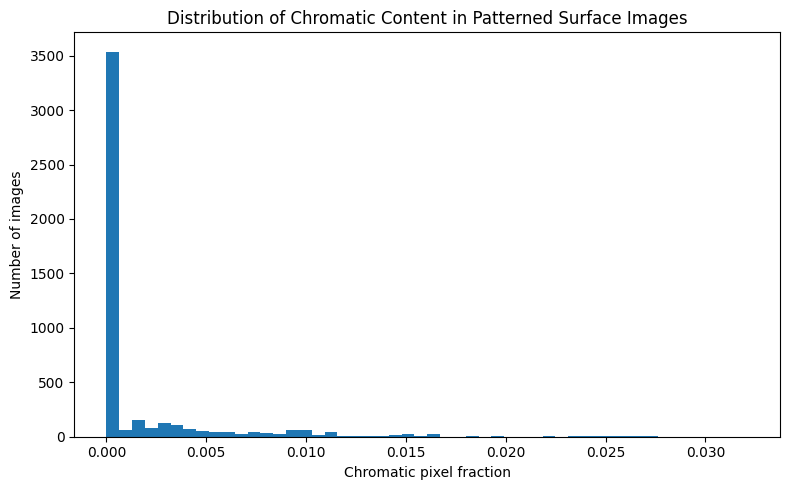

In [96]:
# Plot the distribution of chromatic-pixel fractions

plt.figure(figsize=(8, 5))

plt.hist(
    patterned_metadata["chromatic_fraction"],
    bins=50
)

plt.xlabel("Chromatic pixel fraction")
plt.ylabel("Number of images")
plt.title(
    "Distribution of Chromatic Content "
    "in Patterned Surface Images"
)

plt.tight_layout()
plt.show()

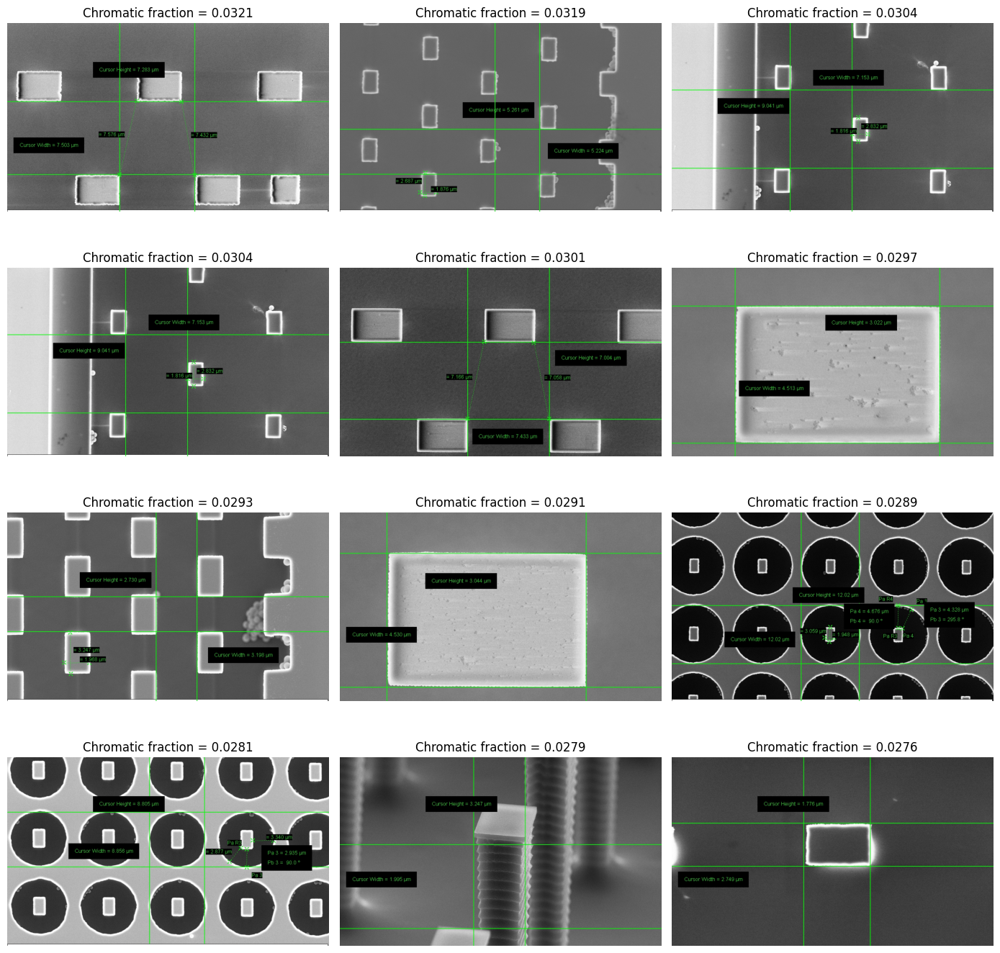

In [97]:
# Inspect the strongest chromatic-artifact candidates

top_color_candidates = (
    patterned_metadata
    .sort_values(
        "chromatic_fraction",
        ascending=False
    )
    .head(12)
    .reset_index(drop=True)
)

fig, axes = plt.subplots(
    4,
    3,
    figsize=(14, 14)
)

for ax, (_, record) in zip(
    axes.flat,
    top_color_candidates.iterrows()
):
    with Image.open(record["filepath"]) as img:
        cropped = crop_morphology_region(img)

    ax.imshow(cropped)

    ax.set_title(
        f"Chromatic fraction = "
        f"{record['chromatic_fraction']:.4f}"
    )

    ax.axis("off")

plt.tight_layout()
plt.show()

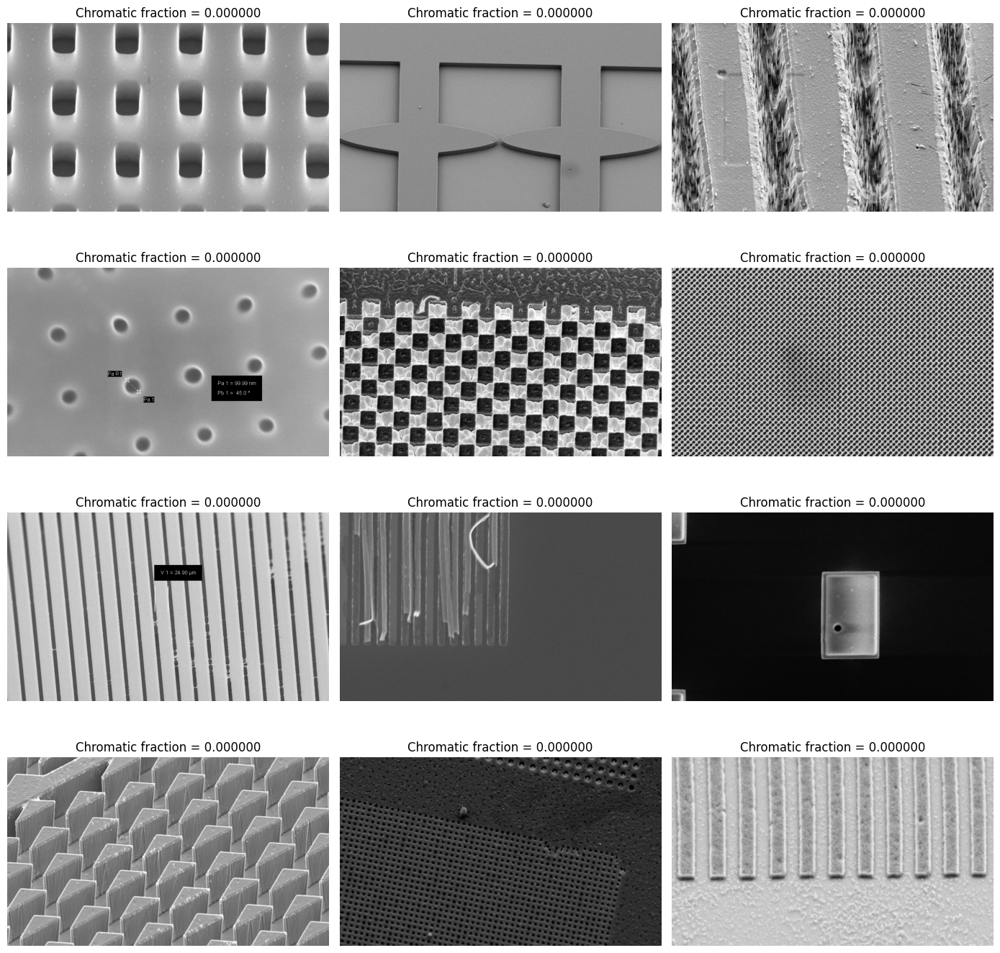

In [98]:
# Compare with low-chromaticity images

low_color_controls = (
    patterned_metadata
    .sort_values("chromatic_fraction")
    .head(12)
    .reset_index(drop=True)
)

fig, axes = plt.subplots(
    4,
    3,
    figsize=(14, 14)
)

for ax, (_, record) in zip(
    axes.flat,
    low_color_controls.iterrows()
):
    with Image.open(record["filepath"]) as img:
        cropped = crop_morphology_region(img)

    ax.imshow(cropped)

    ax.set_title(
        f"Chromatic fraction = "
        f"{record['chromatic_fraction']:.6f}"
    )

    ax.axis("off")

plt.tight_layout()
plt.show()

### Interpretation of Internal Annotation Screening

The chromatic-content analysis confirmed that images with the highest
chromatic fractions frequently contain green measurement cursors, lines,
and annotation overlays.

However, visual inspection of low-chromaticity control images also revealed
grayscale or black measurement labels that are not detected by RGB-channel
differences.

Chromatic-pixel fraction is therefore treated only as an indicator of
**colored acquisition overlays**, not as a general annotation detector.

No images are excluded using this criterion at this stage. Annotation-related
preprocessing will be reconsidered after all ten morphology classes have been
audited so that the prevalence of such artifacts can be assessed across the
complete dataset.

In [99]:
# Preserve colored-overlay screening information

COLOR_ARTIFACT_THRESHOLD = 0.001

patterned_metadata["colored_overlay_candidate"] = (
    patterned_metadata["chromatic_fraction"]
    >= COLOR_ARTIFACT_THRESHOLD
)

print(
    "Colored-overlay candidates:",
    patterned_metadata["colored_overlay_candidate"].sum()
)

Colored-overlay candidates: 1208


In [100]:
# Build the nine-class raw metadata index

sem_metadata_nine_classes = pd.concat(
    [
        fibres_metadata,
        porous_metadata,
        films_metadata,
        biological_metadata,
        tips_metadata,
        powder_metadata,
        nanowires_metadata,
        particles_metadata,
        patterned_metadata
    ],
    ignore_index=True
)

nine_class_summary = (
    sem_metadata_nine_classes
    .groupby("class")
    .size()
    .reset_index(name="images")
)

print(
    f"Total images indexed across nine classes: "
    f"{len(sem_metadata_nine_classes)}"
)

display(nine_class_summary)

Total images indexed across nine classes: 16586


,class,images
0,Biological,962
1,Fibres,150
2,Films/Coated Surface,309
3,Nanowires,3815
4,Particles,3905
5,Patterned Surface,4752
6,Porous/Sponge,174
7,Powder,898
8,Tips,1621


## 17. MEMS Devices and Electrodes Morphology Class

The tenth and final morphology category examined is
**MEMS Devices and Electrodes**.

This class contains engineered microscale structures and electrode/device
geometries and completes the ten-class SEM dataset.

The subset will be assessed using the same image-integrity and preprocessing
workflow applied to the previous nine classes.

After this class is incorporated, the complete dataset will undergo
dataset-wide quality control, artifact assessment, duplicate analysis,
class-imbalance analysis, and preparation of a leakage-safe modelling index.

In [101]:
# Download the MEMS Devices and Electrodes subset

MEMS_URL = (
    "https://b2share.eudat.eu/records/"
    "zja8y-53j14/files/"
    "MEMS_devices_and_electrodes.tar?download=1"
)

mems_archive = (
    ARCHIVE_ROOT / "MEMS_devices_and_electrodes.tar"
)

!wget -O "$mems_archive" "$MEMS_URL"

size_mb = mems_archive.stat().st_size / (1024 ** 2)

print(f"\nDownloaded to: {mems_archive}")
print(f"Archive size: {size_mb:.2f} MiB")

--2026-09-08 14:50:14--  https://b2share.eudat.eu/records/zja8y-53j14/files/MEMS_devices_and_electrodes.tar?download=1
Resolving b2share.eudat.eu (b2share.eudat.eu)... 86.50.166.117, 2001:708:10:6802::12
Connecting to b2share.eudat.eu (b2share.eudat.eu)|86.50.166.117|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3305451520 (3.1G) [application/octet-stream]
Saving to: ‘/content/sem_archives/MEMS_devices_and_electrodes.tar’

/content/sem_archiv 100%[===================>]   3.08G  8.70MB/s    in 4m 19s  

2026-09-08 14:54:34 (12.2 MB/s) - ‘/content/sem_archives/MEMS_devices_and_electrodes.tar’ saved [3305451520/3305451520]


Downloaded to: /content/sem_archives/MEMS_devices_and_electrodes.tar
Archive size: 3152.32 MiB


In [102]:
# Extract the final morphology class

with tarfile.open(mems_archive, "r") as tar:
    tar.extractall(DATA_ROOT)

print("Extraction complete.")

for item in DATA_ROOT.iterdir():
    print("-", item.name)

/tmp/ipykernel_993/502709221.py:4: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(DATA_ROOT)


Extraction complete.
- Nanowires
- Patterned_surface
- MEMS_devices_and_electrodes
- Porous_Sponge
- Fibres
- Biological
- Films_Coated_Surface
- Powder
- Tips
- Particles


### MEMS Devices and Electrodes Subset Audit

The MEMS Devices and Electrodes subset was downloaded and extracted
successfully.

This is the tenth and final morphology class in the dataset.

The reusable audit workflow is applied to assess:

- image count;
- file validity;
- image dimensions;
- image encoding;
- file format;
- compatibility with the resolution-aware proportional metadata crop.

Once this class is validated, the analysis proceeds to the complete
ten-class dataset.

In [103]:
# Audit the MEMS Devices and Electrodes class

mems_metadata = audit_image_class(
    DATA_ROOT / "MEMS_devices_and_electrodes",
    "MEMS Devices/Electrodes"
)

print(f"Images audited: {len(mems_metadata)}")
print(f"Valid images: {mems_metadata['valid'].sum()}")
print(f"Invalid images: {(~mems_metadata['valid']).sum()}")

print("\nImage dimensions:")
display(
    mems_metadata
    .groupby(["width", "height"])
    .size()
    .reset_index(name="count")
)

print("\nImage modes:")
display(
    mems_metadata["mode"]
    .value_counts()
    .rename_axis("mode")
    .reset_index(name="count")
)

print("\nFile extensions:")
display(
    mems_metadata["extension"]
    .value_counts()
    .rename_axis("extension")
    .reset_index(name="count")
)

Images audited: 4583
Valid images: 4583
Invalid images: 0

Image dimensions:


,width,height,count
0,1023,767,17
1,1024,768,4495
2,2048,1536,2
3,3072,2304,69



Image modes:


,mode,count
0,RGB,4583



File extensions:


,extension,count
0,.jpg,4583


### MEMS Devices and Electrodes Audit Result

The MEMS Devices and Electrodes subset contains 4,583 valid JPEG images with
no corrupted files detected.

Four source-resolution groups were observed:

- 17 images at 1023 × 767 pixels;
- 4,495 images at 1024 × 768 pixels;
- 2 images at 2048 × 1536 pixels;
- 69 images at 3072 × 2304 pixels.

All images are encoded in RGB.

The resolution distribution is consistent with patterns observed throughout
the dataset and remains compatible with the resolution-aware proportional
metadata-removal strategy.

With this class incorporated, all ten morphology categories of the dataset
have now been acquired and audited.

In [104]:
# Select representative MEMS images from each resolution group

mems_preview_parts = []

for (width, height), group in mems_metadata.groupby(
    ["width", "height"]
):
    n_samples = min(2, len(group))

    mems_preview_parts.append(
        group.sample(
            n=n_samples,
            random_state=SEED
        )
    )

mems_preview = (
    pd.concat(mems_preview_parts)
    .reset_index(drop=True)
)

display(
    mems_preview[
        ["filename", "width", "height"]
    ]
)

,filename,width,height
0,L8_b38a3c5afefa5b9191142369a028c165.jpg,1023,767
1,L8_734efdb717031e432a0b706f498c75a1.jpg,1023,767
2,L8_23fefa90379935b1f8ee6f9ff25d368d.jpg,1024,768
3,L8_ee94b3cab36851eea1ca3c6e3c8112bb.jpg,1024,768
4,L8_a5bdcd527470d777d96a057f9c95be08.jpg,2048,1536
5,L8_a673868da579fd1753a060925e343575.jpg,2048,1536
6,L8_8c0ee0efe6318588c46d9d9c52d98e94.jpg,3072,2304
7,L8_092145f8600a592fff30dd05ada1b859.jpg,3072,2304


In [105]:
# Validate proportional cropping across MEMS resolutions

fig, axes = plt.subplots(
    len(mems_preview),
    2,
    figsize=(12, 4 * len(mems_preview))
)

for row, record in mems_preview.iterrows():

    with Image.open(record["filepath"]) as img:
        img = img.copy()

    cropped = crop_morphology_region(img)

    axes[row, 0].imshow(img)
    axes[row, 0].set_title(
        f"Original — {img.width} × {img.height}"
    )
    axes[row, 0].axis("off")

    axes[row, 1].imshow(cropped)
    axes[row, 1].set_title(
        f"Proportional crop — "
        f"{cropped.width} × {cropped.height}"
    )
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

### Final Validation of the Resolution-Aware Crop

The proportional metadata-removal strategy was visually validated across
representative images from all ten morphology classes and across all observed
source resolutions.

The upper **78.125% of image height** consistently removed the lower SEM
acquisition-information strip while preserving the relevant microscopy region.

This proportional crop is therefore adopted as the working preprocessing rule
for the complete dataset.

Internal annotations embedded within the microscopy region remain a separate
artifact category and will be handled during the dataset-wide artifact audit.

## 18. Complete Ten-Class Dataset Index

All ten SEM morphology classes have now been acquired and individually audited.

The class-specific metadata tables are combined into a single master dataset
index for dataset-wide quality control.

The complete index is used for:

- class-distribution analysis;
- resolution and image-format analysis;
- artifact screening;
- exact-duplicate detection;
- near-duplicate detection;
- leakage-safe dataset construction;
- train, validation, and test split generation.

In [106]:
# Combine all ten morphology classes into one master metadata table

sem_metadata_full = pd.concat(
    [
        fibres_metadata,
        porous_metadata,
        films_metadata,
        biological_metadata,
        tips_metadata,
        powder_metadata,
        nanowires_metadata,
        particles_metadata,
        patterned_metadata,
        mems_metadata
    ],
    ignore_index=True
)

print(f"Total images indexed: {len(sem_metadata_full)}")
print(f"Number of classes: {sem_metadata_full['class'].nunique()}")
print(f"Valid images: {sem_metadata_full['valid'].sum()}")
print(f"Invalid images: {(~sem_metadata_full['valid']).sum()}")

Total images indexed: 21169
Number of classes: 10
Valid images: 21169
Invalid images: 0


In [107]:
# Final raw class distribution

full_class_summary = (
    sem_metadata_full
    .groupby("class")
    .size()
    .reset_index(name="images")
    .sort_values("images", ascending=False)
    .reset_index(drop=True)
)

full_class_summary["percentage"] = (
    full_class_summary["images"]
    / len(sem_metadata_full)
    * 100
)

display(full_class_summary)

,class,images,percentage
0,Patterned Surface,4752,22.447919
1,MEMS Devices/Electrodes,4583,21.649582
2,Particles,3905,18.446785
3,Nanowires,3815,18.021635
4,Tips,1621,7.657424
5,Biological,962,4.544381
6,Powder,898,4.242052
7,Films/Coated Surface,309,1.459682
8,Porous/Sponge,174,0.821957
9,Fibres,150,0.708583


## 19. Full-Dataset Class Imbalance Analysis

The complete dataset contains 21,169 valid SEM images distributed across ten
morphology classes.

The class distribution is strongly imbalanced. The largest class,
Patterned Surface, contains 4,752 images, whereas the smallest class,
Fibres, contains only 150 images.

This corresponds to an imbalance ratio of approximately 31.7:1.

Such imbalance can bias a classifier toward majority classes and make overall
accuracy misleading. Model evaluation will therefore emphasize class-aware
metrics such as:

- precision;
- recall;
- F1 score;
- macro-averaged F1;
- balanced accuracy;
- confusion matrices.

Class weighting, sampling strategies, and augmentation will be considered
during model development rather than altering the raw dataset at this stage.

In [108]:
# Quantify class imbalance

largest_class = full_class_summary.iloc[0]
smallest_class = full_class_summary.iloc[-1]

imbalance_ratio = (
    largest_class["images"] /
    smallest_class["images"]
)

print(f"Largest class: {largest_class['class']}")
print(f"Largest class size: {largest_class['images']}")

print(f"\nSmallest class: {smallest_class['class']}")
print(f"Smallest class size: {smallest_class['images']}")

print(f"\nImbalance ratio: {imbalance_ratio:.2f}:1")

Largest class: Patterned Surface
Largest class size: 4752

Smallest class: Fibres
Smallest class size: 150

Imbalance ratio: 31.68:1


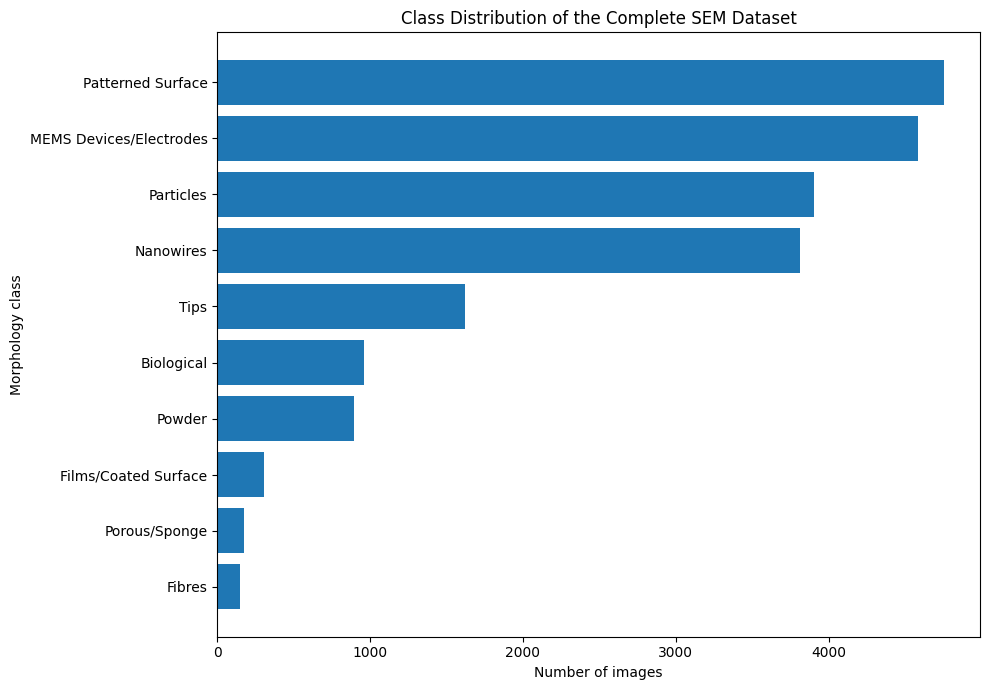

In [109]:
# Visualize the complete class distribution

plot_summary = (
    full_class_summary
    .sort_values("images", ascending=True)
)

plt.figure(figsize=(10, 7))

plt.barh(
    plot_summary["class"],
    plot_summary["images"]
)

plt.xlabel("Number of images")
plt.ylabel("Morphology class")
plt.title("Class Distribution of the Complete SEM Dataset")

plt.tight_layout()
plt.show()

### Interpretation

The dataset is dominated by Patterned Surface, MEMS Devices/Electrodes,
Particles, and Nanowires, while Fibres, Porous/Sponge, and Films/Coated
Surface are comparatively rare.

This imbalance will influence both model training and evaluation.

No images are discarded to artificially balance the dataset. Instead,
imbalance-aware modelling strategies will be evaluated later so that the
original dataset distribution and provenance are preserved.

## 20. Full-Dataset Resolution Distribution

Source image dimensions vary across the complete SEM dataset.

Although most images use the dominant 1024 × 768 format, several classes
also contain slightly smaller images as well as double- and triple-resolution
micrographs.

The complete resolution distribution is summarized here to verify that the
resolution-aware proportional crop remains appropriate for the full dataset
and to inform the later resizing strategy used for machine-learning models.

In [110]:
# Summarize source-image resolutions across the complete dataset

resolution_summary = (
    sem_metadata_full
    .groupby(["width", "height"])
    .size()
    .reset_index(name="images")
    .sort_values("images", ascending=False)
    .reset_index(drop=True)
)

resolution_summary["percentage"] = (
    resolution_summary["images"]
    / len(sem_metadata_full)
    * 100
)

display(resolution_summary)

,width,height,images,percentage
0,1024,768,20893,98.696207
1,3072,2304,178,0.840852
2,1023,767,55,0.259814
3,2048,1536,38,0.179508
4,1022,766,5,0.023619


In [111]:
# Quantify the dominant source resolution

standard_resolution_count = len(
    sem_metadata_full[
        (sem_metadata_full["width"] == 1024) &
        (sem_metadata_full["height"] == 768)
    ]
)

standard_resolution_percentage = (
    standard_resolution_count
    / len(sem_metadata_full)
    * 100
)

print(
    f"1024 × 768 images: "
    f"{standard_resolution_count}"
)

print(
    f"Percentage at dominant resolution: "
    f"{standard_resolution_percentage:.2f}%"
)

1024 × 768 images: 20893
Percentage at dominant resolution: 98.70%


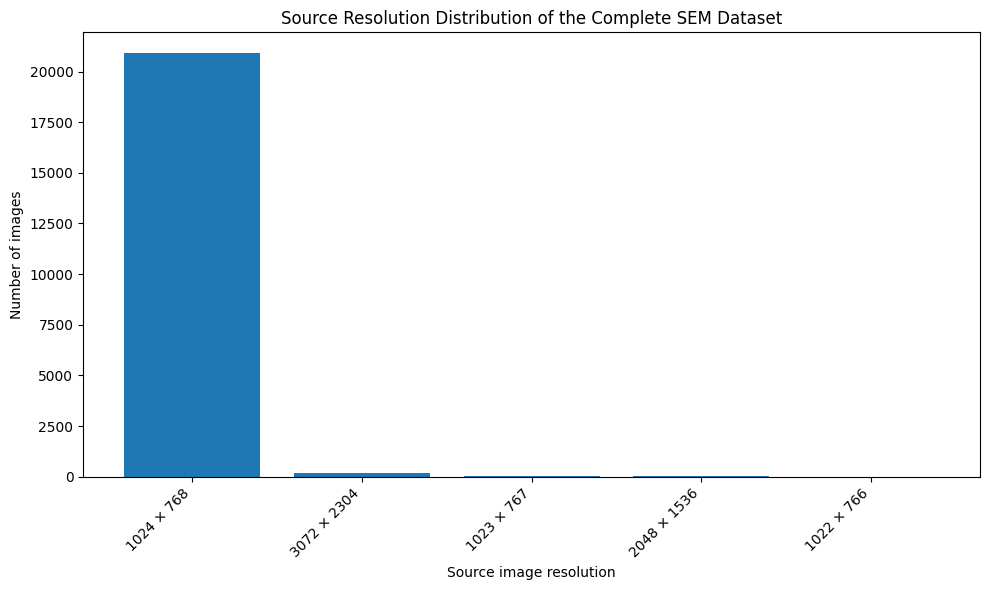

In [112]:
# Visualize source-resolution distribution

resolution_labels = (
    resolution_summary["width"].astype(int).astype(str)
    + " × "
    + resolution_summary["height"].astype(int).astype(str)
)

plt.figure(figsize=(10, 6))

plt.bar(
    resolution_labels,
    resolution_summary["images"]
)

plt.xlabel("Source image resolution")
plt.ylabel("Number of images")
plt.title("Source Resolution Distribution of the Complete SEM Dataset")

plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

### Interpretation of Source Resolution

The complete dataset is highly consistent in source resolution.

Of the 21,169 valid images, 20,893 (98.70%) use the dominant
1024 × 768 format.

The remaining images comprise a small number of slightly smaller exports and
higher-resolution micrographs:

- 178 images at 3072 × 2304;
- 55 images at 1023 × 767;
- 38 images at 2048 × 1536;
- 5 images at 1022 × 766.

Although non-standard resolutions account for only approximately 1.3% of the
dataset, their presence demonstrates that a fixed pixel crop would not be
universally appropriate.

The validated proportional cropping rule, which retains the upper 78.125% of
image height, therefore remains the preferred metadata-removal strategy.

In [113]:
# Identify non-standard source resolutions by morphology class

nonstandard_resolution_summary = (
    sem_metadata_full[
        ~(
            (sem_metadata_full["width"] == 1024) &
            (sem_metadata_full["height"] == 768)
        )
    ]
    .groupby(["class", "width", "height"])
    .size()
    .reset_index(name="images")
    .sort_values(
        ["class", "images"],
        ascending=[True, False]
    )
)

display(nonstandard_resolution_summary)

,class,width,height,images
0,Biological,2048,1536,6
1,Films/Coated Surface,1023,767,1
4,MEMS Devices/Electrodes,3072,2304,69
2,MEMS Devices/Electrodes,1023,767,17
3,MEMS Devices/Electrodes,2048,1536,2
5,Nanowires,1023,767,8
6,Nanowires,2048,1536,5
8,Particles,3072,2304,57
7,Particles,1023,767,13
11,Patterned Surface,2048,1536,25


### Distribution of Non-Standard Resolutions Across Classes

Non-standard source resolutions occur in a minority of the dataset and are
concentrated in seven morphology classes.

Biological, Films/Coated Surface, MEMS Devices/Electrodes, Nanowires,
Particles, Patterned Surface, and Powder contain at least one image whose
dimensions differ from the dominant 1024 × 768 format.

Fibres, Porous/Sponge, and Tips contain only the dominant resolution.

In total, 276 images use non-standard dimensions, representing approximately
1.3% of the complete dataset.

These images are retained because they are valid micrographs and the
resolution-aware proportional crop handles their dimensions without requiring
their removal.

## 21. Full-Dataset Artifact and Annotation Audit

Image dimensions and lower acquisition-strip removal have now been
characterized across the complete dataset.

The next quality-control stage examines visual artifacts that remain inside
the retained microscopy region.

These may include:

- colored cursor or measurement lines;
- measurement labels and boxes;
- microscope-software overlays;
- other annotations that could provide unintended shortcuts to a
  deep-learning classifier.

Artifact screening is treated separately from morphology classification.
Images are flagged for analysis rather than automatically discarded.

### 21.1 Colored-Overlay Screening Across All Classes

SEM micrographs are predominantly grayscale even though the source JPEG files
are stored using RGB channels.

Strong differences among the red, green, and blue channels can therefore
indicate colored acquisition overlays such as:

- measurement cursors;
- guide lines;
- annotation boxes;
- colored labels.

The previously defined chromatic-pixel metric is now applied to the complete
21,169-image dataset.

This screening detects colored overlays only. Grayscale or black annotations
require separate consideration and are not assumed to be absent when the
chromatic score is zero.

In [115]:
# Calculate chromatic content across the complete dataset

sem_metadata_full["chromatic_fraction"] = (
    sem_metadata_full["filepath"]
    .apply(chromatic_pixel_fraction)
)

print("Chromatic-content audit complete.")
print(f"Images analyzed: {len(sem_metadata_full)}")

Chromatic-content audit complete.
Images analyzed: 21169


In [116]:
# Flag candidate colored overlays

COLOR_ARTIFACT_THRESHOLD = 0.001

sem_metadata_full["colored_overlay_candidate"] = (
    sem_metadata_full["chromatic_fraction"]
    >= COLOR_ARTIFACT_THRESHOLD
)

colored_overlay_summary = (
    sem_metadata_full
    .groupby("class")
    .agg(
        images=("filename", "count"),
        colored_candidates=("colored_overlay_candidate", "sum"),
        median_chromatic_fraction=("chromatic_fraction", "median"),
        max_chromatic_fraction=("chromatic_fraction", "max")
    )
    .reset_index()
)

colored_overlay_summary["candidate_percentage"] = (
    colored_overlay_summary["colored_candidates"]
    / colored_overlay_summary["images"]
    * 100
)

colored_overlay_summary = (
    colored_overlay_summary
    .sort_values(
        "candidate_percentage",
        ascending=False
    )
    .reset_index(drop=True)
)

display(colored_overlay_summary)

,class,images,colored_candidates,median_chromatic_fraction,max_chromatic_fraction,candidate_percentage
0,Patterned Surface,4752,1208,0.0,0.032131,25.420875
1,Particles,3905,482,0.0,0.031354,12.343150
2,MEMS Devices/Electrodes,4583,406,0.0,0.032202,8.858826
3,Nanowires,3815,88,0.0,0.017163,2.306684
4,Films/Coated Surface,309,6,0.0,0.010283,1.941748
5,Tips,1621,21,0.0,0.027196,1.295497
6,Porous/Sponge,174,2,0.0,0.004310,1.149425
7,Biological,962,5,0.0,0.019146,0.519751
8,Fibres,150,0,0.0,0.000000,0.000000
9,Powder,898,0,0.0,0.000000,0.000000


In [117]:
total_colored_candidates = (
    sem_metadata_full["colored_overlay_candidate"].sum()
)

print(
    f"Potential colored-overlay images: "
    f"{total_colored_candidates}"
)

print(
    f"Percentage of complete dataset: "
    f"{total_colored_candidates / len(sem_metadata_full) * 100:.2f}%"
)

Potential colored-overlay images: 2218
Percentage of complete dataset: 10.48%


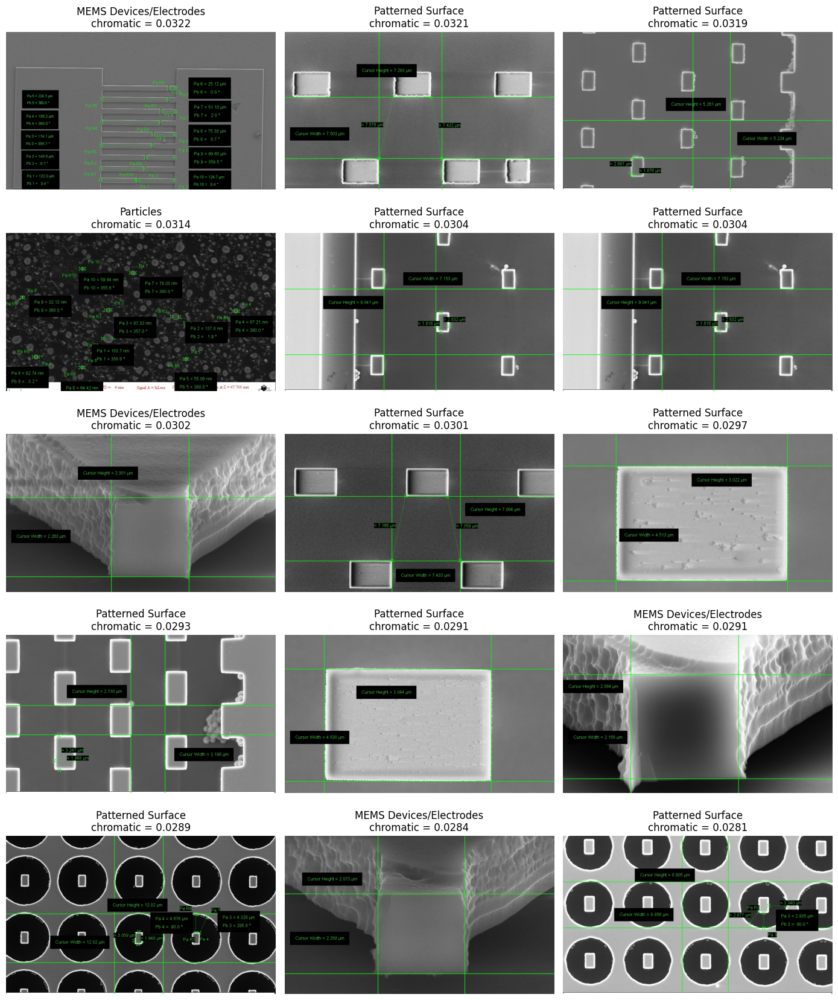

In [118]:
# Inspect the strongest colored-overlay candidates across all classes

top_full_color_candidates = (
    sem_metadata_full
    .sort_values(
        "chromatic_fraction",
        ascending=False
    )
    .head(15)
    .reset_index(drop=True)
)

fig, axes = plt.subplots(
    5,
    3,
    figsize=(14, 17)
)

for ax, (_, record) in zip(
    axes.flat,
    top_full_color_candidates.iterrows()
):
    with Image.open(record["filepath"]) as img:
        cropped = crop_morphology_region(img)

    ax.imshow(cropped)

    ax.set_title(
        f"{record['class']}\n"
        f"chromatic = {record['chromatic_fraction']:.4f}"
    )

    ax.axis("off")

plt.tight_layout()
plt.show()

### 21.1 Colored-Overlay Screening Result

Colored-overlay screening identified 2,218 candidate images, corresponding
to 10.48% of the complete 21,169-image dataset.

The prevalence of candidate overlays varied substantially among morphology
classes:

- Patterned Surface: 25.42%;
- Particles: 12.34%;
- MEMS Devices/Electrodes: 8.86%;
- Nanowires: 2.31%;
- Films/Coated Surface: 1.94%;
- Tips: 1.30%;
- Porous/Sponge: 1.15%;
- Biological: 0.52%;
- Fibres: 0%;
- Powder: 0%.

Visual inspection of the highest-scoring images confirmed that the metric
detects genuine microscope-software overlays, particularly green measurement
lines, cursor guides, and measurement labels.

However, the threshold is treated as a screening heuristic rather than a
ground-truth annotation label. Images are therefore flagged rather than
automatically excluded.

Furthermore, grayscale or black measurement labels can occur even when the
chromatic fraction is zero. Colored-overlay detection should consequently
not be interpreted as a complete annotation detector.

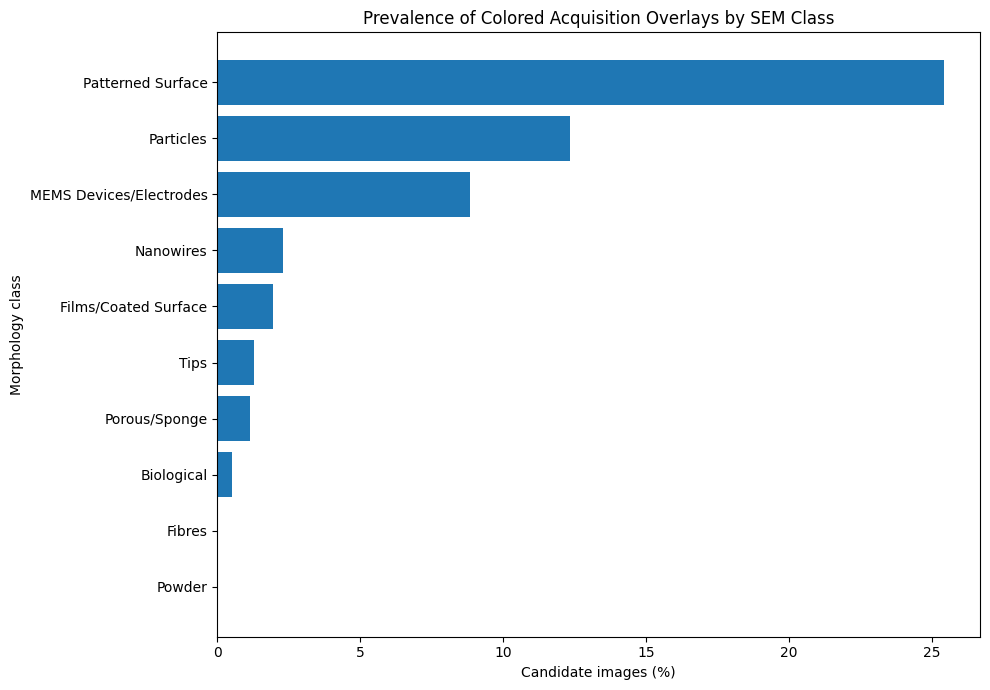

In [119]:
# Visualize colored-overlay candidate prevalence by morphology class

overlay_plot = (
    colored_overlay_summary
    .sort_values("candidate_percentage", ascending=True)
)

plt.figure(figsize=(10, 7))

plt.barh(
    overlay_plot["class"],
    overlay_plot["candidate_percentage"]
)

plt.xlabel("Candidate images (%)")
plt.ylabel("Morphology class")
plt.title("Prevalence of Colored Acquisition Overlays by SEM Class")

plt.tight_layout()
plt.show()

## 22. Full-Dataset Exact-Duplicate Audit

The complete ten-class dataset is now examined for exact duplicate files.

Exact duplicates are particularly important in supervised learning because
identical images assigned to different train, validation, or test partitions
would create direct data leakage and artificially inflate model performance.

MD5 hashes are calculated for all 21,169 source images.

The audit is performed across the complete dataset rather than separately
within classes so that both within-class and cross-class duplication can be
identified.

In [4]:
from pathlib import Path

DATA_ROOT = Path("/content/sem_data")

print("Dataset folder exists:", DATA_ROOT.exists())

if DATA_ROOT.exists():
    folders = sorted([p.name for p in DATA_ROOT.iterdir() if p.is_dir()])

    print(f"Number of class folders: {len(folders)}")
    print("\nFolders:")

    for folder in folders:
        print("-", folder)
else:
    print("The temporary Colab dataset directory is no longer available.")

Dataset folder exists: False
The temporary Colab dataset directory is no longer available.


## Runtime Recovery

The Colab runtime was reset after the initial dataset audit, which removed
temporary files stored under `/content` and cleared Python variables from
memory.

The notebook and previously generated results remained saved, but the raw
SEM images required for subsequent duplicate analysis had to be restored.

Because all ten morphology classes had already been individually audited,
the dataset is reconstructed programmatically using the previously validated
directory structure and audit workflow rather than repeating the exploratory
class-by-class analysis.

In [5]:
from pathlib import Path
from PIL import Image

import os
import random
import hashlib
import tarfile

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

SEED = 42

random.seed(SEED)
np.random.seed(SEED)

DATA_ROOT = Path("/content/sem_data")
ARCHIVE_ROOT = Path("/content/sem_archives")

DATA_ROOT.mkdir(parents=True, exist_ok=True)
ARCHIVE_ROOT.mkdir(parents=True, exist_ok=True)

CROP_RETAIN_FRACTION = 600 / 768

print("Recovery environment initialized.")

Recovery environment initialized.


In [6]:
DATASET_FILES = {
    "Fibres": "Fibres.tar",
    "Porous_Sponge": "Porous_Sponge.tar",
    "Films_Coated_Surface": "Films_Coated_Surface.tar",
    "Biological": "Biological.tar",
    "Tips": "Tips.tar",
    "Powder": "Powder.tar",
    "Nanowires": "Nanowires.tar",
    "Particles": "Particles.tar",
    "Patterned_surface": "Patterned_surface.tar",
    "MEMS_devices_and_electrodes": "MEMS_devices_and_electrodes.tar",
}

BASE_URL = (
    "https://b2share.eudat.eu/records/"
    "zja8y-53j14/files"
)

for folder_name, archive_name in DATASET_FILES.items():

    archive_path = ARCHIVE_ROOT / archive_name
    class_dir = DATA_ROOT / folder_name

    print(f"\n{'=' * 70}")
    print(f"Processing: {folder_name}")

    if class_dir.exists():
        print("Already extracted — skipping.")
        continue

    url = f"{BASE_URL}/{archive_name}?download=1"

    if not archive_path.exists():
        print("Downloading...")
        !wget -q --show-progress -O "$archive_path" "$url"
    else:
        print("Archive already downloaded.")

    print("Extracting...")

    with tarfile.open(archive_path, "r") as tar:
        tar.extractall(DATA_ROOT)

    print("Extraction complete.")

print("\nAll available classes processed.")


Processing: Fibres
Downloading...
/content/sem_archiv 100%[===================>]  77.23M  13.2MB/s    in 6.6s    
Extracting...
Extraction complete.

Processing: Porous_Sponge
Downloading...


/tmp/ipykernel_4504/3136881130.py:42: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(DATA_ROOT)


/content/sem_archiv 100%[===================>] 114.02M  18.6MB/s    in 7.0s    
Extracting...
Extraction complete.

Processing: Films_Coated_Surface
Downloading...
/content/sem_archiv 100%[===================>] 188.48M  14.9MB/s    in 14s     
Extracting...
Extraction complete.

Processing: Biological
Downloading...
/content/sem_archiv 100%[===================>] 671.22M  11.1MB/s    in 63s     
Extracting...
Extraction complete.

Processing: Tips
Downloading...
/content/sem_archiv 100%[===================>] 674.57M  18.2MB/s    in 51s     
Extracting...
Extraction complete.

Processing: Powder
Downloading...
/content/sem_archiv 100%[===================>] 825.71M  17.6MB/s    in 52s     
Extracting...
Extraction complete.

Processing: Nanowires
Downloading...
/content/sem_archiv 100%[===================>]   2.05G  11.0MB/s    in 2m 25s  
Extracting...
Extraction complete.

Processing: Particles
Downloading...
/content/sem_archiv 100%[===================>]   2.35G  10.9MB/s    in 3m 21s 

### Recovery Verification and Metadata Reconstruction

All ten SEM morphology classes have been restored after the Colab runtime
reset.

Rather than repeating the exploratory class-by-class audit, the previously
validated folder structure and audit functions are used to reconstruct the
complete metadata table directly from the restored source images.

The reconstructed dataset is verified against the expected total of
21,169 images before dataset-wide quality-control analysis resumes.

In [7]:
def audit_image_class(class_dir, class_label):
    """Audit all image files within one morphology-class directory."""

    records = []

    image_paths = [
        p for p in class_dir.iterdir()
        if p.is_file()
    ]

    for img_path in image_paths:
        try:
            with Image.open(img_path) as img:
                records.append({
                    "class": class_label,
                    "filename": img_path.name,
                    "filepath": str(img_path),
                    "extension": img_path.suffix.lower(),
                    "width": img.width,
                    "height": img.height,
                    "mode": img.mode,
                    "valid": True
                })

        except Exception:
            records.append({
                "class": class_label,
                "filename": img_path.name,
                "filepath": str(img_path),
                "extension": img_path.suffix.lower(),
                "width": None,
                "height": None,
                "mode": None,
                "valid": False
            })

    return pd.DataFrame(records)

In [8]:
CLASS_MAP = {
    "Fibres": "Fibres",
    "Porous_Sponge": "Porous/Sponge",
    "Films_Coated_Surface": "Films/Coated Surface",
    "Biological": "Biological",
    "Tips": "Tips",
    "Powder": "Powder",
    "Nanowires": "Nanowires",
    "Particles": "Particles",
    "Patterned_surface": "Patterned Surface",
    "MEMS_devices_and_electrodes": "MEMS Devices/Electrodes",
}

metadata_tables = []

for folder_name, class_label in CLASS_MAP.items():

    class_dir = DATA_ROOT / folder_name

    print(f"Auditing {class_label}...")

    class_metadata = audit_image_class(
        class_dir,
        class_label
    )

    metadata_tables.append(class_metadata)

sem_metadata_full = pd.concat(
    metadata_tables,
    ignore_index=True
)

print("\nRecovery audit complete.")
print(f"Total images indexed: {len(sem_metadata_full)}")
print(f"Number of classes: {sem_metadata_full['class'].nunique()}")
print(f"Valid images: {sem_metadata_full['valid'].sum()}")
print(f"Invalid images: {(~sem_metadata_full['valid']).sum()}")

Auditing Fibres...
Auditing Porous/Sponge...
Auditing Films/Coated Surface...
Auditing Biological...
Auditing Tips...
Auditing Powder...
Auditing Nanowires...
Auditing Particles...
Auditing Patterned Surface...
Auditing MEMS Devices/Electrodes...

Recovery audit complete.
Total images indexed: 21169
Number of classes: 10
Valid images: 21169
Invalid images: 0


In [9]:
CROP_RETAIN_FRACTION = 600 / 768


def crop_morphology_region(
    image,
    retain_fraction=CROP_RETAIN_FRACTION
):
    """Remove the lower SEM acquisition-information region."""

    crop_height = round(
        image.height * retain_fraction
    )

    return image.crop(
        (0, 0, image.width, crop_height)
    )


def calculate_md5(file_path, chunk_size=8192):
    """Calculate the MD5 hash of a file."""

    md5 = hashlib.md5()

    with open(file_path, "rb") as f:
        while True:
            chunk = f.read(chunk_size)

            if not chunk:
                break

            md5.update(chunk)

    return md5.hexdigest()


print("Preprocessing and hashing helpers restored.")

Preprocessing and hashing helpers restored.


## 22. Full-Dataset Exact-Duplicate Audit

The complete ten-class dataset is examined for exact duplicate files.

Exact duplicates can cause direct data leakage if identical images are
assigned to different training, validation, or test partitions.

MD5 hashes are therefore calculated across all 21,169 source images,
allowing both within-class and cross-class exact duplicates to be identified.

In [10]:
sem_metadata_full["md5"] = (
    sem_metadata_full["filepath"]
    .apply(calculate_md5)
)

print("MD5 hashing complete.")
print(f"Images hashed: {len(sem_metadata_full)}")

MD5 hashing complete.
Images hashed: 21169


In [11]:
full_duplicate_mask = sem_metadata_full.duplicated(
    subset="md5",
    keep=False
)

full_exact_duplicates = (
    sem_metadata_full[full_duplicate_mask]
    .sort_values(["md5", "class"])
    .reset_index(drop=True)
)

print(
    "Images involved in exact duplicate groups:",
    len(full_exact_duplicates)
)

print(
    "Unique duplicated image contents:",
    full_exact_duplicates["md5"].nunique()
)

Images involved in exact duplicate groups: 650
Unique duplicated image contents: 318


In [12]:
duplicate_group_summary = (
    full_exact_duplicates
    .groupby("md5")
    .agg(
        files=("filename", "count"),
        classes=("class", "nunique")
    )
    .reset_index()
)

cross_class_duplicate_groups = duplicate_group_summary[
    duplicate_group_summary["classes"] > 1
]

print(
    "Exact duplicate groups spanning multiple classes:",
    len(cross_class_duplicate_groups)
)

Exact duplicate groups spanning multiple classes: 0


### 22.1 Exact-Duplicate Audit Result

Exact-content hashing identified 650 images belonging to 318 duplicated
image-content groups across the complete 21,169-image dataset.

No exact duplicate group spans more than one morphology class. Therefore,
no byte-identical image was detected with conflicting class labels.

Exact duplicates remain a potential source of train–test leakage because
different copies of the same SEM image could otherwise be assigned to
different dataset partitions.

Before deduplication, the sizes and class distribution of duplicate groups
are examined. The original source files remain unchanged; deduplication is
performed only in the modelling metadata index.

In [13]:
# Examine the size distribution of exact-duplicate groups

duplicate_size_summary = (
    duplicate_group_summary["files"]
    .value_counts()
    .sort_index()
    .rename_axis("files_per_group")
    .reset_index(name="number_of_groups")
)

display(duplicate_size_summary)

print(
    "Largest exact-duplicate group:",
    duplicate_group_summary["files"].max(),
    "files"
)

,files_per_group,number_of_groups
0,2,307
1,3,8
2,4,3


Largest exact-duplicate group: 4 files


In [14]:
# Summarize exact duplicates by morphology class

exact_duplicate_class_summary = (
    full_exact_duplicates
    .groupby("class")
    .size()
    .reset_index(name="images_in_duplicate_groups")
)

class_totals = (
    sem_metadata_full
    .groupby("class")
    .size()
    .reset_index(name="total_images")
)

exact_duplicate_class_summary = (
    class_totals
    .merge(
        exact_duplicate_class_summary,
        on="class",
        how="left"
    )
)

exact_duplicate_class_summary[
    "images_in_duplicate_groups"
] = (
    exact_duplicate_class_summary[
        "images_in_duplicate_groups"
    ]
    .fillna(0)
    .astype(int)
)

exact_duplicate_class_summary["percentage"] = (
    exact_duplicate_class_summary["images_in_duplicate_groups"]
    / exact_duplicate_class_summary["total_images"]
    * 100
)

display(
    exact_duplicate_class_summary
    .sort_values("percentage", ascending=False)
    .reset_index(drop=True)
)

,class,total_images,images_in_duplicate_groups,percentage
0,Powder,898,54,6.013363
1,Tips,1621,88,5.428748
2,Particles,3905,163,4.174136
3,Patterned Surface,4752,188,3.956229
4,Nanowires,3815,133,3.486239
5,Films/Coated Surface,309,10,3.236246
6,Porous/Sponge,174,4,2.298851
7,Biological,962,6,0.623701
8,MEMS Devices/Electrodes,4583,4,0.087279
9,Fibres,150,0,0.000000


In [15]:
# Create an exact-deduplicated modelling index

sem_metadata_exact_clean = (
    sem_metadata_full
    .drop_duplicates(
        subset="md5",
        keep="first"
    )
    .reset_index(drop=True)
)

exact_duplicates_excluded = (
    len(sem_metadata_full)
    - len(sem_metadata_exact_clean)
)

print(f"Original dataset: {len(sem_metadata_full)}")
print(
    f"After exact deduplication: "
    f"{len(sem_metadata_exact_clean)}"
)
print(
    f"Redundant exact-duplicate files excluded: "
    f"{exact_duplicates_excluded}"
)

Original dataset: 21169
After exact deduplication: 20837
Redundant exact-duplicate files excluded: 332


### 22.2 Exact-Deduplication Result

The complete exact-duplicate audit identified 318 duplicated image-content
groups involving 650 source files.

Duplicate-group sizes were:

- 307 groups containing two files;
- 8 groups containing three files;
- 3 groups containing four files.

No exact duplicate group crossed morphology-class boundaries, indicating that
no byte-identical image was assigned conflicting class labels.

Duplicate prevalence differed among classes, with Powder showing the highest
proportion of images involved in duplicate groups, while no exact duplicates
were detected in Fibres.

For modelling, one representative file is retained from each exact-content
group. This removes 332 redundant files and reduces the working dataset from
21,169 to **20,837 unique source images**.

The original downloaded dataset remains unchanged; deduplication is performed
only through the modelling metadata index.

## 23. Full-Dataset Near-Duplicate Audit

Exact hashing identifies byte-identical files but cannot detect repeated
micrographs that differ because of JPEG compression, metadata changes,
resizing, or other minor transformations.

Near-duplicate detection is therefore performed on the 20,837-image
exact-deduplicated dataset.

The analysis uses a two-stage strategy:

1. perceptual hashing identifies visually similar candidate pairs;
2. candidate pairs are subsequently verified using image-level structural
   similarity.

Perceptual hashes are calculated from the metadata-cropped morphology region
rather than from the complete source image so that differences in the lower
SEM acquisition strip do not determine similarity.

Candidate detection is used as a screening procedure. Images are not removed
solely because they have similar perceptual hashes.

In [16]:
!pip -q install ImageHash

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 7.0 MB/s eta 0:00:00


In [17]:
import imagehash

In [18]:
def calculate_phash(file_path):
    """
    Calculate a perceptual hash from the metadata-cropped
    grayscale morphology region.
    """

    with Image.open(file_path) as img:
        morphology = crop_morphology_region(img)
        morphology = morphology.convert("L")

        return imagehash.phash(morphology)

In [19]:
sem_metadata_exact_clean["phash"] = (
    sem_metadata_exact_clean["filepath"]
    .apply(calculate_phash)
)

print("Perceptual hashing complete.")
print(
    f"Images hashed: {len(sem_metadata_exact_clean)}"
)

display(
    sem_metadata_exact_clean[
        ["class", "filename", "phash"]
    ].head()
)

Perceptual hashing complete.
Images hashed: 20837


,class,filename,phash
0,Fibres,L9_101598f903952ce5824bb684d6b49b04.jpg,95e4f454560a7baa
1,Fibres,L9_b3eb41aa88f18cde89c43b63566b6781.jpg,baaeb20b2b3d071a
2,Fibres,L9_43f3cd91d2fa7eb39be50038a3ffc3f0.jpg,d7736d0b72141d1c
3,Fibres,L9_868551a78f03d7f5f119596a961d842d.jpg,9eaa5aa54aa54ab5
4,Fibres,L9_e3899d1ae2a773ee9da752bac01ec6d9.jpg,fe103ed07a8d7609


### 23.2 Efficient Perceptual-Similarity Search

A direct all-versus-all comparison of more than 20,000 images would require
hundreds of millions of pairwise comparisons.

A BK-tree is therefore used to search the perceptual-hash space efficiently.
The tree retrieves only image pairs whose Hamming distance falls within a
small similarity radius.

A perceptual-hash distance of 6 or less is used for candidate generation,
consistent with the exploratory near-duplicate screening performed earlier.

This threshold does not define duplication; it only determines which pairs
receive more detailed verification.

In [20]:
# Convert perceptual hashes to integers

phash_values = [
    int(str(h), 16)
    for h in sem_metadata_exact_clean["phash"]
]

In [21]:
class BKTreeNode:
    def __init__(self, value, index):
        self.value = value
        self.indices = [index]
        self.children = {}


class BKTree:
    def __init__(self):
        self.root = None

    @staticmethod
    def distance(a, b):
        return (a ^ b).bit_count()

    def add(self, value, index):

        if self.root is None:
            self.root = BKTreeNode(value, index)
            return

        node = self.root

        while True:

            d = self.distance(value, node.value)

            if d == 0:
                node.indices.append(index)
                return

            if d in node.children:
                node = node.children[d]

            else:
                node.children[d] = BKTreeNode(
                    value,
                    index
                )
                return

    def search(self, value, max_distance):

        results = []

        def _search(node):

            d = self.distance(value, node.value)

            if d <= max_distance:
                for idx in node.indices:
                    results.append((idx, d))

            lower = d - max_distance
            upper = d + max_distance

            for edge_distance, child in node.children.items():
                if lower <= edge_distance <= upper:
                    _search(child)

        if self.root is not None:
            _search(self.root)

        return results

In [22]:
phash_tree = BKTree()

for idx, value in enumerate(phash_values):
    phash_tree.add(value, idx)

print("BK-tree constructed.")

BK-tree constructed.


In [23]:
PHASH_THRESHOLD = 6

candidate_pairs = set()

for idx, value in enumerate(phash_values):

    matches = phash_tree.search(
        value,
        PHASH_THRESHOLD
    )

    for other_idx, distance in matches:

        if other_idx <= idx:
            continue

        candidate_pairs.add(
            (idx, other_idx, distance)
        )

print(
    "Candidate near-duplicate pairs:",
    len(candidate_pairs)
)

Candidate near-duplicate pairs: 7998


### 23.3 Structural-Similarity Verification

Perceptual-hash screening reduced the approximately 217 million possible
pairwise comparisons to 7,998 candidate image pairs.

These candidates now undergo more detailed verification using the Structural
Similarity Index Measure (SSIM).

Because source images occur at several resolutions, each morphology-only
region is converted to grayscale and resized to a common 256 × 150 pixel
representation before comparison.

This standardized representation preserves the approximate aspect ratio of
the validated microscopy region while greatly reducing computational cost.

SSIM is used as a verification metric rather than an automatic duplicate
criterion. The distribution of similarity scores is examined before any
near-duplicate threshold is selected.

In [24]:
from skimage.metrics import structural_similarity as ssim

In [25]:
# Determine which images participate in at least one candidate pair

candidate_indices = sorted(
    {
        idx
        for idx1, idx2, _ in candidate_pairs
        for idx in (idx1, idx2)
    }
)

print("Unique images involved in candidate pairs:", len(candidate_indices))

Unique images involved in candidate pairs: 2595


In [26]:
# Cache standardized morphology images for efficient SSIM calculation

SSIM_SIZE = (256, 150)  # width, height

ssim_image_cache = {}

for idx in candidate_indices:

    file_path = sem_metadata_exact_clean.loc[idx, "filepath"]

    with Image.open(file_path) as img:

        morphology = crop_morphology_region(img)

        standardized = (
            morphology
            .convert("L")
            .resize(
                SSIM_SIZE,
                Image.Resampling.LANCZOS
            )
        )

        ssim_image_cache[idx] = np.asarray(
            standardized,
            dtype=np.uint8
        )

print(
    "Standardized images cached:",
    len(ssim_image_cache)
)

Standardized images cached: 2595


In [27]:
# Calculate SSIM for every perceptual-hash candidate pair

near_duplicate_results = []

for idx1, idx2, phash_distance in candidate_pairs:

    arr1 = ssim_image_cache[idx1]
    arr2 = ssim_image_cache[idx2]

    score = ssim(
        arr1,
        arr2,
        data_range=255
    )

    near_duplicate_results.append({
        "index_1": idx1,
        "index_2": idx2,
        "class_1": sem_metadata_exact_clean.loc[idx1, "class"],
        "class_2": sem_metadata_exact_clean.loc[idx2, "class"],
        "filename_1": sem_metadata_exact_clean.loc[idx1, "filename"],
        "filename_2": sem_metadata_exact_clean.loc[idx2, "filename"],
        "phash_distance": phash_distance,
        "ssim": score
    })

near_duplicate_df = pd.DataFrame(
    near_duplicate_results
)

print(
    "Candidate pairs verified with SSIM:",
    len(near_duplicate_df)
)

Candidate pairs verified with SSIM: 7998


In [28]:
# Summarize SSIM scores

display(
    near_duplicate_df["ssim"]
    .describe(
        percentiles=[
            0.50,
            0.75,
            0.90,
            0.95,
            0.975,
            0.99,
            0.995
        ]
    )
)

,ssim
count,7998.000000
mean,0.438615
std,0.239316
min,-0.028868
50%,0.383592
75%,0.548539
90%,0.869426
95%,0.945872
97.5%,0.978935
99%,0.996503


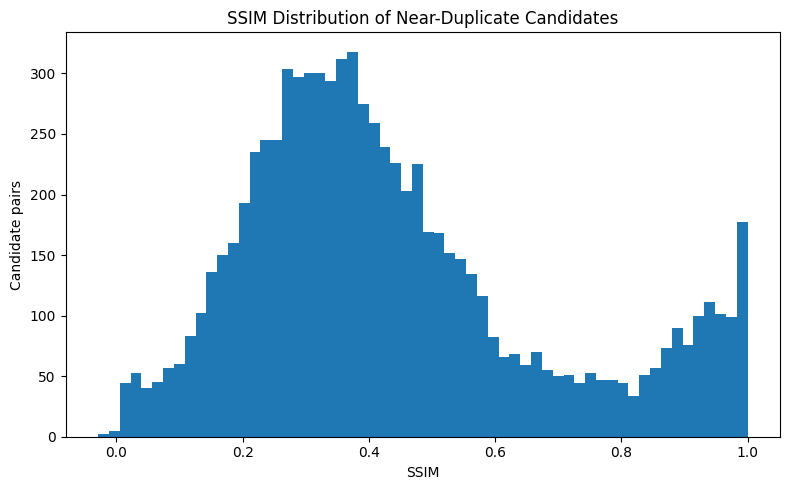

In [29]:
# Visualize the SSIM distribution

plt.figure(figsize=(8, 5))

plt.hist(
    near_duplicate_df["ssim"],
    bins=60
)

plt.xlabel("SSIM")
plt.ylabel("Candidate pairs")
plt.title("SSIM Distribution of Near-Duplicate Candidates")

plt.tight_layout()
plt.show()

In [30]:
# Count highly similar pairs at several reference thresholds

for threshold in [0.90, 0.95, 0.98, 0.99]:

    count = (
        near_duplicate_df["ssim"]
        >= threshold
    ).sum()

    print(
        f"SSIM >= {threshold:.2f}: "
        f"{count} pairs"
    )

SSIM >= 0.90: 655 pairs
SSIM >= 0.95: 374 pairs
SSIM >= 0.98: 192 pairs
SSIM >= 0.99: 135 pairs


### 23.4 High-Similarity Candidate Analysis

Perceptual-hash screening produced 7,998 candidate image pairs involving
2,595 unique images.

SSIM verification showed that most perceptually similar pairs are structurally
distinct. The median SSIM was approximately 0.38, whereas a much smaller
high-similarity tail approached 1.0.

Candidate counts at selected SSIM levels were:

- SSIM ≥ 0.90: 655 pairs;
- SSIM ≥ 0.95: 374 pairs;
- SSIM ≥ 0.98: 192 pairs;
- SSIM ≥ 0.99: 135 pairs.

The high-SSIM tail is therefore examined in greater detail before a
near-duplicate criterion is defined.

Particular attention is given to pairs spanning different morphology classes,
because such cases could indicate label conflicts or severe dataset leakage.

In [31]:
# Examine high-similarity pairs across class boundaries

high_similarity_pairs = near_duplicate_df[
    near_duplicate_df["ssim"] >= 0.98
].copy()

cross_class_high_similarity = high_similarity_pairs[
    high_similarity_pairs["class_1"]
    != high_similarity_pairs["class_2"]
].copy()

print(
    "Pairs with SSIM >= 0.98:",
    len(high_similarity_pairs)
)

print(
    "Cross-class pairs with SSIM >= 0.98:",
    len(cross_class_high_similarity)
)

if len(cross_class_high_similarity) > 0:
    display(
        cross_class_high_similarity
        .sort_values("ssim", ascending=False)
        .head(30)
    )

Pairs with SSIM >= 0.98: 192
Cross-class pairs with SSIM >= 0.98: 0


In [32]:
# Display the strongest near-duplicate candidates

top_similarity_pairs = (
    near_duplicate_df
    .sort_values(
        ["ssim", "phash_distance"],
        ascending=[False, True]
    )
    .head(30)
    .reset_index(drop=True)
)

display(
    top_similarity_pairs[
        [
            "class_1",
            "class_2",
            "filename_1",
            "filename_2",
            "phash_distance",
            "ssim"
        ]
    ]
)

,class_1,class_2,filename_1,filename_2,phash_distance,ssim
0,Nanowires,Nanowires,L6_d027d3003622043a914b21d966eb9547.jpg,L6_62d55b7ac5efaebcb4564d0f2574df0a.jpg,0,1.000000
1,Nanowires,Nanowires,L6_5a0b82e06391c3b81fcfa8c8ca429bda.jpg,L6_8a0b228062879d168a3a309453f17073.jpg,0,1.000000
2,Nanowires,Nanowires,L6_d9fac5635074b64dde64950a48874b8f.jpg,L6_29998571ce264fb414e93ad8d90b6941.jpg,0,1.000000
3,Nanowires,Nanowires,L6_83d3727852028ef990f6d73150c9abf5.jpg,L6_7c9d88b10864cd18ea0ee68680297770.jpg,0,1.000000
4,Films/Coated Surface,Films/Coated Surface,L3_fabfcd43e9f755e4d5013feebd6ac25b.jpg,L3_821e8a106d20a1a82c03c29d039fa354.jpg,0,1.000000
5,Tips,Tips,L5_64883cfa037264db880eea34a9b5dd1c.jpg,L5_9df09220b447792bd55ea75fb2e81967.jpg,0,0.999999
6,Powder,Powder,L4_80ed47ecd9b707cf5210fd548f7c7286.jpg,L4_862596af378b4ca22b869be565f7c0b6.jpg,0,0.999971
7,Nanowires,Nanowires,L6_48d519e4948cd3134ea5fcaed55eb2b0.jpg,L6_4450de9034cbd2f2697110f70105cbea.jpg,0,0.999964
8,Nanowires,Nanowires,L6_d070c229481276a3cbd0372cc0cdcd4c.jpg,L6_6d1238dcb32bf9decd8a875417c6fa3e.jpg,0,0.999947
9,Powder,Powder,L4_ac97ef85473c466f7679ffecb9162d29.jpg,L4_fc773236ba093c9c9ee81a43d4fc426e.jpg,0,0.999945


In [33]:
# Visual inspection of the strongest near-duplicate candidates

pairs_to_show = top_similarity_pairs.head(12)

fig, axes = plt.subplots(
    len(pairs_to_show),
    2,
    figsize=(12, 4 * len(pairs_to_show))
)

for row, pair in pairs_to_show.iterrows():

    idx1 = pair["index_1"]
    idx2 = pair["index_2"]

    records = [
        sem_metadata_exact_clean.loc[idx1],
        sem_metadata_exact_clean.loc[idx2]
    ]

    for col, record in enumerate(records):

        with Image.open(record["filepath"]) as img:
            cropped = crop_morphology_region(img)

        axes[row, col].imshow(
            cropped,
            cmap="gray"
        )

        axes[row, col].set_title(
            f"{record['class']}\n"
            f"SSIM = {pair['ssim']:.4f}, "
            f"pHash d = {pair['phash_distance']}"
        )

        axes[row, col].axis("off")

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

### 23.5 Conservative Near-Duplicate Threshold Assessment

Visual inspection of the highest-scoring candidate pairs confirmed that many
represent effectively identical microscopy fields despite differing source
files.

Importantly, no pair with SSIM ≥ 0.98 spans different morphology classes.

However, high SSIM alone does not prove duplication. Distinct micrographs of
highly regular materials may also exhibit strong structural similarity.

A conservative threshold is therefore selected only after examining image
pairs near several high-similarity boundaries.

In [34]:
# Count pairs at stricter candidate thresholds

for threshold in [0.98, 0.99, 0.995, 0.998, 0.999]:

    subset = near_duplicate_df[
        near_duplicate_df["ssim"] >= threshold
    ]

    print(
        f"SSIM >= {threshold:.3f}: "
        f"{len(subset)} pairs"
    )

SSIM >= 0.980: 192 pairs
SSIM >= 0.990: 135 pairs
SSIM >= 0.995: 97 pairs
SSIM >= 0.998: 52 pairs
SSIM >= 0.999: 33 pairs


In [35]:
# Inspect pairs close to a conservative near-duplicate boundary

boundary_candidates = (
    near_duplicate_df[
        (near_duplicate_df["ssim"] >= 0.995) &
        (near_duplicate_df["ssim"] < 0.999)
    ]
    .sort_values("ssim")
    .reset_index(drop=True)
)

print(
    "Pairs with 0.995 <= SSIM < 0.999:",
    len(boundary_candidates)
)

display(
    boundary_candidates[
        [
            "class_1",
            "class_2",
            "phash_distance",
            "ssim",
            "filename_1",
            "filename_2"
        ]
    ].head(20)
)

Pairs with 0.995 <= SSIM < 0.999: 64


,class_1,class_2,phash_distance,ssim,filename_1,filename_2
0,Particles,Particles,0,0.995034,L2_90d842d7c6310ea7df6fccbc7280f977.jpg,L2_245de5981639d497b6d9469eb8a36394.jpg
1,Nanowires,Nanowires,0,0.995035,L6_a75920e692a53ce37ca7e670d2a54c5d.jpg,L6_800cfb36e2fe655284e568bc53abd7d9.jpg
2,Patterned Surface,Patterned Surface,2,0.995127,L1_d9881c5a435ef5841551b441476d3f51.jpg,L1_73af2d24268014a4ebf99c70deb96249.jpg
3,Nanowires,Nanowires,0,0.995137,L6_18ed8f64710f50de97fbb4dfd079642c.jpg,L6_800cfb36e2fe655284e568bc53abd7d9.jpg
4,Powder,Powder,2,0.995187,L4_1558626e2682946033b11ae63d048840.jpg,L4_0a9968d39065bf985174314139eb20fa.jpg
5,Patterned Surface,Patterned Surface,2,0.995217,L1_9fad4fdf0706d646021bde2115576305.jpg,L1_4218a2b7589944a98c6ee56478ce8cc1.jpg
6,Particles,Particles,2,0.995415,L2_f45d4c04214d22d47848247d4dd631dd.jpg,L2_48563ed5085b01514bcd5796848d41c7.jpg
7,MEMS Devices/Electrodes,MEMS Devices/Electrodes,2,0.995715,L8_dd6a7bc1cea3d061de33c29ee6fbe995.jpg,L8_9b257116724eac994f836087392e959f.jpg
8,Particles,Particles,0,0.995732,L2_58b882ecd17bb5e5d9a0582ab8682b1f.jpg,L2_245de5981639d497b6d9469eb8a36394.jpg
9,Tips,Tips,0,0.995772,L5_be6661e952531ea33d8acb51a95a5b44.jpg,L5_2e60dc23ef4e219c74e00c3ffdd2e694.jpg


In [36]:
boundary_to_show = boundary_candidates.head(12)

if len(boundary_to_show) > 0:

    fig, axes = plt.subplots(
        len(boundary_to_show),
        2,
        figsize=(12, 4 * len(boundary_to_show))
    )

    if len(boundary_to_show) == 1:
        axes = np.array([axes])

    for row, pair in boundary_to_show.iterrows():

        for col, idx in enumerate(
            [pair["index_1"], pair["index_2"]]
        ):

            record = sem_metadata_exact_clean.loc[idx]

            with Image.open(record["filepath"]) as img:
                morphology = crop_morphology_region(img)

            axes[row, col].imshow(
                morphology,
                cmap="gray"
            )

            axes[row, col].set_title(
                f"{record['class']}\n"
                f"SSIM={pair['ssim']:.4f}, "
                f"pHash d={pair['phash_distance']}"
            )

            axes[row, col].axis("off")

    plt.tight_layout()
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

### 23.6 Final Near-Duplicate Criterion

Visual inspection of candidate pairs near the high-similarity boundary showed
that pairs with SSIM values around 0.995 still represented effectively the
same microscopy field of view.

Differences between these images were primarily associated with minor
acquisition changes, measurement overlays, or other non-morphological image
variations.

The final high-confidence near-duplicate criterion is therefore:

**pHash candidate distance ≤ 6 and SSIM ≥ 0.995**

The pHash threshold is used only for efficient candidate generation, whereas
SSIM provides the primary verification criterion.

No high-similarity near-duplicate pair was observed across different
morphology classes, providing no evidence of conflicting labels among the
identified repeated images.

Near-duplicate removal is performed through connected image groups rather
than independent pair deletion so that chains of related images are handled
consistently.

In [37]:
# Select high-confidence near-duplicate relationships

NEAR_DUPLICATE_SSIM_THRESHOLD = 0.995

confirmed_near_duplicate_pairs = near_duplicate_df[
    near_duplicate_df["ssim"]
    >= NEAR_DUPLICATE_SSIM_THRESHOLD
].copy()

print(
    "Confirmed near-duplicate relationships:",
    len(confirmed_near_duplicate_pairs)
)

Confirmed near-duplicate relationships: 97


In [38]:
# Build connected near-duplicate groups with union-find

parent = {}


def find(x):
    parent.setdefault(x, x)

    if parent[x] != x:
        parent[x] = find(parent[x])

    return parent[x]


def union(a, b):
    root_a = find(a)
    root_b = find(b)

    if root_a != root_b:
        parent[root_b] = root_a


for _, pair in confirmed_near_duplicate_pairs.iterrows():
    union(
        int(pair["index_1"]),
        int(pair["index_2"])
    )


near_duplicate_groups = {}

for idx in parent:
    root = find(idx)

    near_duplicate_groups.setdefault(
        root,
        []
    ).append(idx)


near_duplicate_groups = {
    root: sorted(indices)
    for root, indices in near_duplicate_groups.items()
    if len(indices) > 1
}

print(
    "High-confidence near-duplicate groups:",
    len(near_duplicate_groups)
)

print(
    "Images involved in near-duplicate groups:",
    sum(
        len(group)
        for group in near_duplicate_groups.values()
    )
)

print(
    "Largest near-duplicate group:",
    max(
        len(group)
        for group in near_duplicate_groups.values()
    )
)

High-confidence near-duplicate groups: 92
Images involved in near-duplicate groups: 187
Largest near-duplicate group: 3


In [39]:
near_duplicate_redundant_count = sum(
    len(group) - 1
    for group in near_duplicate_groups.values()
)

print(
    "Redundant near-duplicate images:",
    near_duplicate_redundant_count
)

print(
    "Dataset after exact + near deduplication:",
    len(sem_metadata_exact_clean)
    - near_duplicate_redundant_count
)

Redundant near-duplicate images: 95
Dataset after exact + near deduplication: 20742


### 23.7 Near-Deduplication Result

The final high-confidence near-duplicate analysis identified 92 connected
near-duplicate groups involving 187 images.

The largest group contained three related images.

Retaining one representative image from each connected group requires the
exclusion of 95 redundant near-duplicate images.

Combined with the earlier exact-deduplication step:

- Original dataset: 21,169 images
- Exact-duplicate exclusions: 332 images
- Near-duplicate exclusions: 95 images
- Final deduplicated modelling dataset: **20,742 images**

No high-confidence exact or near-duplicate relationship crossed morphology
class boundaries.

The raw source dataset remains unchanged. All exclusions apply only to the
modelling metadata index.

### 23.8 Representative Selection Within Near-Duplicate Groups

Near-duplicate groups may contain different versions of effectively the same
microscopy field, including versions with measurement cursors or colored
acquisition overlays.

Rather than selecting representatives arbitrarily, the image with the lowest
chromatic-overlay fraction is retained from each group.

This preference reduces avoidable acquisition artifacts while preserving the
underlying microscopy observation.

If multiple images have identical chromatic scores, the lowest original
metadata index is used as a deterministic tie-breaker.

In [40]:
def chromatic_pixel_fraction(
    file_path,
    channel_difference_threshold=25
):
    """Estimate strongly chromatic content in the morphology region."""

    with Image.open(file_path) as img:
        morphology = crop_morphology_region(img).convert("RGB")
        arr = np.asarray(morphology).astype(np.int16)

    channel_range = arr.max(axis=2) - arr.min(axis=2)

    return (
        channel_range > channel_difference_threshold
    ).mean()

In [41]:
# Identify every image participating in a near-duplicate group

near_duplicate_member_indices = sorted({
    idx
    for group in near_duplicate_groups.values()
    for idx in group
})

member_chromatic_fraction = {}

for idx in near_duplicate_member_indices:

    file_path = sem_metadata_exact_clean.loc[idx, "filepath"]

    member_chromatic_fraction[idx] = (
        chromatic_pixel_fraction(file_path)
    )

print(
    "Near-duplicate images assessed:",
    len(member_chromatic_fraction)
)

Near-duplicate images assessed: 187


In [42]:
# Select the least chromatic representative from each group

representatives = {}
near_duplicate_indices_to_exclude = set()
exclusion_records = []

for group_number, indices in enumerate(
    near_duplicate_groups.values(),
    start=1
):

    representative_idx = min(
        indices,
        key=lambda idx: (
            member_chromatic_fraction[idx],
            idx
        )
    )

    representatives[group_number] = representative_idx

    representative_filename = (
        sem_metadata_exact_clean.loc[
            representative_idx,
            "filename"
        ]
    )

    for idx in indices:

        if idx == representative_idx:
            continue

        near_duplicate_indices_to_exclude.add(idx)

        exclusion_records.append({
            "near_duplicate_group": group_number,
            "excluded_class":
                sem_metadata_exact_clean.loc[idx, "class"],
            "excluded_filename":
                sem_metadata_exact_clean.loc[idx, "filename"],
            "representative_filename":
                representative_filename,
            "excluded_chromatic_fraction":
                member_chromatic_fraction[idx],
            "representative_chromatic_fraction":
                member_chromatic_fraction[representative_idx]
        })

near_duplicate_exclusions = pd.DataFrame(
    exclusion_records
)

print(
    "Representatives retained:",
    len(representatives)
)

print(
    "Near-duplicate images excluded:",
    len(near_duplicate_indices_to_exclude)
)

Representatives retained: 92
Near-duplicate images excluded: 95


In [43]:
sem_metadata_model = (
    sem_metadata_exact_clean
    .drop(
        index=list(
            near_duplicate_indices_to_exclude
        )
    )
    .reset_index(drop=True)
)

print(f"Original dataset: {len(sem_metadata_full)}")
print(
    f"After exact deduplication: "
    f"{len(sem_metadata_exact_clean)}"
)
print(
    f"After exact + near deduplication: "
    f"{len(sem_metadata_model)}"
)

Original dataset: 21169
After exact deduplication: 20837
After exact + near deduplication: 20742


In [44]:
from google.colab import drive

drive.mount("/content/drive")

Mounted at /content/drive


In [45]:
OUTPUT_DIR = Path(
    "/content/drive/MyDrive/"
    "intelligent-microscopy-materials/data/processed"
)

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

# Store a runtime-independent relative path
sem_metadata_model["relative_path"] = (
    sem_metadata_model["filepath"]
    .apply(
        lambda p: str(
            Path(p).relative_to(DATA_ROOT)
        )
    )
)

sem_metadata_model.to_csv(
    OUTPUT_DIR / "sem_deduplicated_index.csv",
    index=False
)

near_duplicate_exclusions.to_csv(
    OUTPUT_DIR / "near_duplicate_exclusions.csv",
    index=False
)

print("Persistent metadata saved.")
print(OUTPUT_DIR)

Persistent metadata saved.
/content/drive/MyDrive/intelligent-microscopy-materials/data/processed


## 24. Final Modelling Dataset and Preprocessing Policy

After exact- and near-duplicate removal, the working modelling dataset contains
20,742 unique SEM images.

The final preprocessing strategy is designed to preserve morphology while
reducing acquisition-related shortcuts.

The adopted workflow is:

1. retain the upper 78.125% of image height to remove the lower SEM
   acquisition-information strip;
2. convert the retained microscopy region to grayscale;
3. resize images to a common model-specific input size during training;
4. preserve artifact flags rather than automatically discarding annotated
   images;
5. maintain the original raw source images unchanged.

Grayscale conversion removes color itself as a potential shortcut but does not
remove the geometry of embedded measurement lines or grayscale labels.

Artifact-related model behavior will therefore also be examined during later
failure analysis and explainability experiments.

In [46]:
# Calculate chromatic-overlay information for the final modelling index

sem_metadata_model["chromatic_fraction"] = (
    sem_metadata_model["filepath"]
    .apply(chromatic_pixel_fraction)
)

COLOR_ARTIFACT_THRESHOLD = 0.001

sem_metadata_model["colored_overlay_candidate"] = (
    sem_metadata_model["chromatic_fraction"]
    >= COLOR_ARTIFACT_THRESHOLD
)

print(
    "Colored-overlay candidates:",
    sem_metadata_model["colored_overlay_candidate"].sum()
)

print(
    "Percentage of modelling dataset:",
    f"{sem_metadata_model['colored_overlay_candidate'].mean() * 100:.2f}%"
)

Colored-overlay candidates: 2140
Percentage of modelling dataset: 10.32%


In [47]:
final_class_summary = (
    sem_metadata_model
    .groupby("class")
    .agg(
        images=("filename", "count"),
        colored_overlay_candidates=(
            "colored_overlay_candidate",
            "sum"
        )
    )
    .reset_index()
)

final_class_summary["percentage"] = (
    final_class_summary["images"]
    / len(sem_metadata_model)
    * 100
)

final_class_summary["overlay_percentage"] = (
    final_class_summary["colored_overlay_candidates"]
    / final_class_summary["images"]
    * 100
)

display(
    final_class_summary
    .sort_values("images", ascending=False)
    .reset_index(drop=True)
)

,class,images,colored_overlay_candidates,percentage,overlay_percentage
0,Patterned Surface,4642,1175,22.379713,25.312365
1,MEMS Devices/Electrodes,4565,400,22.008485,8.762322
2,Particles,3810,458,18.368528,12.020997
3,Nanowires,3728,75,17.973194,2.011803
4,Tips,1567,21,7.554720,1.340140
5,Biological,957,3,4.613827,0.313480
6,Powder,852,0,4.107608,0.000000
7,Films/Coated Surface,301,6,1.451162,1.993355
8,Porous/Sponge,170,2,0.819593,1.176471
9,Fibres,150,0,0.723170,0.000000


In [48]:
sem_metadata_model.to_csv(
    OUTPUT_DIR / "sem_deduplicated_index.csv",
    index=False
)

final_class_summary.to_csv(
    OUTPUT_DIR / "final_class_summary.csv",
    index=False
)

print("Updated modelling metadata saved to Google Drive.")

Updated modelling metadata saved to Google Drive.


### Final Artifact-Flag Summary

After exact- and near-duplicate removal, the final modelling dataset contains
20,742 unique SEM images.

Of these, 2,140 images (10.32%) meet the provisional colored-overlay
screening criterion.

Colored overlays remain concentrated primarily in Patterned Surface,
Particles, and MEMS Devices/Electrodes. Fibres and Powder contain no
colored-overlay candidates at the selected threshold.

These images are retained rather than removed. The artifact flag is preserved
for later robustness and explainability analyses so that model performance can
be compared between overlay-positive and overlay-negative images.

## 25. Reproducible Train/Validation/Test Split

The final deduplicated dataset is divided into independent training,
validation, and test partitions.

A **70/15/15 split** is used:

- 70% training;
- 15% validation;
- 15% test.

Splitting is stratified by morphology class so that the strong class imbalance
present in the complete dataset is represented proportionally in all three
partitions.

A fixed random seed ensures that the same split can be reconstructed in future
experiments.

Exact and high-confidence near-duplicate redundancy has already been removed
before splitting, reducing the risk that repeated microscopy fields occur in
different partitions.

The test set will remain untouched during model development and will be used
only for final evaluation.

In [49]:
from sklearn.model_selection import train_test_split

In [50]:
# Create stratified training and temporary partitions

train_df, temp_df = train_test_split(
    sem_metadata_model,
    test_size=0.30,
    random_state=SEED,
    stratify=sem_metadata_model["class"]
)

print(f"Training images: {len(train_df)}")
print(f"Temporary images: {len(temp_df)}")

Training images: 14519
Temporary images: 6223


In [51]:
# Divide the temporary partition equally into validation and test sets

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.50,
    random_state=SEED,
    stratify=temp_df["class"]
)

print(f"Training images:   {len(train_df)}")
print(f"Validation images: {len(val_df)}")
print(f"Test images:       {len(test_df)}")

print(
    "\nTotal:",
    len(train_df) + len(val_df) + len(test_df)
)

Training images:   14519
Validation images: 3111
Test images:       3112

Total: 20742


### 25.1 Split Verification

The stratified split produced:

- 14,519 training images;
- 3,111 validation images;
- 3,112 test images.

The partitions are now checked for:

1. preservation of morphology-class proportions;
2. representation of minority classes;
3. absence of exact-content overlap between partitions;
4. consistency of colored-overlay prevalence.

These checks are performed before the split assignments are fixed for all
subsequent modelling notebooks.

In [52]:
# Compare class representation across train, validation, and test sets

def split_class_summary(df, split_name):

    summary = (
        df.groupby("class")
        .size()
        .reset_index(name="images")
    )

    summary["split"] = split_name

    summary["percentage"] = (
        summary["images"] / len(df) * 100
    )

    return summary


train_summary = split_class_summary(
    train_df,
    "Train"
)

val_summary = split_class_summary(
    val_df,
    "Validation"
)

test_summary = split_class_summary(
    test_df,
    "Test"
)

split_summary = pd.concat(
    [
        train_summary,
        val_summary,
        test_summary
    ],
    ignore_index=True
)

split_class_table = (
    split_summary
    .pivot(
        index="class",
        columns="split",
        values="images"
    )
    .fillna(0)
    .astype(int)
)

display(split_class_table)

split,Test,Train,Validation
class,,,
Biological,144,670,143
Fibres,22,105,23
Films/Coated Surface,45,211,45
MEMS Devices/Electrodes,685,3195,685
Nanowires,559,2610,559
Particles,572,2667,571
Patterned Surface,697,3249,696
Porous/Sponge,25,119,26
Powder,128,596,128


In [53]:
split_percentage_table = (
    split_summary
    .pivot(
        index="class",
        columns="split",
        values="percentage"
    )
)

display(
    split_percentage_table.round(2)
)

split,Test,Train,Validation
class,,,
Biological,4.63,4.61,4.60
Fibres,0.71,0.72,0.74
Films/Coated Surface,1.45,1.45,1.45
MEMS Devices/Electrodes,22.01,22.01,22.02
Nanowires,17.96,17.98,17.97
Particles,18.38,18.37,18.35
Patterned Surface,22.40,22.38,22.37
Porous/Sponge,0.80,0.82,0.84
Powder,4.11,4.10,4.11


### 25.2 Leakage Check Across Dataset Partitions

The final dataset was deduplicated before partitioning.

As an additional safeguard, MD5 identifiers are compared directly across the
training, validation, and test sets.

No exact image-content hash should occur in more than one partition.

In [54]:
# Verify exact-content separation between dataset partitions

train_md5 = set(train_df["md5"])
val_md5 = set(val_df["md5"])
test_md5 = set(test_df["md5"])

train_val_overlap = train_md5.intersection(val_md5)
train_test_overlap = train_md5.intersection(test_md5)
val_test_overlap = val_md5.intersection(test_md5)

print(
    "Train–Validation MD5 overlap:",
    len(train_val_overlap)
)

print(
    "Train–Test MD5 overlap:",
    len(train_test_overlap)
)

print(
    "Validation–Test MD5 overlap:",
    len(val_test_overlap)
)

Train–Validation MD5 overlap: 0
Train–Test MD5 overlap: 0
Validation–Test MD5 overlap: 0


In [55]:
# Compare colored-overlay prevalence across partitions

for name, df in [
    ("Train", train_df),
    ("Validation", val_df),
    ("Test", test_df)
]:

    overlay_count = (
        df["colored_overlay_candidate"].sum()
    )

    overlay_percentage = (
        df["colored_overlay_candidate"].mean()
        * 100
    )

    print(
        f"{name}: "
        f"{overlay_count} candidates "
        f"({overlay_percentage:.2f}%)"
    )

Train: 1487 candidates (10.24%)
Validation: 339 candidates (10.90%)
Test: 314 candidates (10.09%)


### 25.3 Final Split Verification

The final train, validation, and test partitions preserve the morphology-class
distribution of the deduplicated dataset.

Minority classes remain represented in all three partitions, including Fibres
and Porous/Sponge.

No exact-content MD5 overlap was detected between:

- training and validation;
- training and test;
- validation and test.

Colored-overlay prevalence was also similar across the three partitions:

- training: 10.24%;
- validation: 10.90%;
- test: 10.09%.

The split is therefore accepted and fixed for all subsequent modelling
experiments.

All later notebooks will use these exact partitions so that model comparisons
are performed on identical data.

In [56]:
# Attach permanent split assignments

train_manifest = train_df.copy()
train_manifest["split"] = "train"

val_manifest = val_df.copy()
val_manifest["split"] = "validation"

test_manifest = test_df.copy()
test_manifest["split"] = "test"

split_manifest = pd.concat(
    [
        train_manifest,
        val_manifest,
        test_manifest
    ],
    ignore_index=False
).sort_index()

split_manifest = split_manifest.reset_index(drop=True)

print("Split manifest created.")
print(f"Rows: {len(split_manifest)}")

display(
    split_manifest[
        [
            "class",
            "filename",
            "relative_path",
            "split",
            "colored_overlay_candidate"
        ]
    ].head()
)

Split manifest created.
Rows: 20742


,class,filename,relative_path,split,colored_overlay_candidate
0,Fibres,L9_101598f903952ce5824bb684d6b49b04.jpg,Fibres/L9_101598f903952ce5824bb684d6b49b04.jpg,validation,False
1,Fibres,L9_b3eb41aa88f18cde89c43b63566b6781.jpg,Fibres/L9_b3eb41aa88f18cde89c43b63566b6781.jpg,validation,False
2,Fibres,L9_43f3cd91d2fa7eb39be50038a3ffc3f0.jpg,Fibres/L9_43f3cd91d2fa7eb39be50038a3ffc3f0.jpg,validation,False
3,Fibres,L9_868551a78f03d7f5f119596a961d842d.jpg,Fibres/L9_868551a78f03d7f5f119596a961d842d.jpg,train,False
4,Fibres,L9_e3899d1ae2a773ee9da752bac01ec6d9.jpg,Fibres/L9_e3899d1ae2a773ee9da752bac01ec6d9.jpg,validation,False


In [57]:
# Final split-manifest integrity checks

assert len(split_manifest) == 20742
assert split_manifest["relative_path"].nunique() == 20742
assert split_manifest["split"].isna().sum() == 0

assert set(
    split_manifest["split"].unique()
) == {
    "train",
    "validation",
    "test"
}

print("All final split-manifest checks passed.")

All final split-manifest checks passed.


## 26. Persistent Dataset Manifests

The final dataset index and fixed partition assignments are saved as CSV files
outside the temporary Colab runtime.

These files allow subsequent modelling notebooks to reproduce the exact
dataset composition without repeating the exploratory audit.

Absolute `/content` paths are not used as persistent identifiers because
Colab runtime paths are temporary. Instead, each image is referenced using
its class-relative dataset path.

In [58]:
# Save the fixed split manifest and individual partition manifests

manifest_columns = [
    "class",
    "filename",
    "relative_path",
    "width",
    "height",
    "mode",
    "md5",
    "phash",
    "chromatic_fraction",
    "colored_overlay_candidate",
    "split"
]

split_manifest[
    manifest_columns
].to_csv(
    OUTPUT_DIR / "sem_split_manifest.csv",
    index=False
)

split_manifest[
    split_manifest["split"] == "train"
][manifest_columns].to_csv(
    OUTPUT_DIR / "train_manifest.csv",
    index=False
)

split_manifest[
    split_manifest["split"] == "validation"
][manifest_columns].to_csv(
    OUTPUT_DIR / "validation_manifest.csv",
    index=False
)

split_manifest[
    split_manifest["split"] == "test"
][manifest_columns].to_csv(
    OUTPUT_DIR / "test_manifest.csv",
    index=False
)

split_class_table.to_csv(
    OUTPUT_DIR / "split_class_counts.csv"
)

split_percentage_table.to_csv(
    OUTPUT_DIR / "split_class_percentages.csv"
)

print("Final dataset manifests saved.")
print(OUTPUT_DIR)

Final dataset manifests saved.
/content/drive/MyDrive/intelligent-microscopy-materials/data/processed


## 27. Conclusions

A complete quality-control and dataset-preparation workflow was developed for
the ten-class NFFA-EUROPE SEM morphology dataset.

The original dataset contained **21,169 valid SEM images** distributed across
ten morphology classes. No corrupted or unreadable image files were detected.

The dataset exhibited substantial class imbalance, with the largest class
containing more than 31 times as many images as the smallest class.
Consequently, subsequent modelling will emphasize class-aware evaluation
metrics rather than overall accuracy alone.

Source images were predominantly 1024 × 768 pixels, although several higher-
resolution and slightly non-standard image dimensions were also identified.
A resolution-aware preprocessing rule retaining the upper **78.125% of image
height** was validated across all classes and resolutions to remove the lower
SEM acquisition-information strip.

Internal acquisition artifacts were also identified. Colored measurement
overlays were detected in approximately 10% of the final modelling dataset,
with the highest prevalence occurring in Patterned Surface, Particles, and
MEMS Devices/Electrodes. These images were retained and flagged for later
robustness and explainability analyses rather than automatically discarded.

Exact-content hashing identified redundant source images, while perceptual
hashing and structural-similarity analysis identified additional
near-duplicate microscopy fields.

After removing redundant exact and high-confidence near-duplicate observations
from the modelling index, the final dataset contained **20,742 unique images**.

The final dataset was divided using a reproducible stratified **70/15/15**
train-validation-test split:

- **Training:** 14,519 images
- **Validation:** 3,111 images
- **Test:** 3,112 images

No exact-content overlap was detected between the three partitions, and class
proportions were preserved across the split.

The resulting dataset manifests provide a fixed and reproducible foundation
for subsequent feature-based machine learning, convolutional neural networks,
transfer learning, and explainability experiments.

In [59]:
print("Notebook 01 complete.")
print(f"Final modelling dataset: {len(split_manifest):,} images")
print("Train:", (split_manifest["split"] == "train").sum())
print("Validation:", (split_manifest["split"] == "validation").sum())
print("Test:", (split_manifest["split"] == "test").sum())

Notebook 01 complete.
Final modelling dataset: 20,742 images
Train: 14519
Validation: 3111
Test: 3112
